
The data were first prepared with the notebook available at
https://www.kaggle.com/code/denisfesta/preparation-of-data-on-suicides-in-poland

In [1]:
library(tidyr)
library(dplyr)
library(ggplot2)
library(viridisLite)
# library(ggrepel)

# to enable IRKernel:
# install.packages('IRkernel')
# IRkernel::installspec()   


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




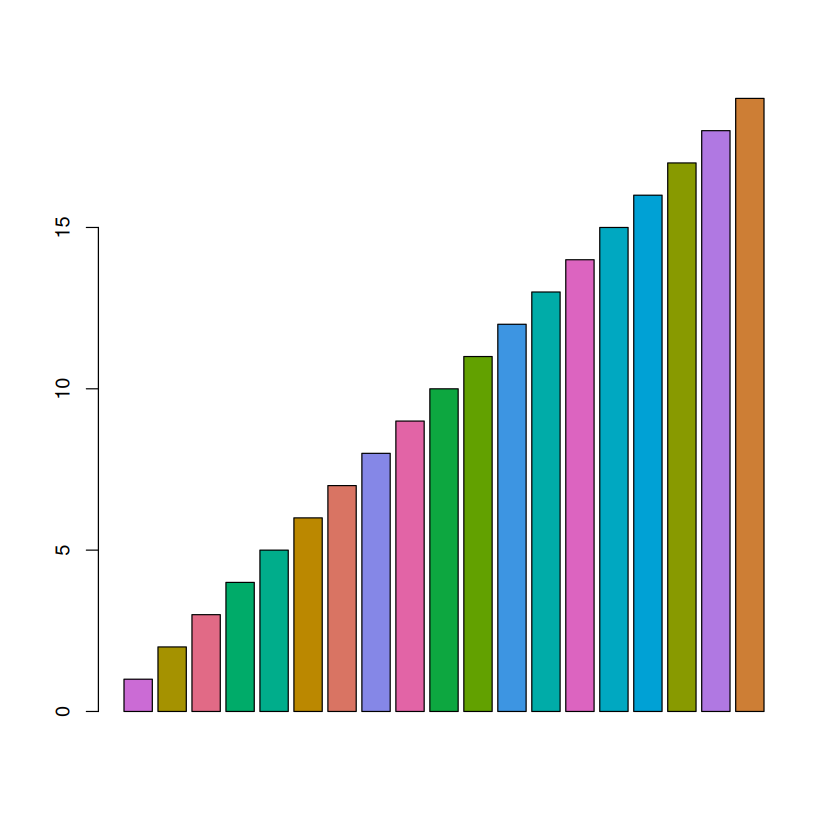

In [2]:
library(colorspace)

# Generate a large color palette
n_colors <- 19  # Number of colors needed
my_colors <- qualitative_hcl(n_colors, palette = "Dark 3")

set.seed(42)  # Setting seed for reproducibility
randomized_colors <- sample(my_colors)

# Plot using the generated colors
barplot(1:n_colors, col = randomized_colors)

CSIZE <- 14
CLSIZE <- 10
CLXSIZE <- 10
STEP <- 2

In [3]:
path_out <- "../plt-in/"
path_in <- "../plt-in/"
save_to <- "../tex/imgs_2/"

general <- read.csv(paste(path_out, '1999_2022_.csv', sep=''))
age <- read.csv(paste(path_out, '1999_2022_age.csv', sep=''))
sex <- read.csv(paste(path_out, '1999_2022_sex.csv', sep=''))
place <- read.csv(paste(path_out, '1999_2022_place.csv', sep=''))
way <- read.csv(paste(path_out, '1999_2022_way.csv', sep=''))
reason <- read.csv(paste(path_out, '1999_2022_rea.csv', sep=''))
population <- read.csv(paste(path_in, 'ludnosc.csv', sep=''))
status <- read.csv(paste(path_out, '1999_2022_sta.csv', sep=''))
education <- read.csv(paste(path_out, '1999_2022_ed.csv', sep=''))
job <- read.csv(paste(path_out, '1999_2022_job.csv', sep=''))
employment <- read.csv(paste(path_out, '2010_2022_employment.csv', sep=''))
income <- read.csv(paste(path_out, '1999_2022_income.csv', sep = ''))

In [4]:
head(income)

,year,income
,<int>,<dbl>
1,1999,20480.88
2,2000,23085.72
3,2001,24742.20
4,2002,25598.52
5,2003,26417.64
6,2004,27474.84


In [5]:
# rename columns for better readability
general <- general %>% rename(
  Year = year,
  City = garnizon,
  Outcome = outcome,
  Suicides = suicides,
)

age <- age %>% rename(
    Year = year,
    City = garnizon,
    Age = age,
    Outcome = outcome,
    Suicides = suicides,
)

sex <- sex %>% rename(
    Year = year,
    City = garnizon,
    Sex = sex,
    Outcome = outcome,
    Suicides = suicides
)

place <- place %>% rename(
    Year = year,
    City = garnizon,
    Place = place,
    Outcome = outcome,
    Suicides = suicides
)

way <- way %>% rename(
    Year = year,
    City = garnizon,
    Method = method,
    Outcome = outcome,
    Suicides = suicides
)

reason <- reason %>% rename(
    Year = year,
    City = garnizon,
    Reason = reason,
    Outcome = outcome,
    Suicides = suicides
)

population <- population %>% rename(
    City = garnizon,
    Population = population
)

status <- status %>% rename(
    Year = year,
    City = garnizon,
    `Civil status` = civil_status,
    Outcome = outcome,
    Suicides = suicides
)

education <- education %>% rename(
    Year = year,
    City = garnizon,
    Education = education,
    Outcome = outcome,
    Suicides = suicides
)

job <- job %>% rename(
    Year = year,
    City = garnizon,
    Occupation = job,
    Outcome = outcome,
    Suicides = suicides
)

employment <- employment %>% rename(
    Year = year,
    Employment = employment,
)

income <- income %>% rename(
    Year = year,
    Income = income
)

In [6]:
# Adding up the suicides for each city
poland_general <- general %>% 
    group_by(Year, Outcome) %>%
    summarize(`Total suicides` = sum(Suicides), .groups = 'drop')

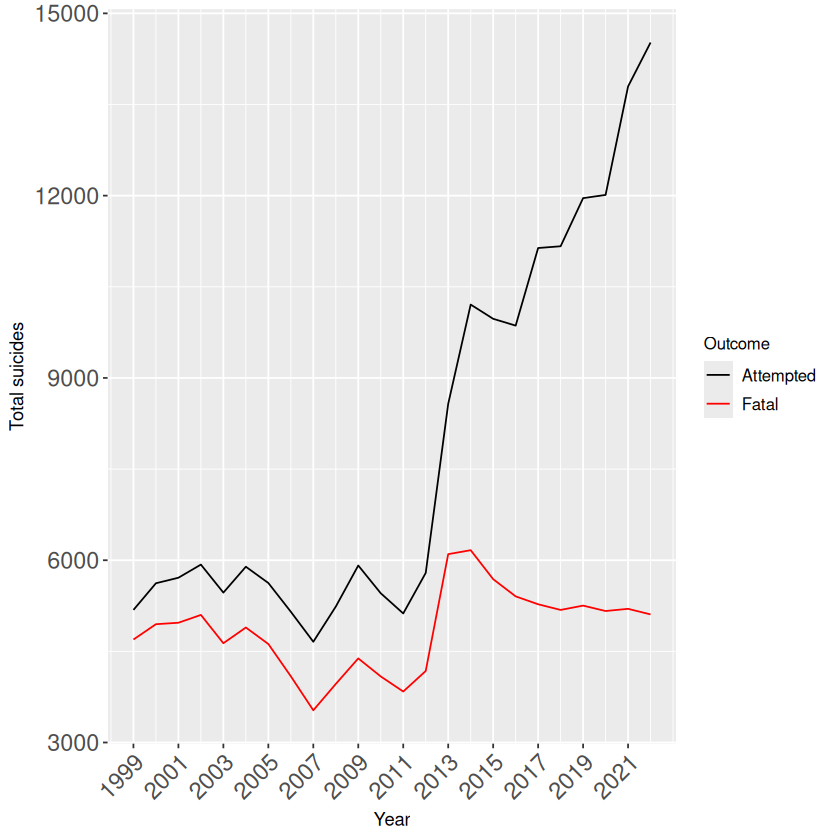

In [7]:
# Comparison of fatal vs attempted suicides in Poland
poland_general %>% ggplot(aes(x=Year,y=`Total suicides`)) +
    geom_line(aes(colour = Outcome)) + 
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    scale_colour_manual(values = c("Fatal" = "red", "Attempted" = "black")) -> p
p <- p + scale_x_continuous(breaks = seq(min(poland_general$Year), max(poland_general$Year), by = STEP))
p

In [8]:
poland_general %>% filter(Year == 2022)

Year,Outcome,Total suicides
<int>,<chr>,<int>
2022,Attempted,14520
2022,Fatal,5108


In [9]:
# Saving the plot
ggsave(filename = paste(save_to, "poland_general.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

In [10]:
# Trend of the ratio of fatal over attempted suicides in Poland
poland_general_fatal_over_attempted <- poland_general %>%
    pivot_wider(names_from=Outcome, values_from=`Total suicides`) %>%
    mutate(`Fatal / Attempted` = Fatal / Attempted * 100) %>%
    select(Year, `Fatal / Attempted`)
# poland_general_fatal_over_attempted

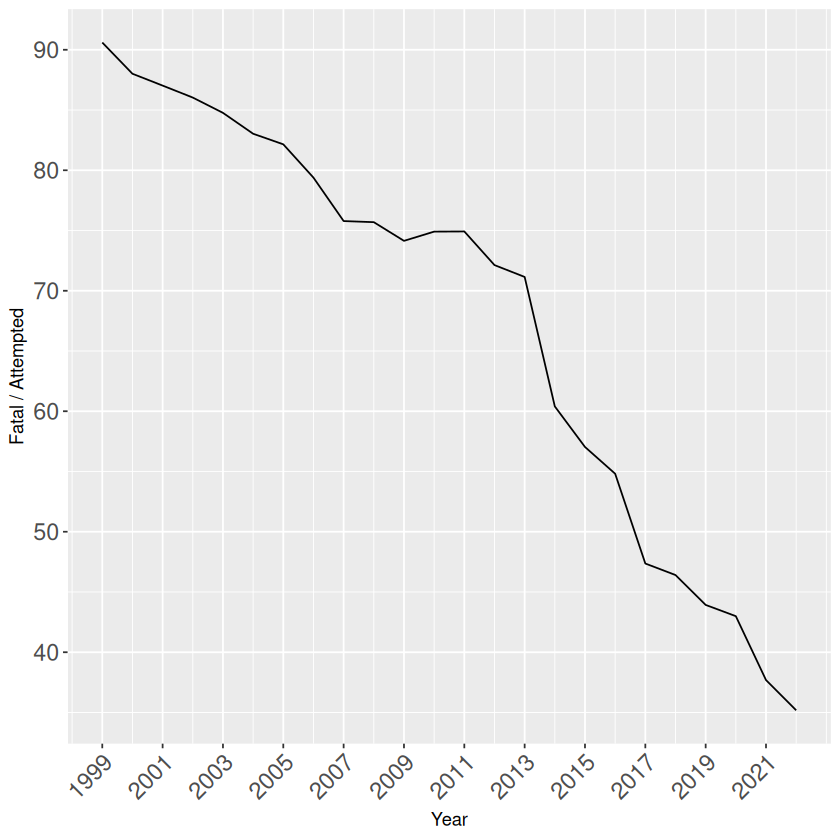

In [11]:
poland_general_fatal_over_attempted %>% ggplot(aes(x=Year, y=`Fatal / Attempted`)) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(color = "black") -> p
p <- p + scale_x_continuous(breaks = seq(min(poland_general_fatal_over_attempted$Year), max(poland_general_fatal_over_attempted$Year), by = STEP))
p

In [12]:
ggsave(filename = paste(save_to, "poland_foa.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

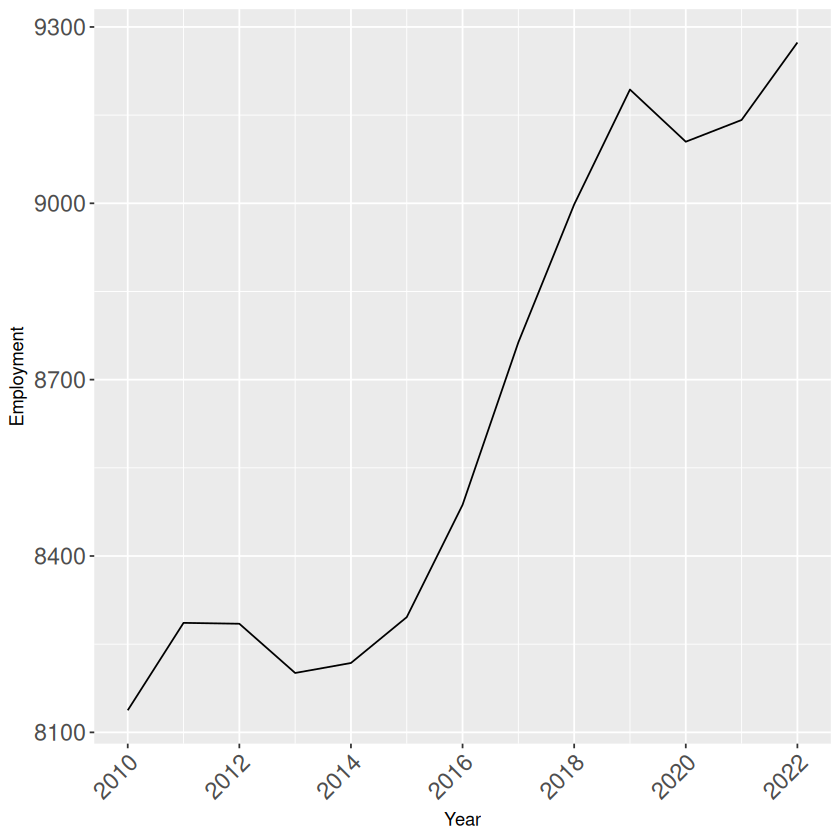

In [13]:
# Employment 
employment %>%
    ggplot(aes(x=Year, y=Employment)) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(color = "black") -> p
p <- p + scale_x_continuous(breaks = seq(min(employment$Year), max(employment$Year), by = STEP))
p

In [14]:
ggsave(filename = paste(save_to, "employment.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

In [15]:
age$Age %>% unique()

[1] "0-6"          "7-12"         "13-18"        "19-24"        "25-29"       
 [6] "30-34"        "35-39"        "40-44"        "45-49"        "50-54"       
[11] "55-59"        "60-64"        "65-69"        "70-74"        "75-79"       
[16] "80-84"        "85+"          "undetermined"

In [16]:
age %>% filter(Age %in% c("30-39", "40-49"))

Year,City,Age,Suicides,Outcome
<int>,<chr>,<chr>,<int>,<chr>


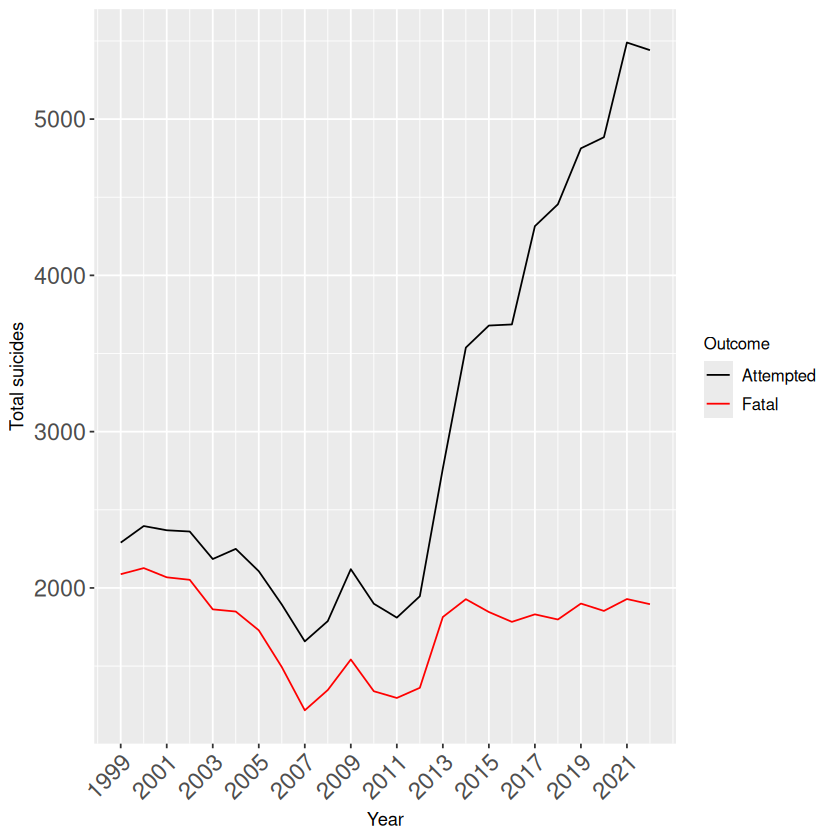

In [17]:
age %>% filter(Age %in% c("30-34", "35-39", "40-44", "45-49")) %>%
    group_by(Year, Outcome) %>%
    summarize(`Total suicides` = sum(Suicides), .groups = 'drop') %>%
    ggplot(aes(x=Year, y=`Total suicides`)) +
    geom_line(aes(colour = Outcome)) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    scale_colour_manual(values = c("Fatal" = "red", "Attempted" = "black")) -> p
p <- p + scale_x_continuous(breaks = seq(min(age$Year), max(age$Year), by = STEP))
p   

In [18]:
ggsave(filename = paste(save_to, "age_30_49.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

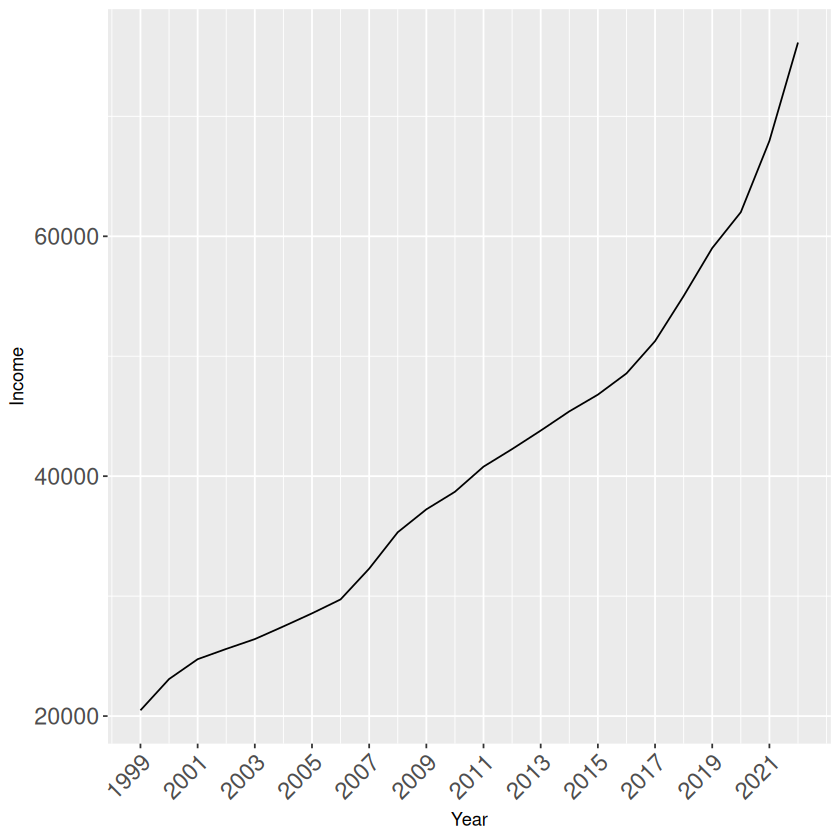

In [19]:
income %>% 
    ggplot(aes(x=Year, y=Income)) + 
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line() -> p
p <- p + scale_x_continuous(breaks = seq(min(income$Year), max(income$Year), by = STEP))
p

In [20]:
ggsave(filename = paste(save_to, "income.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

In [21]:
poland_age <- age %>% 
    group_by(Year, Outcome, Age) %>%
    summarize(`Total suicides` = sum(Suicides), .groups = 'drop')
poland_age

Year,Outcome,Age,Total suicides
<int>,<chr>,<chr>,<int>
1999,Attempted,0-6,10
1999,Attempted,13-18,318
1999,Attempted,19-24,520
1999,Attempted,25-29,351
1999,Attempted,30-34,369
1999,Attempted,35-39,506
1999,Attempted,40-44,696
1999,Attempted,45-49,719
1999,Attempted,50-54,460


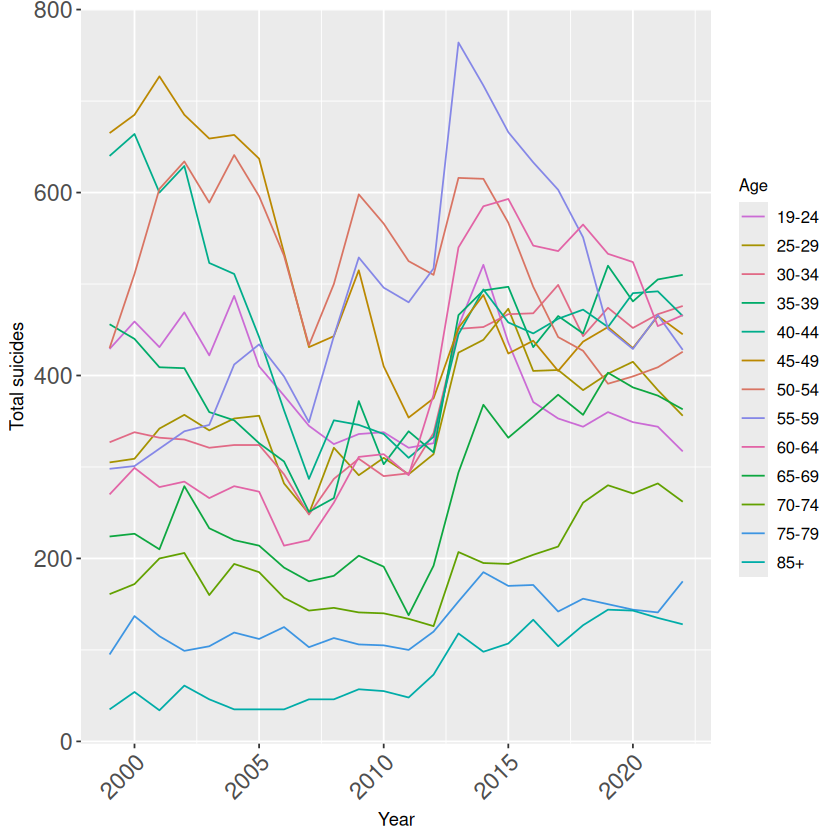

In [22]:
poland_age %>% filter(Age == "19-24" | Age == "25-29" | Age == "30-34" | Age == "35-39" |
                      Age == "40-44" | Age == "45-49" | Age == "50-54" | Age == "55-59" | 
                      Age == "60-64" | Age == "65-69" | Age == "70-74" | Age == "75-79" |
                      Age == "80-85" | Age == "85+") %>%
    filter(Outcome=="Fatal" & Year >= 1999) %>%
    ggplot(aes(x=Year, y=`Total suicides`)) +
    geom_line(aes(colour=Age)) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    scale_color_manual(values = randomized_colors) -> p
    #theme_minimal() -> p
# p <- p + scale_x_continuous(breaks = seq(min(poland_age$Year), max(poland_age$Year), by = 1))
p

In [23]:
ggsave(filename = paste(save_to, "pl-fat-19_85-1999.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

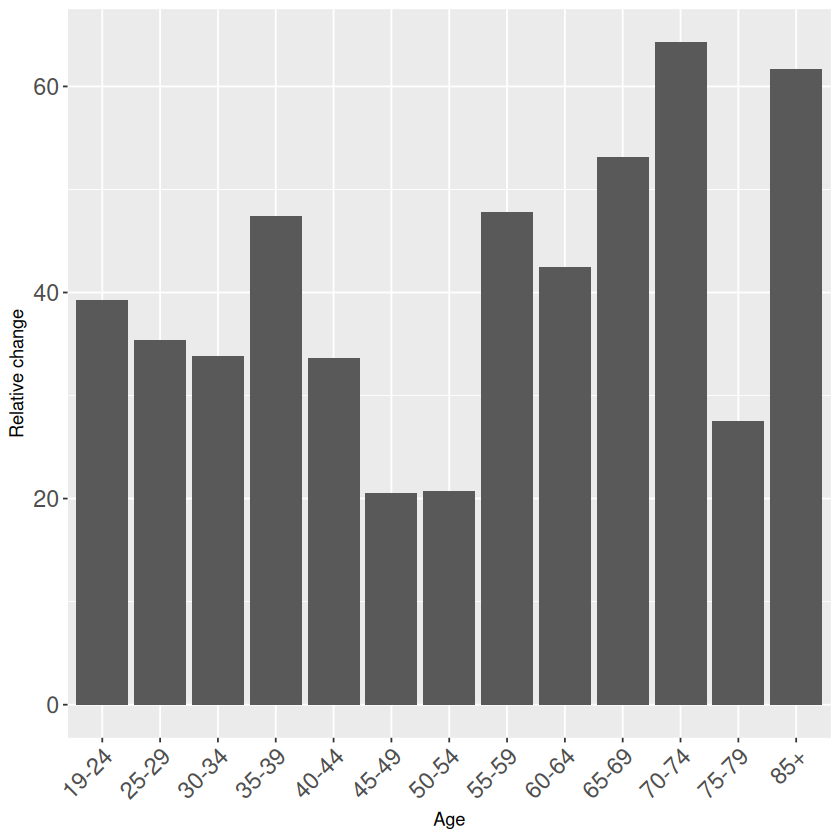

In [24]:
# Checking the relative change from 2012 to 2013 for all age groups 
# and plotting in a bar chart with groups of age on x axis and the relative change on y axis
poland_age %>% filter(Age == "19-24" | Age == "25-29" | Age == "30-34" | Age == "35-39" |
                      Age == "40-44" | Age == "45-49" | Age == "50-54" | Age == "55-59" | 
                      Age == "60-64" | Age == "65-69" | Age == "70-74" | Age == "75-79" |
                      Age == "80-85" | Age == "85+") %>%
    filter(Outcome=="Fatal" & (Year == 2012 | Year == 2013)) %>%
    group_by(Age) %>%
    summarize(`Relative change` = (diff(`Total suicides`) / `Total suicides`[1]) * 100, .groups = 'drop') %>%
    ggplot(aes(x=Age, y=`Relative change`)) +
    geom_bar(stat="identity") +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE)) -> p
    # scale_fill_manual(values = randomized_colors) +
    #theme_minimal() -> p
# p <- p + scale_y_continuous(limits = c(-50,250))
p

In [25]:
ggsave(filename = paste(save_to, "pl-fat-19_85-12_13.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

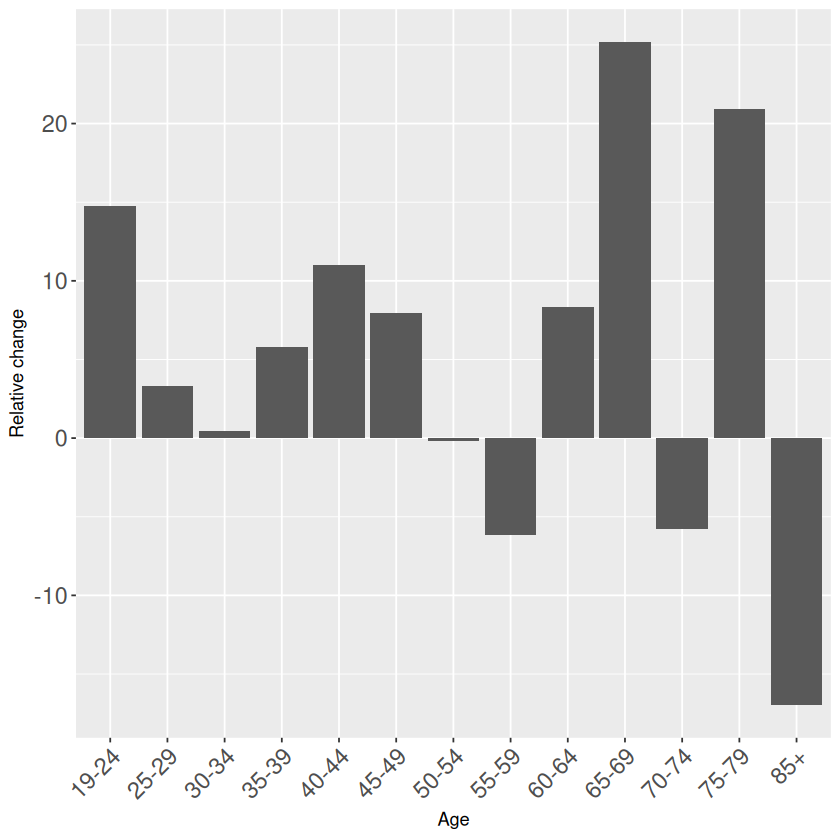

In [26]:
# Checking the increment from 2013 to 2014 for all age groups 
# and plotting in a bar chart with groups of age on x axis and the increment on y axis
poland_age %>% filter(Age == "19-24" | Age == "25-29" | Age == "30-34" | Age == "35-39" |
                      Age == "40-44" | Age == "45-49" | Age == "50-54" | Age == "55-59" | 
                      Age == "60-64" | Age == "65-69" | Age == "70-74" | Age == "75-79" |
                      Age == "80-85" | Age == "85+") %>%
    filter(Outcome=="Fatal" & (Year == 2013 | Year == 2014)) %>%
    group_by(Age) %>%
    summarize(`Relative change` = (diff(`Total suicides`) / `Total suicides`[1]) * 100, .groups = 'drop') %>%
    ggplot(aes(x=Age, y=`Relative change`)) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_bar(stat="identity") -> p
# p <- p + scale_y_continuous(limits = c(-50,250))
p

In [27]:
ggsave(filename = paste(save_to, "pl-fat-19_85-13_14.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

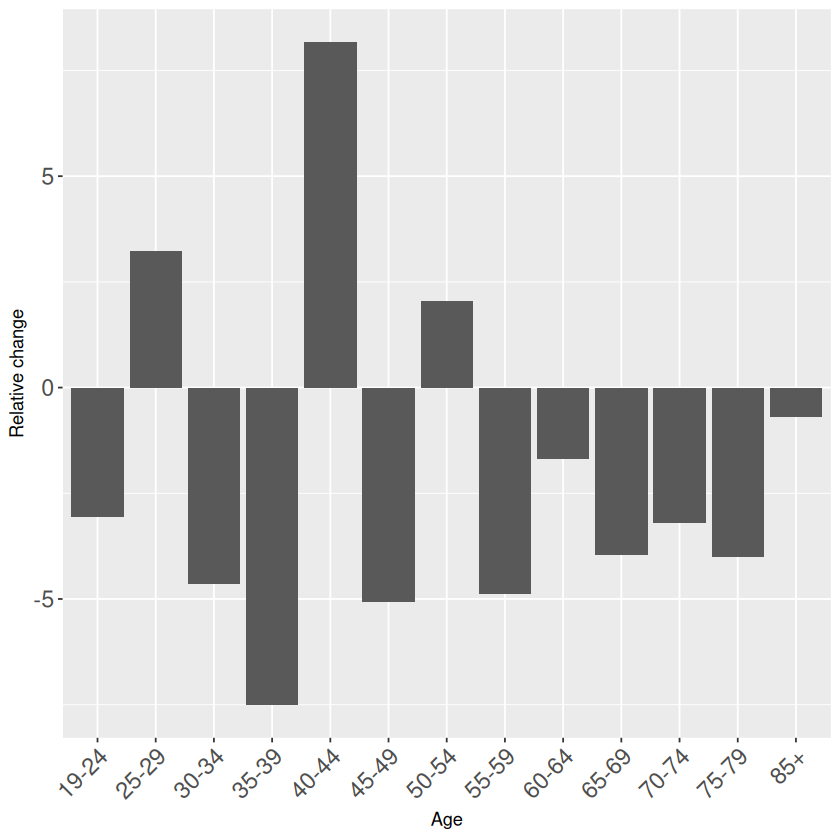

In [28]:
# Checking the increment from 2019 to 2020 for all age groups 
# and plotting in a bar chart with groups of age on x axis and the increment on y axis
poland_age %>% filter(Age == "19-24" | Age == "25-29" | Age == "30-34" | Age == "35-39" |
                      Age == "40-44" | Age == "45-49" | Age == "50-54" | Age == "55-59" | 
                      Age == "60-64" | Age == "65-69" | Age == "70-74" | Age == "75-79" |
                      Age == "80-85" | Age == "85+") %>%
    filter(Outcome=="Fatal" & (Year == 2019 | Year == 2020)) %>%
    group_by(Age) %>%
    summarize(`Relative change` = (diff(`Total suicides`) / `Total suicides`[1]) * 100, .groups = 'drop') %>%
    ggplot(aes(x=Age, y=`Relative change`)) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_bar(stat="identity") -> p
# p <- p + scale_y_continuous(limits = c(-50,250))
p

In [29]:
ggsave(filename = paste(save_to, "pl-fat-19_85-19_20.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

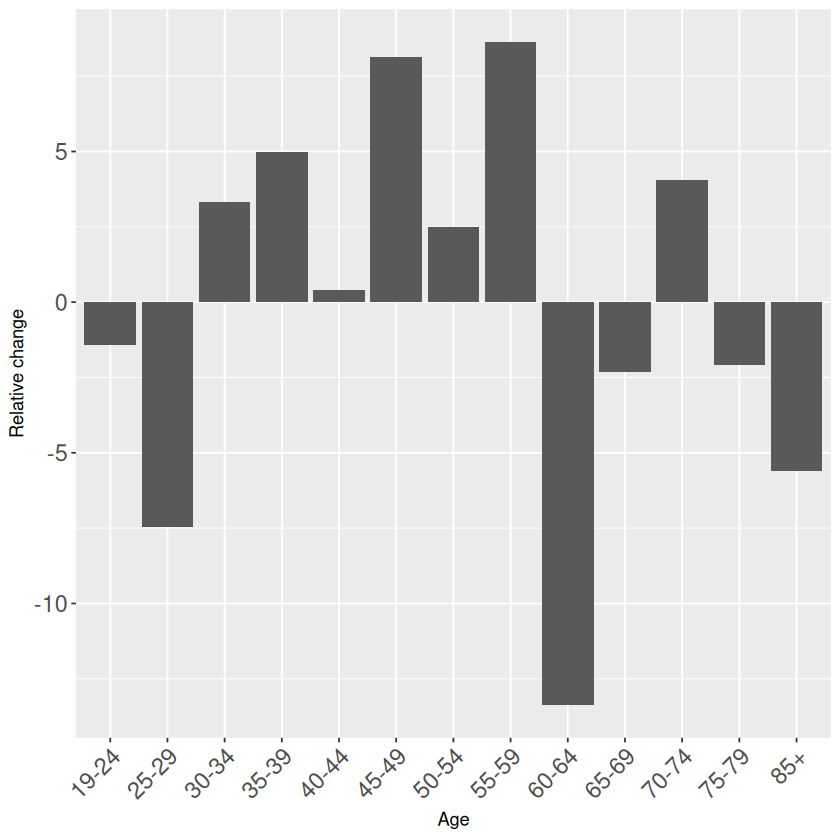

In [30]:
# Checking the increment from 2020 to 2021 for all age groups 
# and plotting in a bar chart with groups of age on x axis and the increment on y axis
poland_age %>% filter(Age == "19-24" | Age == "25-29" | Age == "30-34" | Age == "35-39" |
                      Age == "40-44" | Age == "45-49" | Age == "50-54" | Age == "55-59" | 
                      Age == "60-64" | Age == "65-69" | Age == "70-74" | Age == "75-79" |
                      Age == "80-85" | Age == "85+") %>%
    filter(Outcome=="Fatal" & (Year == 2020 | Year == 2021)) %>%
    group_by(Age) %>%
    summarize(`Relative change` = (diff(`Total suicides`) / `Total suicides`[1]) * 100, .groups = 'drop') %>%
    ggplot(aes(x=Age, y=`Relative change`)) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_bar(stat="identity") -> p
# p <- p + scale_y_continuous(limits = c(-50,250))
p

In [31]:
ggsave(filename = paste(save_to, "pl-fat-19_85-20_21.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

In [32]:
head(general)

,Year,City,Outcome,Suicides
,<int>,<chr>,<chr>,<int>
1,1999,Białystok,Attempted,216
2,1999,Białystok,Fatal,190
3,1999,Bydgoszcz,Attempted,263
4,1999,Bydgoszcz,Fatal,248
5,1999,Gdańsk,Attempted,325
6,1999,Gdańsk,Fatal,300


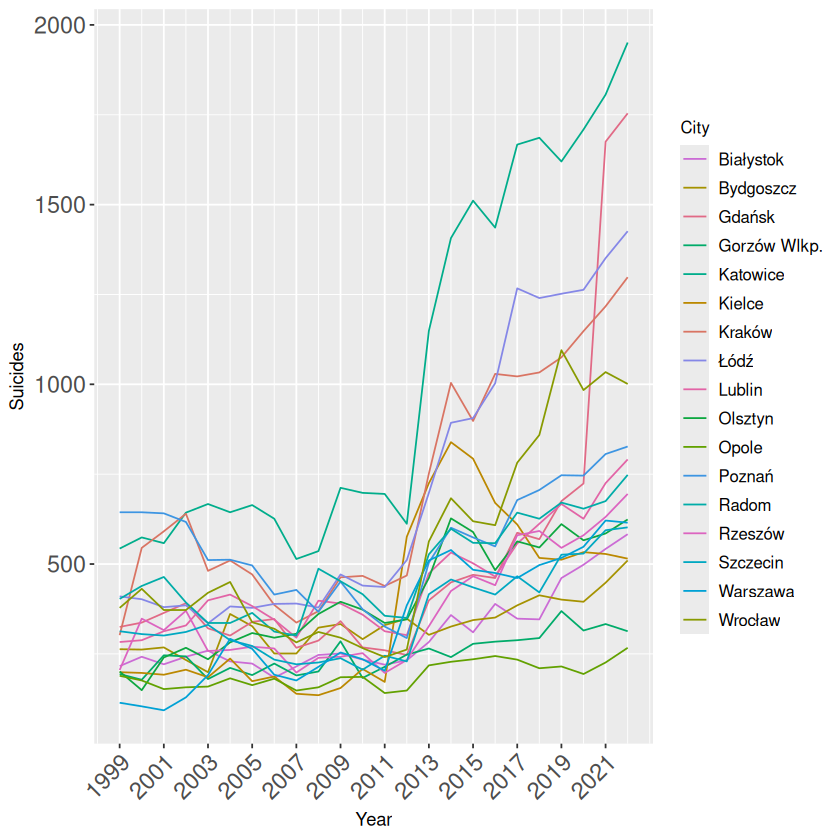

In [33]:
# Line chart of the number of attempted suicides for different cities by year
general %>% filter(Year >= 1999 & Year <= 2022 & Outcome == "Attempted") %>%
    ggplot(aes(x=Year, y=Suicides)) +
    geom_line(aes(colour=City)) +
    scale_color_manual(values=randomized_colors) +
    scale_x_continuous(breaks = seq(min(general$Year), max(general$Year), by = STEP)) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE)) -> p
    #theme_minimal() -> p
p

In [34]:
ggsave(filename = paste(save_to, "city_attempted.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”


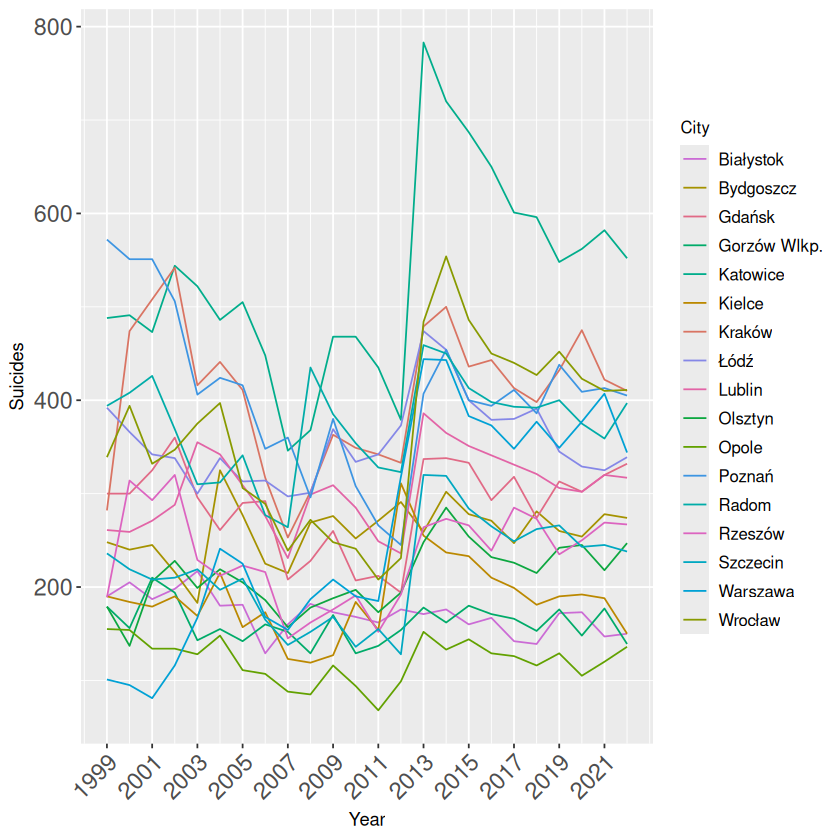

In [35]:
# Line chart of the number of fatal suicides for different cities by year
general %>% filter(Year >= 1999 & Year <= 2022 & Outcome == "Fatal") %>%
    ggplot(aes(x=Year, y=Suicides)) +
    scale_color_manual(values=randomized_colors) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(colour=City)) -> p
p <- p + scale_x_continuous(breaks = seq(min(general$Year), max(general$Year), by = STEP))
p

In [36]:
ggsave(filename = paste(save_to, "city_fatal.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”


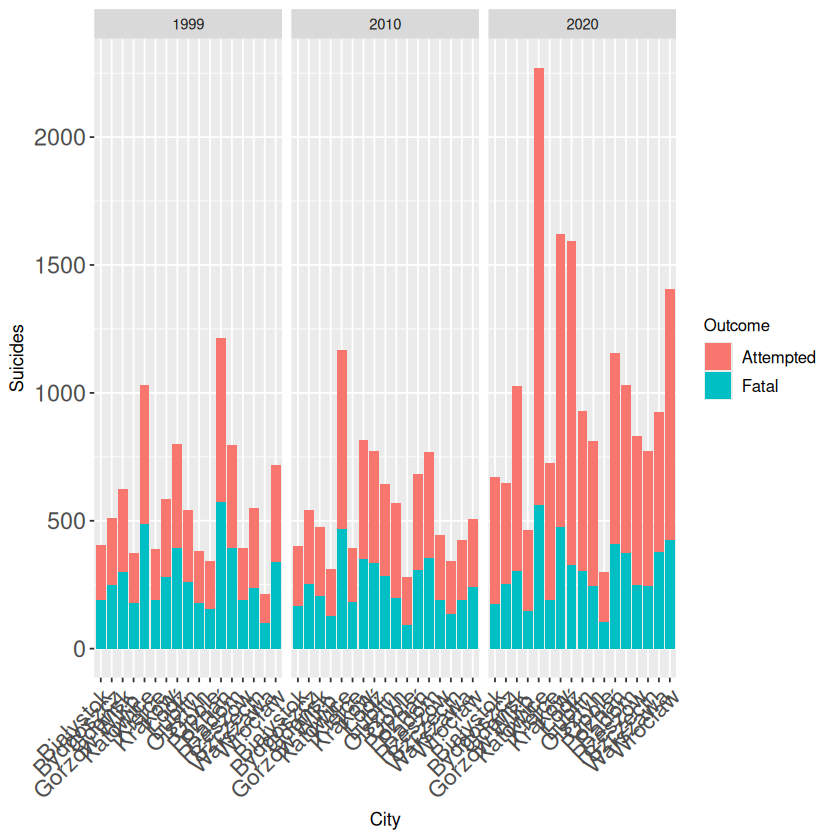

In [37]:
# Grid  of bar charts for each city showing the attempted and fatal suicides for 
# 2000, 2005, 2010, 2015, 2020,
# sorted in descending order of fatal suicides

general %>% filter(Year %in% c(1999, 2010, 2020)) %>%
    ggplot(aes(x=City, y=Suicides)) +
    geom_bar(stat="identity", aes(fill=Outcome)) +
    facet_wrap(~Year) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE)) -> p 
    #theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
    # sort descending by Fatal
p

In [38]:
ggsave(filename = paste(save_to, "city_suicides-991020.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

In [39]:
head(poland_age)

Year,Outcome,Age,Total suicides
<int>,<chr>,<chr>,<int>
1999,Attempted,0-6,10
1999,Attempted,13-18,318
1999,Attempted,19-24,520
1999,Attempted,25-29,351
1999,Attempted,30-34,369
1999,Attempted,35-39,506


In [40]:
poland_age_fatal_over_attempted <- poland_age %>%
    pivot_wider(names_from = Outcome, values_from = `Total suicides`) %>%
    mutate(Ratio = Fatal/Attempted * 100) %>%
    select(Year, Age, Ratio)
head(poland_age_fatal_over_attempted)

Year,Age,Ratio
<int>,<chr>,<dbl>
1999,0-6,90.00000
1999,13-18,78.93082
1999,19-24,82.50000
1999,25-29,86.89459
1999,30-34,88.61789
1999,35-39,90.11858


In [41]:
head(general)

,Year,City,Outcome,Suicides
,<int>,<chr>,<chr>,<int>
1,1999,Białystok,Attempted,216
2,1999,Białystok,Fatal,190
3,1999,Bydgoszcz,Attempted,263
4,1999,Bydgoszcz,Fatal,248
5,1999,Gdańsk,Attempted,325
6,1999,Gdańsk,Fatal,300


In [42]:
population

City,Population
<chr>,<int>
Warszawa,1790658
Białystok,293407
Bydgoszcz,354006
Gdańsk,582205
Gorzów Wlkp.,122141
Katowice,302397
Kielce,195942
Kraków,766683
Łódź,696708


In [43]:
city_op <- general %>% 
    left_join(population, by=c('City')) %>%
    mutate(`Suicides / Population` = Suicides/Population*100) %>%
    select(City, Year, Outcome, `Suicides / Population`)

head(city_op)

,City,Year,Outcome,Suicides / Population
,<chr>,<int>,<chr>,<dbl>
1,Białystok,1999,Attempted,0.07361788
2,Białystok,1999,Fatal,0.06475646
3,Bydgoszcz,1999,Attempted,0.07429253
4,Bydgoszcz,1999,Fatal,0.07005531
5,Gdańsk,1999,Attempted,0.05582226
6,Gdańsk,1999,Fatal,0.05152824


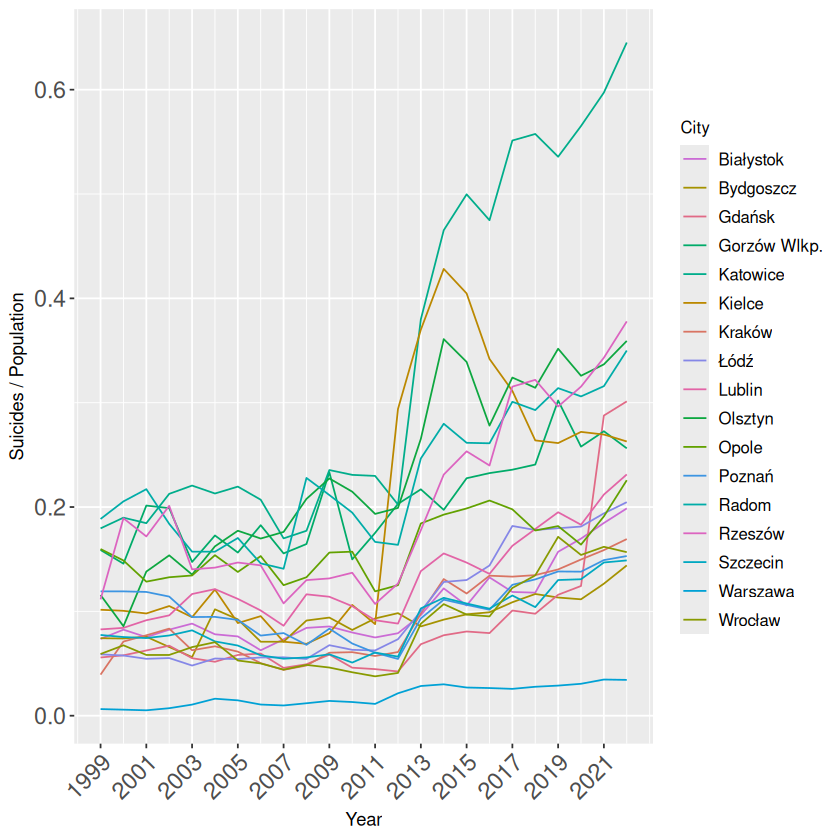

In [44]:
city_op %>% filter(Outcome == "Attempted") %>%
    ggplot(aes(x=Year,y=`Suicides / Population`)) +
    scale_color_manual(values = randomized_colors) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(colour=City)) -> p
p <- p + scale_x_continuous(breaks = seq(min(city_op$Year), max(city_op$Year), by = STEP))
p


In [45]:
ggsave(filename=paste(save_to, "city_att.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”


In [46]:
city_op %>% filter(Outcome == "Attempted" & Year == 2022)

City,Year,Outcome,Suicides / Population
<chr>,<int>,<chr>,<dbl>
Białystok,2022,Attempted,0.19870010
Bydgoszcz,2022,Attempted,0.14406535
Gdańsk,2022,Attempted,0.30126845
Gorzów Wlkp.,2022,Attempted,0.25626121
Katowice,2022,Attempted,0.64517836
Kielce,2022,Attempted,0.26283288
Kraków,2022,Attempted,0.16930074
Łódź,2022,Attempted,0.20467685
Lublin,2022,Attempted,0.23126018


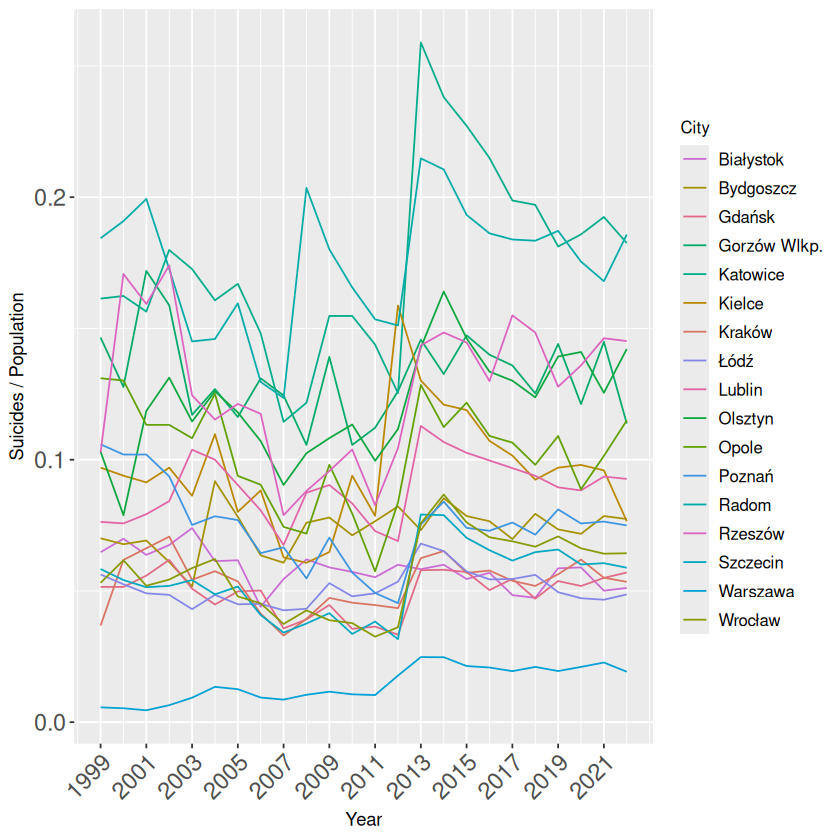

In [47]:
city_op %>% filter(Outcome == "Fatal") %>%
    ggplot(aes(x=Year,y=`Suicides / Population`)) +
    scale_color_manual(values = randomized_colors) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(colour=City)) -> p
p <- p + scale_x_continuous(breaks = seq(min(city_op$Year), max(city_op$Year), by = STEP))
p


In [48]:
ggsave(filename=paste(save_to, "city_fat.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”


In [49]:
city_op %>% filter(Outcome == "Fatal" & Year == 2022)

City,Year,Outcome,Suicides / Population
<chr>,<int>,<chr>,<dbl>
Białystok,2022,Fatal,0.05112352
Bydgoszcz,2022,Fatal,0.07739982
Gdańsk,2022,Fatal,0.05702459
Gorzów Wlkp.,2022,Fatal,0.11380290
Katowice,2022,Fatal,0.18254149
Kielce,2022,Fatal,0.07655327
Kraków,2022,Fatal,0.05347712
Łódź,2022,Fatal,0.04865740
Lublin,2022,Fatal,0.09267949


In [50]:
# # TEST FOR COHERENCE
# city_op_foa <- city_op %>%
#     pivot_wider(names_from=Outcome, values_from=`Suicides / Population`) %>%
#     mutate(Ratio = Fatal/Attempted * 100) %>%
#     select(Year, City, Ratio)
# head(city_op_foa)

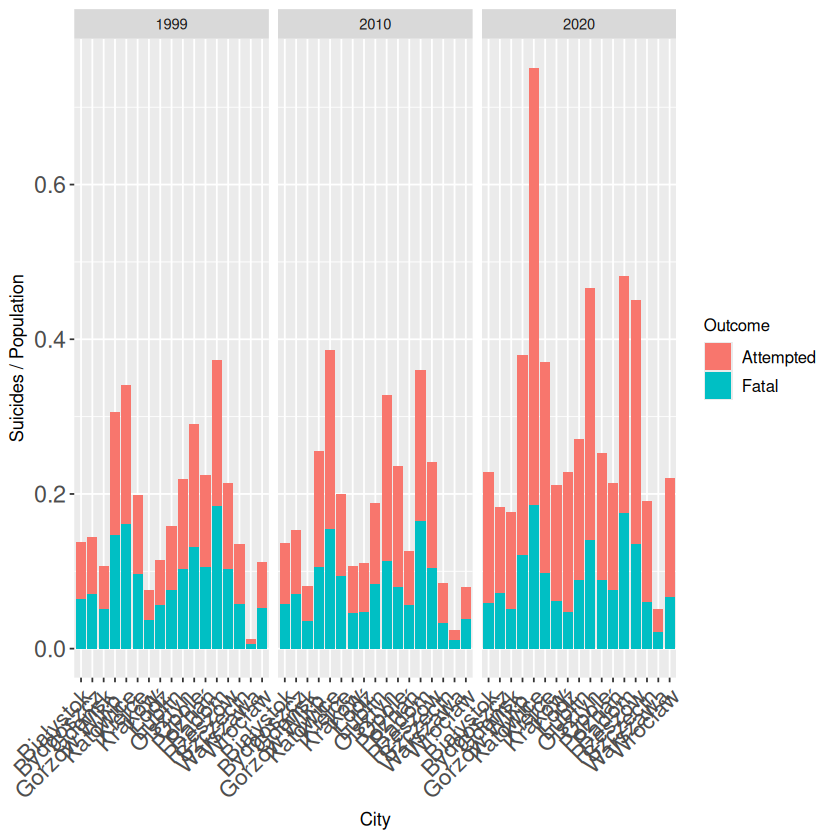

In [51]:
city_op %>% filter(Year %in% c(1999,2010,2020)) %>%
    ggplot(aes(x=City,y=`Suicides / Population`)) +
    geom_bar(stat="identity", aes(fill=Outcome)) +
    facet_wrap(~Year) + 
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE)) -> p 
    #theme(axis.text.x = element_text(angle=45, hjust=1)) ->p
p

In [52]:
ggsave(filename=paste(save_to, "city_op-991029.pdf",sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

In [53]:
city_foa <- general %>%
    pivot_wider(names_from = Outcome, values_from=Suicides) %>%
    mutate(Ratio = Fatal/Attempted * 100) %>%
    select(Year, City, Ratio)

head(city_foa)

Year,City,Ratio
<int>,<chr>,<dbl>
1999,Białystok,87.96296
1999,Bydgoszcz,94.29658
1999,Gdańsk,92.30769
1999,Gorzów Wlkp.,92.26804
1999,Katowice,89.87109
1999,Kielce,95.47739


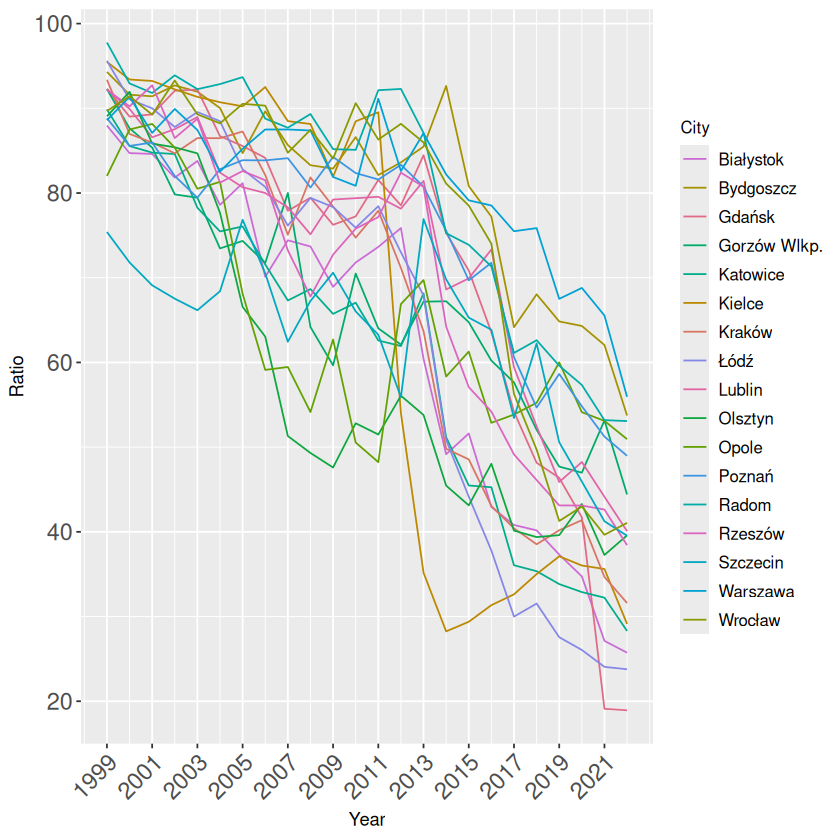

In [54]:
city_foa %>%
    ggplot(aes(x=Year, y=Ratio)) + 
    scale_color_manual(values = randomized_colors) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(colour=City)) -> p
p <- p + scale_x_continuous(breaks=seq(min(city_foa$Year), max(city_foa$Year), by=STEP))
p

In [55]:
ggsave(filename=paste(save_to, "city_foa.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”


In [56]:
city_foa %>% filter(Year == 2022)

Year,City,Ratio
<int>,<chr>,<dbl>
2022,Białystok,25.72899
2022,Bydgoszcz,53.72549
2022,Gdańsk,18.92816
2022,Gorzów Wlkp.,44.40895
2022,Katowice,28.29318
2022,Kielce,29.12621
2022,Kraków,31.58706
2022,Łódź,23.77279
2022,Lublin,40.07585


---

# Age, Sex, ...

In [57]:
head(age)

,Year,City,Age,Suicides,Outcome
,<int>,<chr>,<chr>,<int>,<chr>
1,1999,Wrocław,0-6,1,Attempted
2,1999,Bydgoszcz,0-6,0,Attempted
3,1999,Lublin,0-6,2,Attempted
4,1999,Gorzów Wlkp.,0-6,1,Attempted
5,1999,Łódź,0-6,2,Attempted
6,1999,Kraków,0-6,1,Attempted


In [58]:
age <- age %>%
    filter(Age != "0-6" & Age != "7-12" & Age != "undetermined") 

In [59]:
poland_age <- age %>%
    group_by(Year, Outcome, Age) %>%
    filter(Age != "0-6" & Age != "7-12" & Age != "undetermined") %>%
    summarize(`Total suicides` = sum(Suicides), .groups = 'drop')
head(poland_age)

Year,Outcome,Age,Total suicides
<int>,<chr>,<chr>,<int>
1999,Attempted,13-18,318
1999,Attempted,19-24,520
1999,Attempted,25-29,351
1999,Attempted,30-34,369
1999,Attempted,35-39,506
1999,Attempted,40-44,696


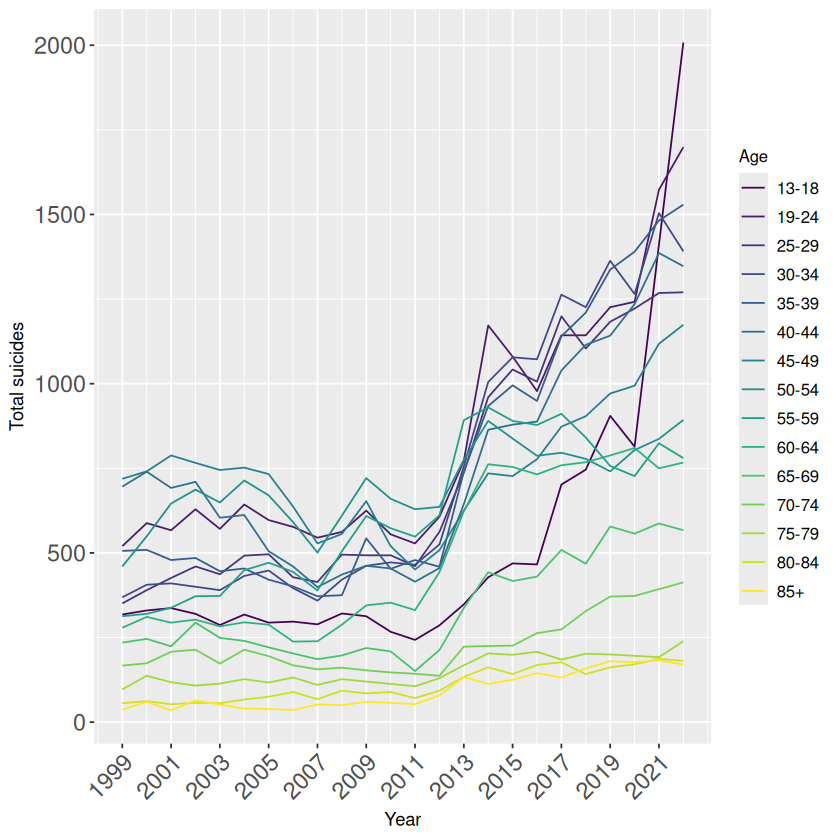

In [60]:
poland_age %>% filter(Outcome == "Attempted") %>%
    ggplot(aes(x=Year, y=`Total suicides`)) +
    geom_line(aes(colour=Age)) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    scale_color_viridis_d() -> p
p <- p + scale_x_continuous(breaks = seq(min(poland_age$Year), max(poland_age$Year), by = STEP))
p

In [61]:
ggsave(filename=paste(save_to, "age_attempted.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

In [62]:
poland_age %>% filter(Outcome == "Attempted" & Year == 2022)

Year,Outcome,Age,Total suicides
<int>,<chr>,<chr>,<int>
2022,Attempted,13-18,2008
2022,Attempted,19-24,1699
2022,Attempted,25-29,1270
2022,Attempted,30-34,1391
2022,Attempted,35-39,1529
2022,Attempted,40-44,1347
2022,Attempted,45-49,1174
2022,Attempted,50-54,893
2022,Attempted,55-59,780


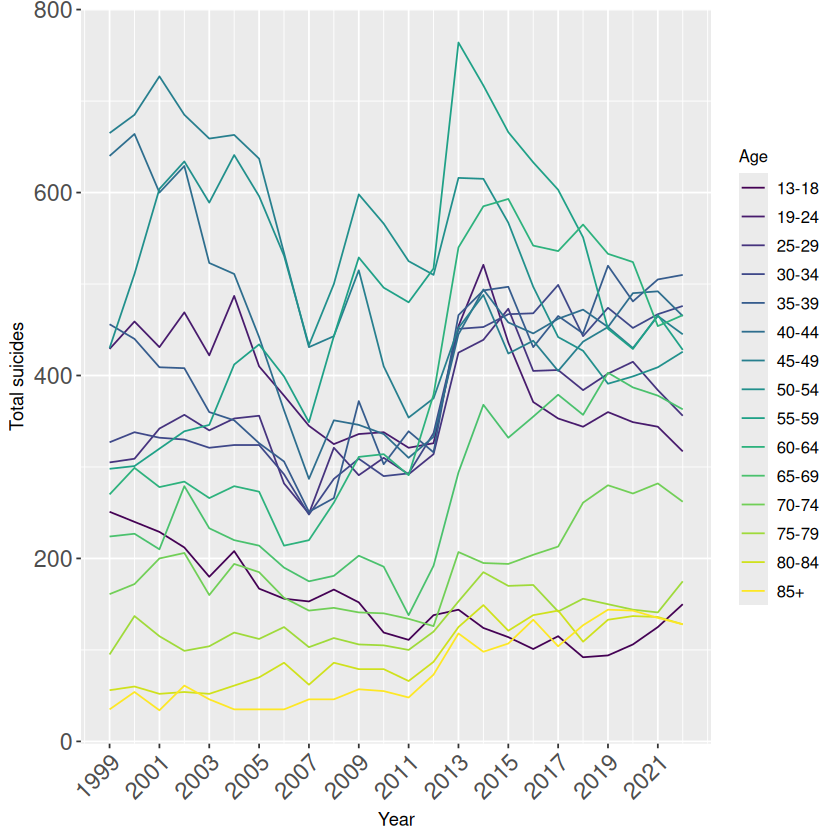

In [63]:
poland_age %>% filter(Outcome == "Fatal") %>%
    ggplot(aes(x=Year, y=`Total suicides`)) +
    # scale_fill_manual(values = randomized_colors) +
    geom_line(aes(colour=Age)) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    scale_color_viridis_d() -> p
p <- p + scale_x_continuous(breaks = seq(min(poland_age$Year), max(poland_age$Year), by = STEP))
p

In [64]:
ggsave(filename = paste(save_to, "age_fatal.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300) 

In [65]:
age_foa <- poland_age %>%
    pivot_wider(names_from=Outcome, values_from=`Total suicides`) %>%
    mutate(`Fatal / Attempted` = Fatal/Attempted * 100) %>%
    select(Year, Age, `Fatal / Attempted`)

head(age_foa)

Year,Age,Fatal / Attempted
<int>,<chr>,<dbl>
1999,13-18,78.93082
1999,19-24,82.50000
1999,25-29,86.89459
1999,30-34,88.61789
1999,35-39,90.11858
1999,40-44,91.95402


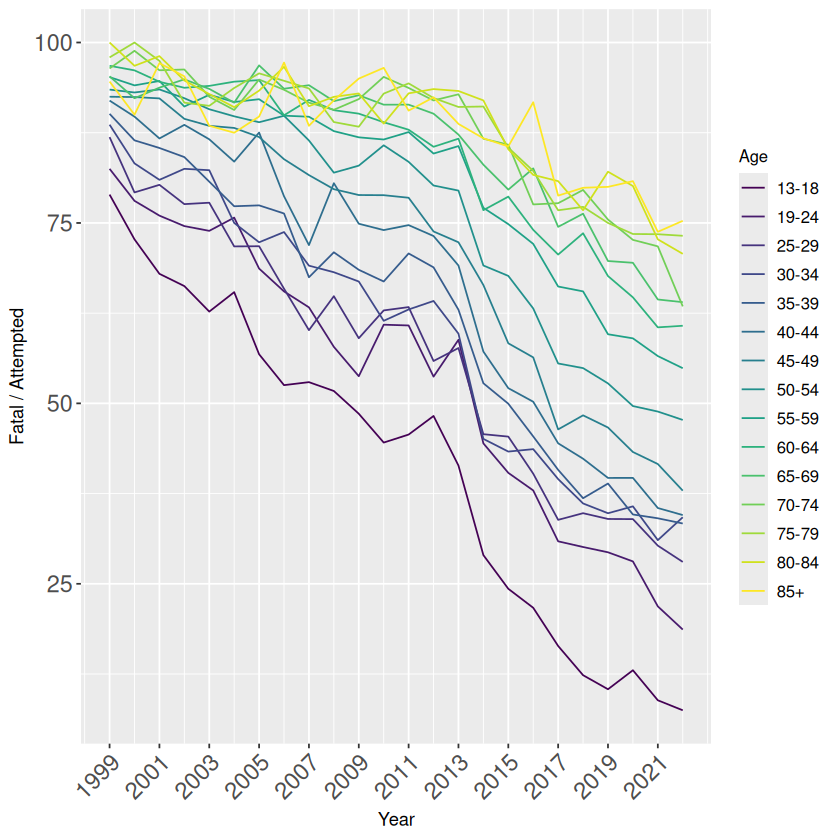

In [66]:
age_foa %>% 
    ggplot(aes(x=Year, y=`Fatal / Attempted`)) +
    scale_color_viridis_d() +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(colour=Age)) -> p
p <- p + scale_x_continuous(breaks = seq(min(age_foa$Year), max(age_foa$Year), by = STEP))
p

In [67]:
ggsave(filename = paste(save_to, "age_foa.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

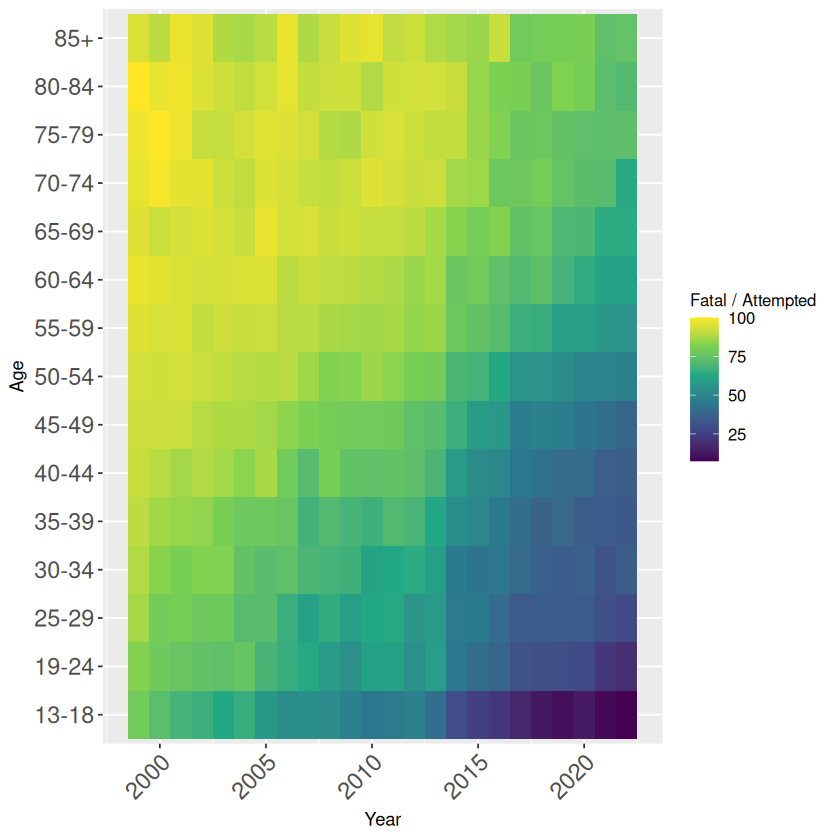

In [68]:
age_foa %>% filter(Age != "7-12" & Age != "0-6") %>%
    ggplot(aes(x=Year, y=Age, fill=`Fatal / Attempted`)) +
    geom_tile() +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    #theme(axis.text.x = element_text(angle=45, hjust=1)) + 
    scale_fill_viridis_c()->p 
p

In [69]:
ggsave(filename=paste(save_to, "age_foa_heat.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

In [70]:
age_city_op <- age %>%
    left_join(population, by=c('City')) %>%
    mutate(`Suicides / Population` = Suicides/Population*100) %>%
    select(City, Year, Age, Outcome, `Suicides / Population`)

head(age_city_op)

,City,Year,Age,Outcome,Suicides / Population
,<chr>,<int>,<chr>,<chr>,<dbl>
1,Wrocław,1999,13-18,Attempted,0.002818405
2,Bydgoszcz,1999,13-18,Attempted,0.005084660
3,Lublin,1999,13-18,Attempted,0.004970193
4,Gorzów Wlkp.,1999,13-18,Attempted,0.010643437
5,Łódź,1999,13-18,Attempted,0.002152982
6,Kraków,1999,13-18,Attempted,0.001565184


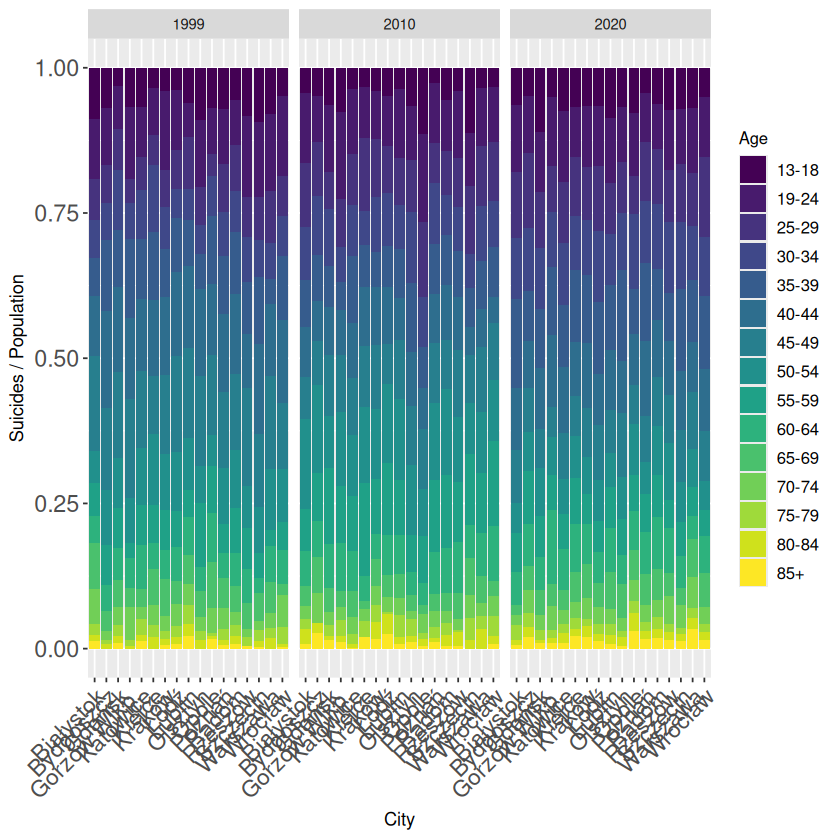

In [71]:
age_city_op %>% filter(Year %in% c(1999,2010,2020) & Outcome == "Attempted") %>%
    ggplot(aes(x=City, y=`Suicides / Population`)) +
    scale_fill_viridis_d() + 
    geom_bar(stat="identity", aes(fill=Age), position="fill") +
    facet_wrap(~Year) + 
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE)) -> p
    #theme(axis.text.x = element_text(angle=45, hjust=1)) -> p
p

In [72]:
ggsave(filename = paste(save_to, "age_city_att_op-991020.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

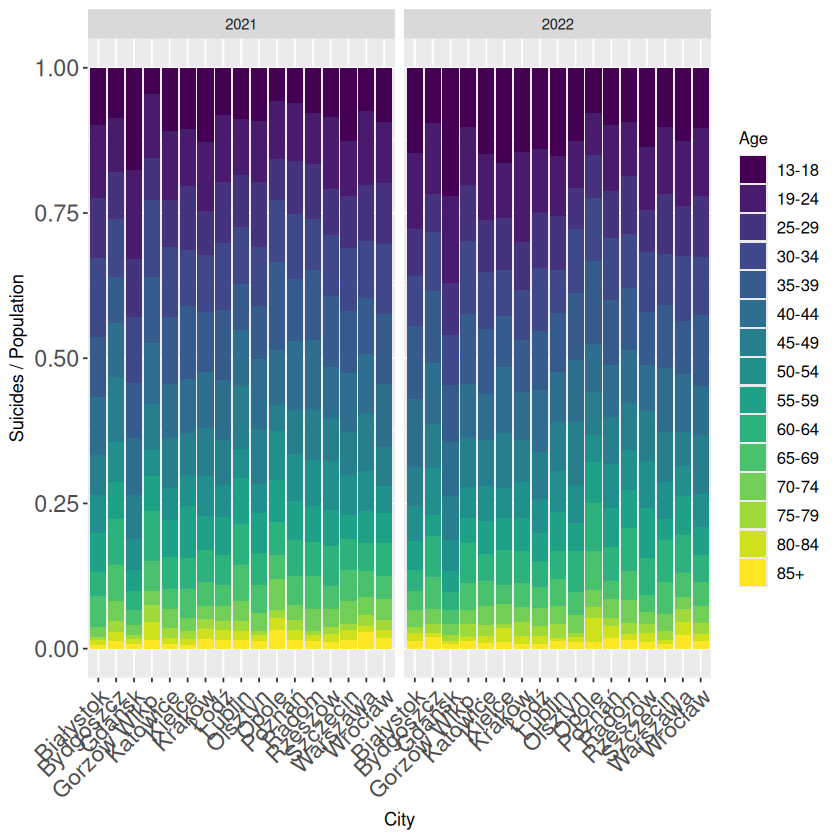

In [73]:
age_city_op %>% filter(Year %in% c(2021,2022) & Outcome == "Attempted") %>%
    ggplot(aes(x=City, y=`Suicides / Population`)) +
    scale_fill_viridis_d() + 
    geom_bar(stat="identity", aes(fill=Age), position="fill") +
    facet_wrap(~Year) + 
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE)) -> p
    #theme(axis.text.x = element_text(angle=45, hjust=1)) -> p
p

In [74]:
ggsave(filename = paste(save_to, "age_city_att_op-2122.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

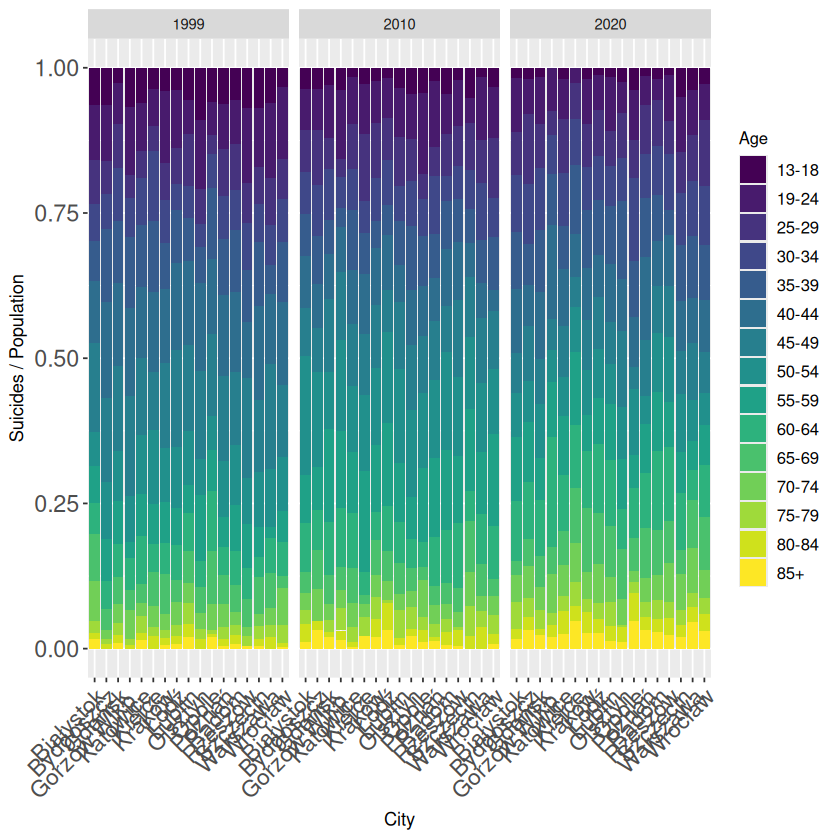

In [75]:
age_city_op %>% filter(Year %in% c(1999,2010,2020) & Outcome == "Fatal") %>%
    ggplot(aes(x=City, y=`Suicides / Population`)) +
    scale_fill_viridis_d() + 
    geom_bar(stat="identity", aes(fill=Age), position="fill") +
    facet_wrap(~Year) + 
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE)) -> p
    #theme(axis.text.x = element_text(angle=45, hjust=1)) -> p
p

In [76]:
ggsave(filename = paste(save_to, "age_city_fat_op-991020.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

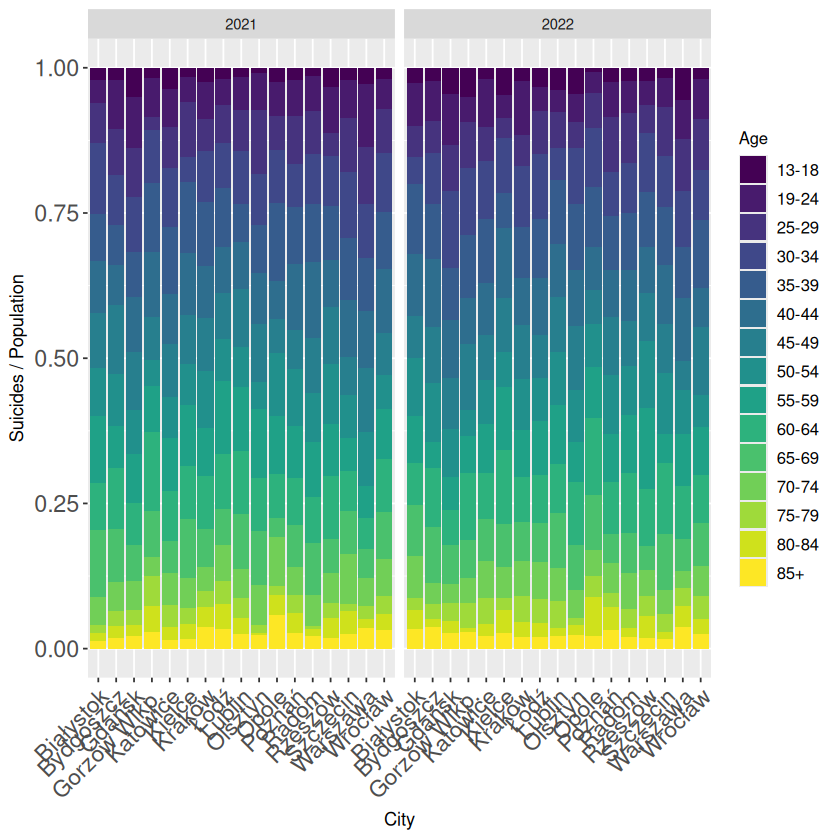

In [77]:
age_city_op %>% filter(Year %in% c(2021,2022) & Outcome == "Fatal") %>%
    ggplot(aes(x=City, y=`Suicides / Population`)) +
    scale_fill_viridis_d() + 
    geom_bar(stat="identity", aes(fill=Age), position="fill") +
    facet_wrap(~Year) + 
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE)) -> p
    #theme(axis.text.x = element_text(angle=45, hjust=1)) -> p
p

In [78]:
ggsave(filename = paste(save_to, "age_city_fat_op-2122.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

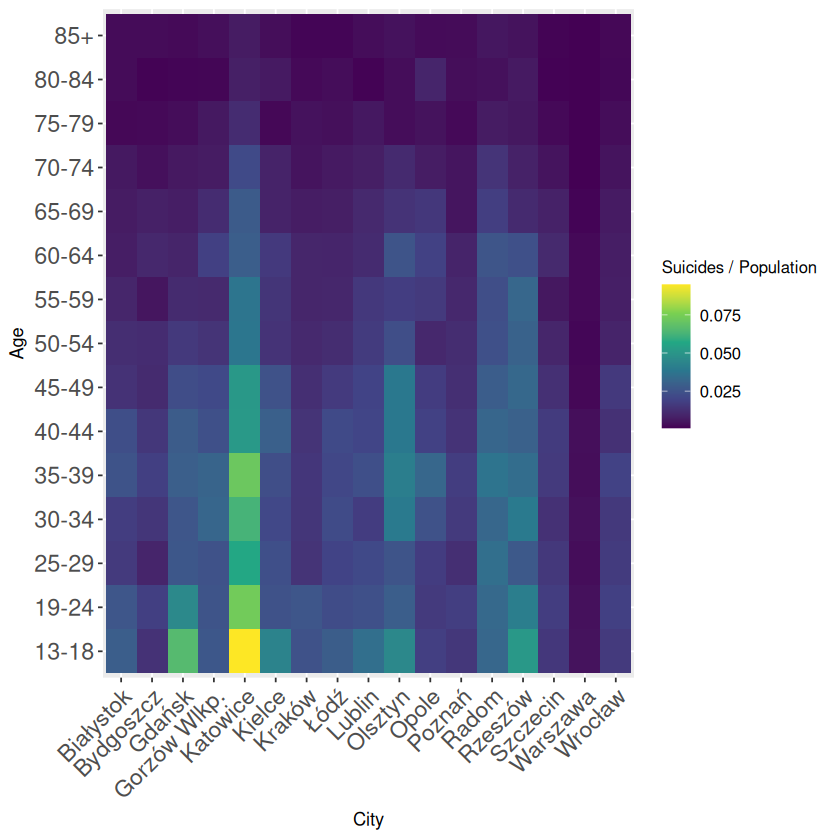

In [79]:
age_city_op %>% filter(Outcome == "Attempted" & Year == 2022 & Age != "7-12" & Age != "0-6") %>%
    ggplot(aes(x=City, y=Age, fill=`Suicides / Population`)) +
    geom_tile() +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    scale_fill_viridis_c() -> p
    #theme(axis.text.x = element_text(angle=45, hjust=1)) -> p
p

In [80]:

ggsave(filename = paste(save_to, "age_city_op-att-2022.pdf", sep=''), plot = p, width = 15, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”


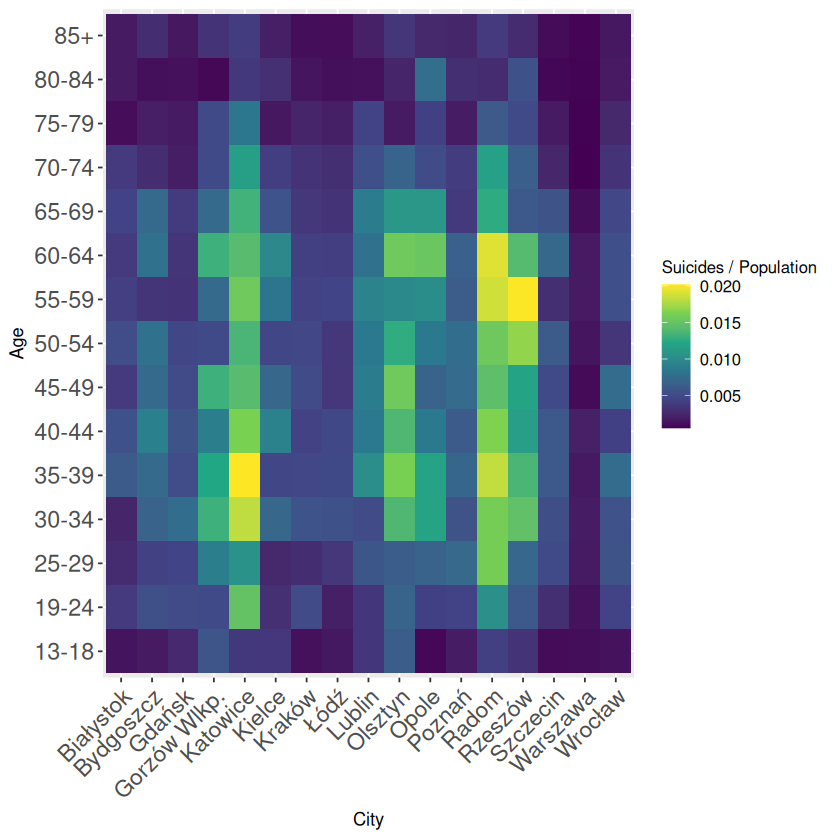

In [81]:
age_city_op %>% filter(Outcome == "Fatal" & Year == 2022 & Age != "7-12" & Age != "0-6") %>%
    ggplot(aes(x=City, y=Age, fill=`Suicides / Population`)) +
    geom_tile() +
    scale_fill_viridis_c() +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE)) -> p
    #theme(axis.text.x = element_text(angle=45, hjust=1, size=24)) +
    #theme(axis.text.y = element_text(size=24)) -> p
p

In [82]:

ggsave(filename = paste(save_to, "age_city_op-fat-2022.pdf", sep=''), plot = p, width = 15, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”


In [83]:
head(age_foa)

Year,Age,Fatal / Attempted
<int>,<chr>,<dbl>
1999,13-18,78.93082
1999,19-24,82.50000
1999,25-29,86.89459
1999,30-34,88.61789
1999,35-39,90.11858
1999,40-44,91.95402


In [84]:
head(sex)

,Year,City,Sex,Suicides,Outcome
,<int>,<chr>,<chr>,<int>,<chr>
1,1999,Wrocław,Male,317,Attempted
2,1999,Bydgoszcz,Male,227,Attempted
3,1999,Lublin,Male,231,Attempted
4,1999,Gorzów Wlkp.,Male,156,Attempted
5,1999,Łódź,Male,348,Attempted
6,1999,Kraków,Male,255,Attempted


In [85]:
poland_sex <- sex %>%
    group_by(Year, Outcome, Sex) %>%
    summarize(`Total suicides` = sum(Suicides), .groups='drop')
head(poland_sex)

Year,Outcome,Sex,Total suicides
<int>,<chr>,<chr>,<int>
1999,Attempted,Female,890
1999,Attempted,Male,4292
1999,Fatal,Female,728
1999,Fatal,Male,3967
2000,Attempted,Female,1101
2000,Attempted,Male,4520


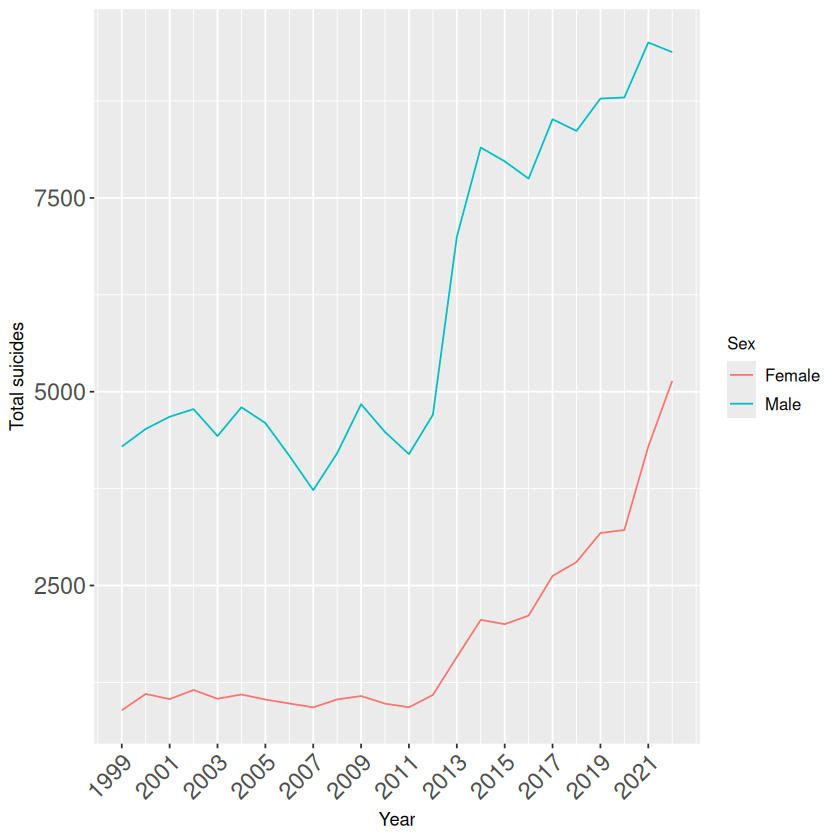

In [86]:
poland_sex %>% filter(Outcome == "Attempted") %>%
    ggplot(aes(x=Year, y=`Total suicides`)) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(color=Sex)) -> p
p <- p + scale_x_continuous(breaks = seq(min(poland_sex$Year), max(poland_sex$Year), by = STEP))
p


In [87]:
ggsave(filename = paste(save_to, "sex_attempted.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

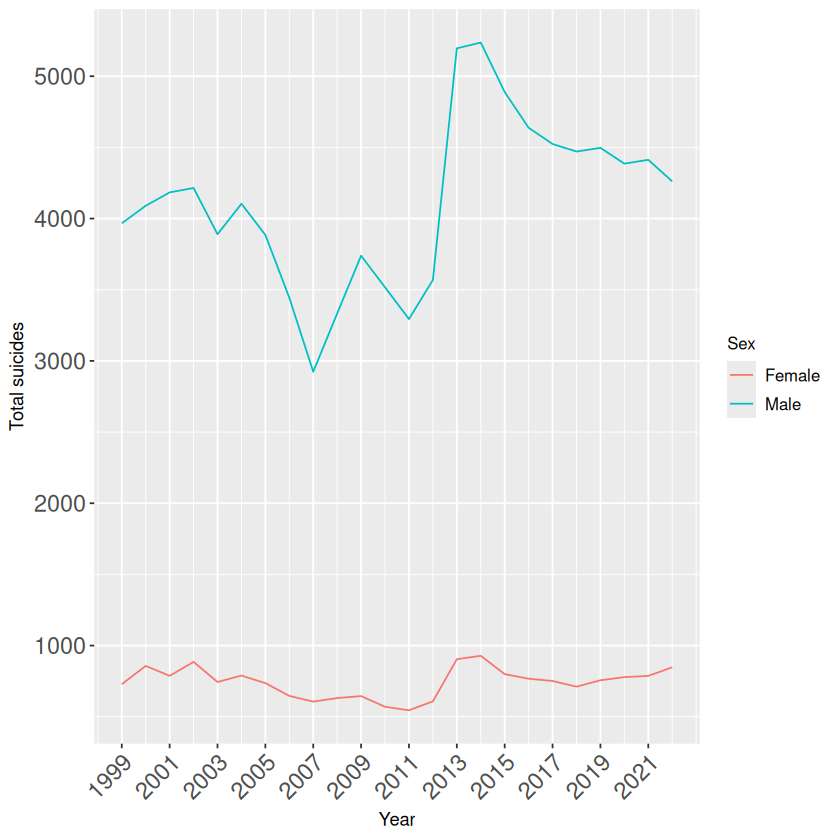

In [88]:
poland_sex %>% filter(Outcome == "Fatal") %>%
    ggplot(aes(x=Year, y=`Total suicides`)) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(color=Sex)) -> p
p <- p + scale_x_continuous(breaks = seq(min(poland_sex$Year), max(poland_sex$Year), by = STEP))
p


In [89]:
ggsave(filename = paste(save_to, "sex_fatal.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

In [90]:
sex_foa <- poland_sex %>%
    pivot_wider(names_from = Outcome, values_from = `Total suicides`) %>%
    mutate(`Fatal / Attempted` = Fatal/Attempted * 100) %>%
    select(Year, Sex, `Fatal / Attempted`)
head(sex_foa)

Year,Sex,Fatal / Attempted
<int>,<chr>,<dbl>
1999,Female,81.79775
1999,Male,92.42777
2000,Female,77.83833
2000,Male,90.48673
2001,Female,76.03865
2001,Male,89.45905


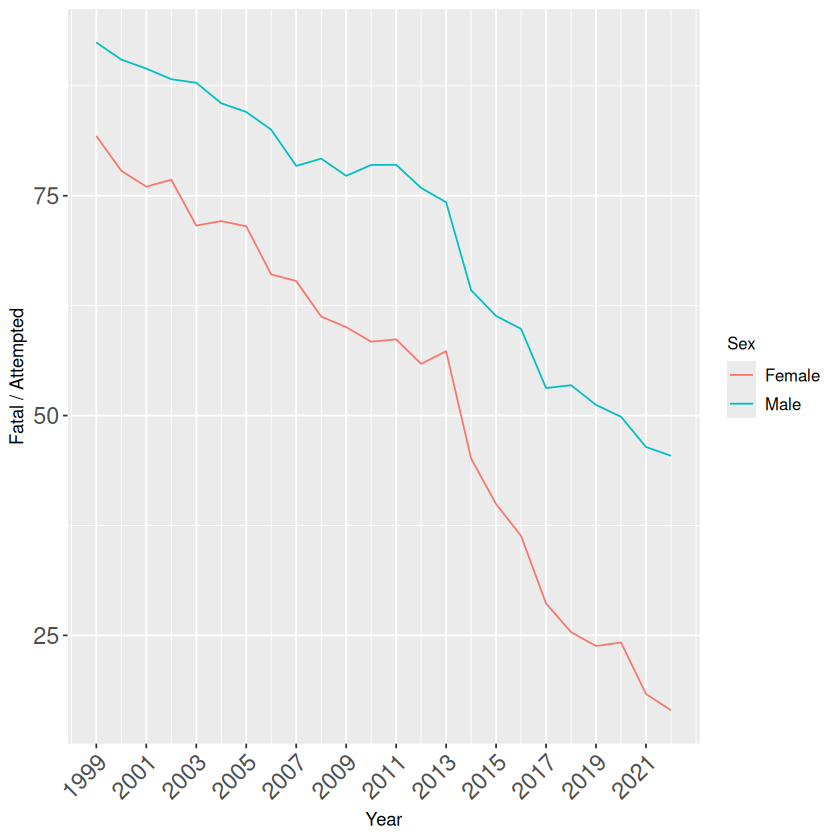

In [91]:
sex_foa %>% 
    ggplot(aes(x=Year, y=`Fatal / Attempted`)) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(colour=Sex)) -> p
p <- p + scale_x_continuous(breaks = seq(min(sex_foa$Year), max(sex_foa$Year), by = STEP))
p

In [92]:
ggsave(filename = paste(save_to, "sex_foa.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

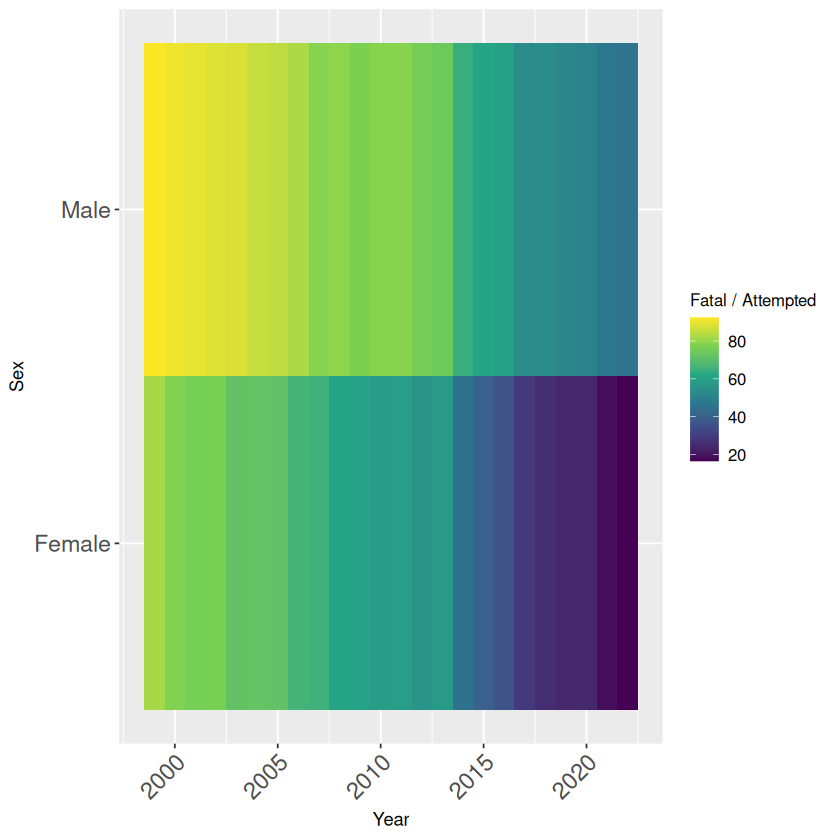

In [93]:
# sex_foa %>% heatmap fatal / attempted years sex
sex_foa %>% 
    ggplot(aes(x=Year, y=Sex, fill=`Fatal / Attempted`)) +
    geom_tile() +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    scale_fill_viridis_c() -> p
p 

In [94]:

ggsave(filename=paste(save_to, "sex_foa_heat.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

In [95]:
sex_city_op <- sex %>% 
    left_join(population, by=c('City')) %>%
    mutate(`Suicides / Population` = Suicides/Population * 100) %>%
    select(City, Year, Outcome, Sex, `Suicides / Population`)

head(sex_city_op)

,City,Year,Outcome,Sex,Suicides / Population
,<chr>,<int>,<chr>,<chr>,<dbl>
1,Wrocław,1999,Attempted,Male,0.04963525
2,Bydgoszcz,1999,Attempted,Male,0.06412321
3,Lublin,1999,Attempted,Male,0.06753616
4,Gorzów Wlkp.,1999,Attempted,Male,0.12772124
5,Łódź,1999,Attempted,Male,0.04994919
6,Kraków,1999,Attempted,Male,0.03326016


In [96]:
sex_city_op %>% filter(Outcome == "Fatal" & Year == 2022)

City,Year,Outcome,Sex,Suicides / Population
<chr>,<int>,<chr>,<chr>,<dbl>
Bydgoszcz,2022,Fatal,Male,0.063275764
Białystok,2022,Fatal,Male,0.042262114
Gdańsk,2022,Fatal,Male,0.047405982
Gorzów Wlkp.,2022,Fatal,Male,0.095790930
Katowice,2022,Fatal,Male,0.148480309
Kielce,2022,Fatal,Male,0.063794388
Kraków,2022,Fatal,Male,0.045520769
Łódź,2022,Fatal,Male,0.041624325
Lublin,2022,Fatal,Male,0.079815460


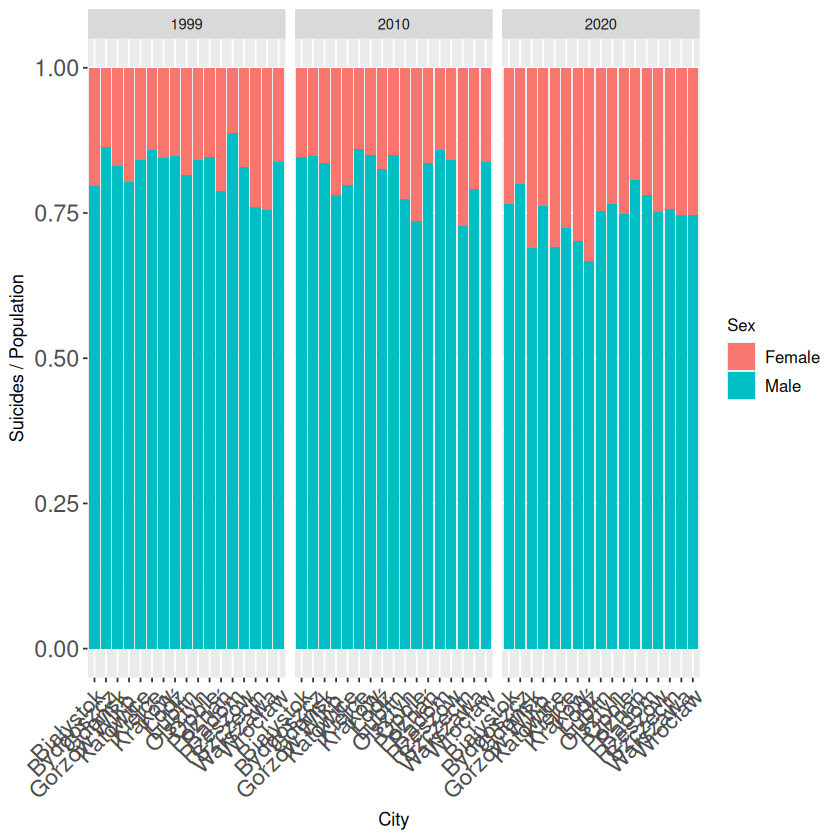

In [97]:
sex_city_op %>% filter(Year %in% c(1999,2010,2020) & Outcome == "Attempted") %>%
ggplot(aes(x=City, y=`Suicides / Population`)) + 
geom_bar(stat="identity", aes(fill=Sex), position="fill") +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
facet_wrap(~Year) -> p
    #theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p

In [98]:
ggsave(filename = paste(save_to, "sex_city_att_suicides-991020.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

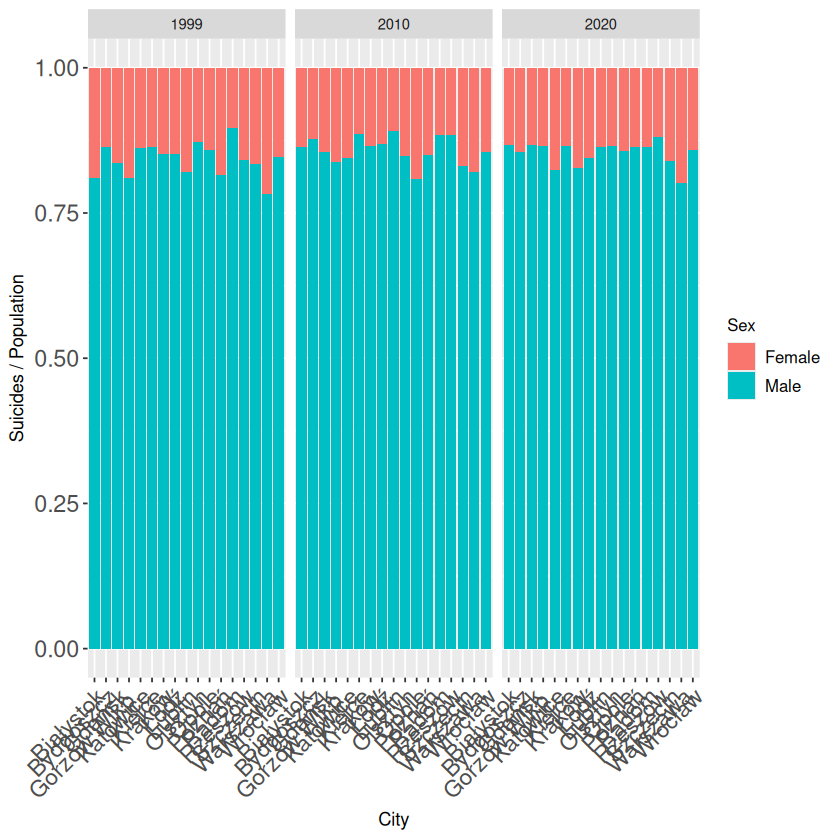

In [99]:

sex_city_op %>% filter(Year %in% c(1999,2010,2020) & Outcome == "Fatal") %>%
ggplot(aes(x=City, y=`Suicides / Population`)) + 
geom_bar(stat="identity", aes(fill=Sex), position="fill") +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
facet_wrap(~Year) -> p
    #theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p

In [100]:
ggsave(filename = paste(save_to, "sex_city_fat_suicides-991020.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

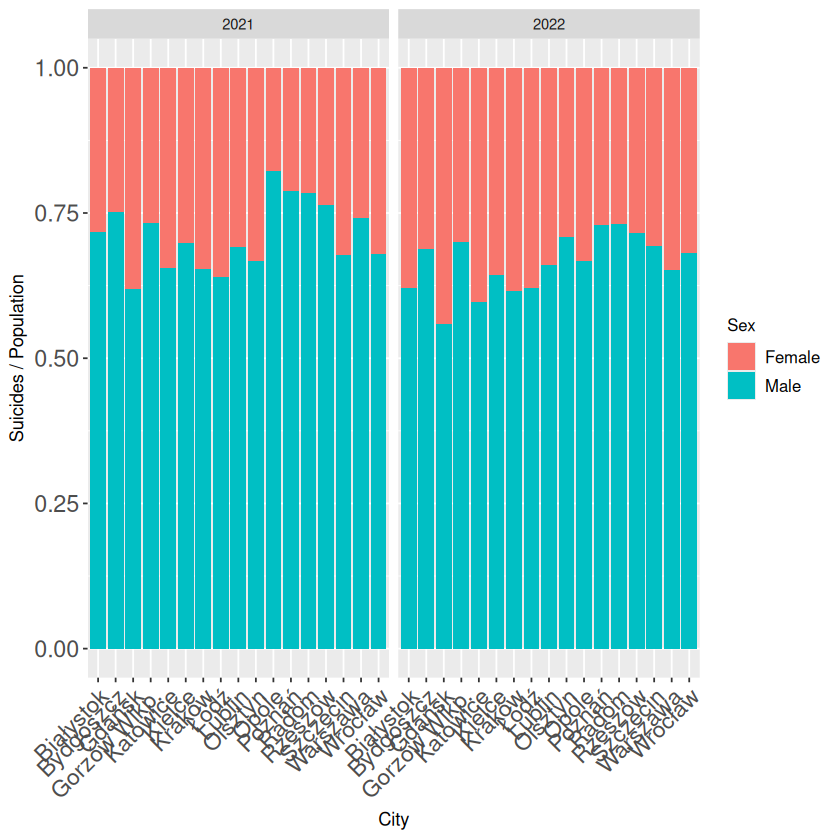

In [101]:
sex_city_op %>% filter((Year == 2022 | Year == 2021 | Year == 2023) & Outcome == "Attempted") %>%
ggplot(aes(x=City, y=`Suicides / Population`)) + 
geom_bar(stat="identity", aes(fill=Sex), position="fill") +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
facet_wrap(~Year) -> p
    #theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p

In [102]:
ggsave(filename = paste(save_to, "sex_city_att_suicides-2122.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

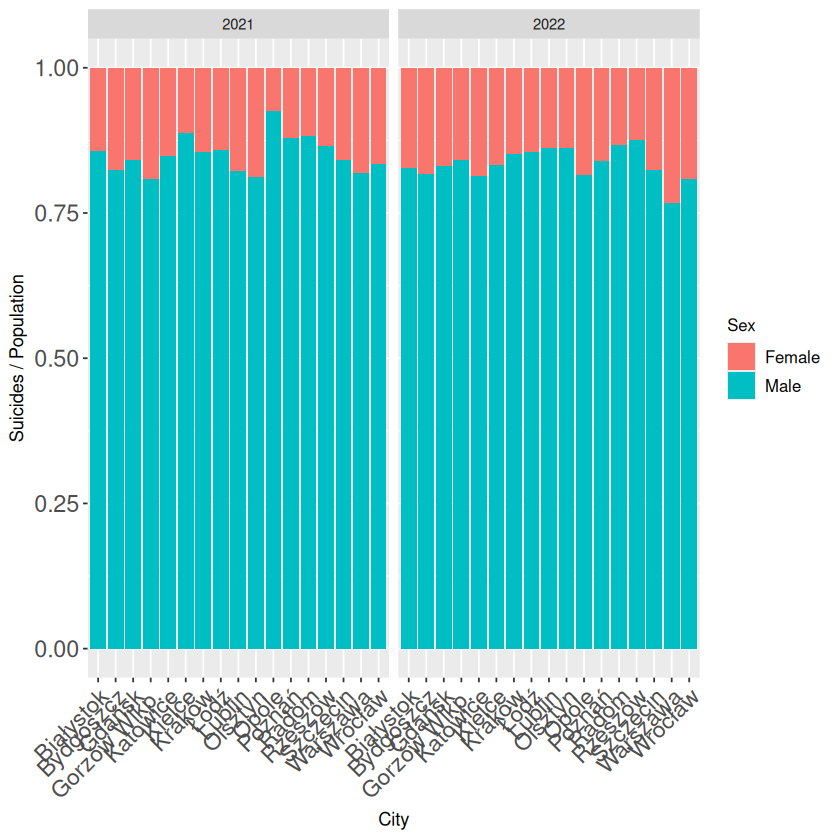

In [103]:
sex_city_op %>% filter((Year == 2022 | Year == 2021) & Outcome == "Fatal") %>%
ggplot(aes(x=City, y=`Suicides / Population`)) + 
geom_bar(stat="identity", aes(fill=Sex), position="fill") +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
facet_wrap(~Year) -> p
    #theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p

In [104]:
ggsave(filename = paste(save_to, "sex_city_fat_suicides-2122.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

In [105]:
head(sex)

,Year,City,Sex,Suicides,Outcome
,<int>,<chr>,<chr>,<int>,<chr>
1,1999,Wrocław,Male,317,Attempted
2,1999,Bydgoszcz,Male,227,Attempted
3,1999,Lublin,Male,231,Attempted
4,1999,Gorzów Wlkp.,Male,156,Attempted
5,1999,Łódź,Male,348,Attempted
6,1999,Kraków,Male,255,Attempted


In [106]:
sex_foa_city <- sex %>%
    pivot_wider(names_from = Outcome, values_from = `Suicides`) %>%
    mutate(`Fatal / Attempted` = Fatal/Attempted * 100) %>%
    select(Year, Sex, City, `Fatal / Attempted`)
head(sex_foa_city)

Year,Sex,City,Fatal / Attempted
<int>,<chr>,<chr>,<dbl>
1999,Male,Wrocław,90.53628
1999,Male,Bydgoszcz,94.27313
1999,Male,Lublin,92.64069
1999,Male,Gorzów Wlkp.,92.94872
1999,Male,Łódź,95.97701
1999,Male,Kraków,94.11765


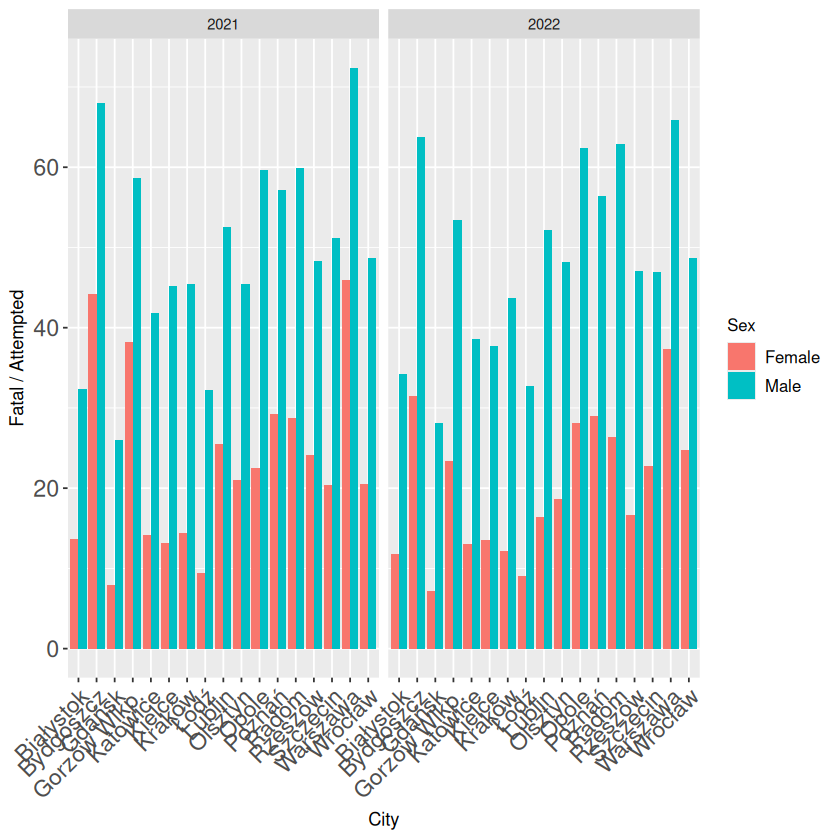

In [107]:
sex_foa_city %>% filter(Year == 2022 | Year == 2021) %>%
ggplot(aes(x=City, y=`Fatal / Attempted`)) + 
geom_bar(stat="identity", aes(fill=Sex), position="dodge") +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
facet_wrap(~Year) -> p
    #theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p

In [108]:
ggsave(filename = paste(save_to, "sex_foa_city-2122.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

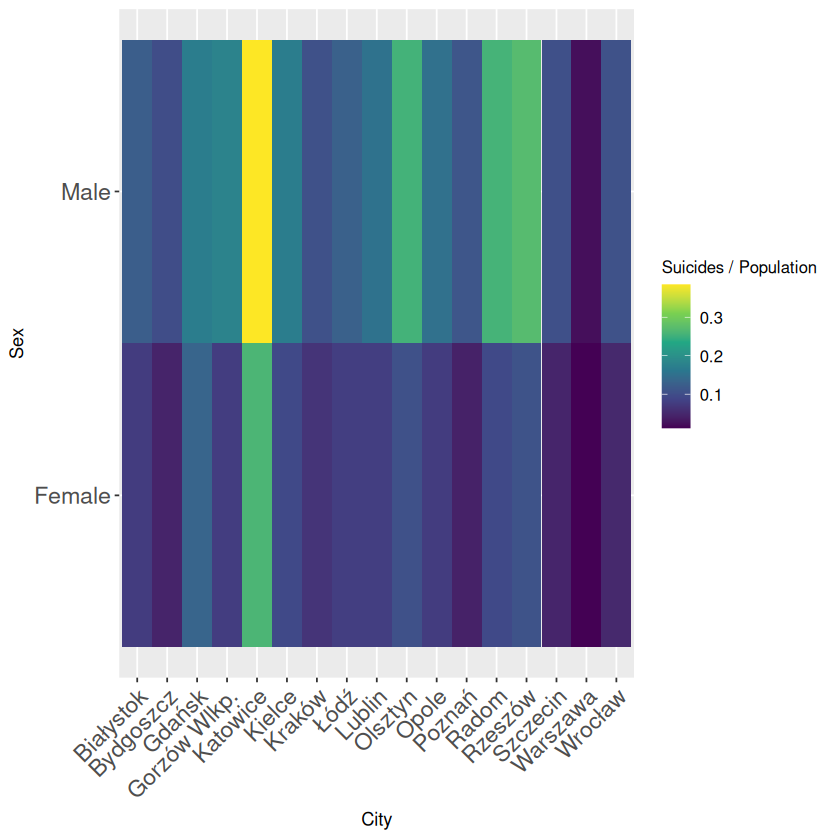

In [109]:
# sex_city_op %>% heatmap attempted suic / pop
sex_city_op %>% filter(Outcome == "Attempted" & Year == 2022) %>%
    ggplot(aes(x=City, y=Sex, fill=`Suicides / Population`)) +
    geom_tile() +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    #theme(axis.text.x = element_text(angle=45, hjust=1))+ 
    scale_fill_viridis_c() -> p
p

In [110]:
ggsave(filename = paste(save_to, "sex_city_op-att-2022.pdf", sep=''), plot = p, width = 15, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”


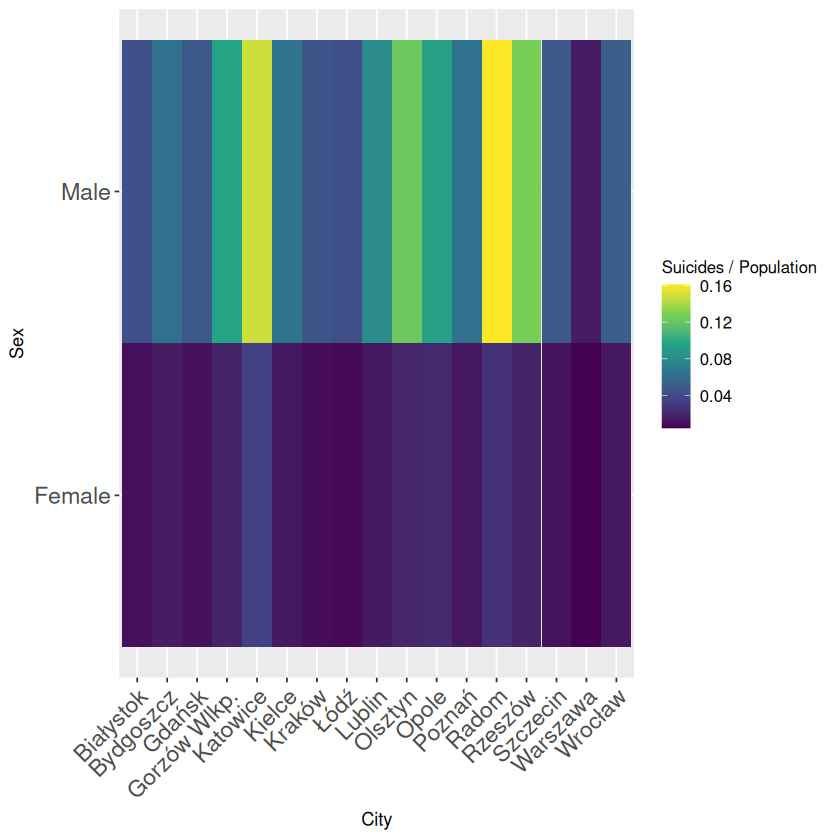

In [111]:
# sex_city_op %>% heatmap fatal suic / pop
sex_city_op %>% filter(Outcome == "Fatal" & Year == 2022) %>%
    ggplot(aes(x=City, y=Sex, fill=`Suicides / Population`)) +
    geom_tile() +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    #theme(axis.text.x = element_text(angle=45, hjust=1))+ 
    scale_fill_viridis_c() -> p
p

In [112]:

ggsave(filename = paste(save_to, "sex_city_op-fat-2022.pdf", sep=''), plot = p, width = 15, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”


In [113]:
# avg_years_sex <- sex %>% filter(year >= 2019 & year <= 2022) %>%
#     group_by(garnizon, sex, outcome) %>%
#     summarize(average_suicides = mean(suicides), .groups='drop') %>%
#     left_join(population, by=('garnizon')) %>%
#     mutate(average_suicides_by_pop = average_suicides/population) %>%
#     select(garnizon, sex, outcome, average_suicides_by_pop)
# # avg_years_sex

In [114]:
head(place)

,Year,City,Place,Suicides,Outcome
,<int>,<chr>,<chr>,<int>,<chr>
1,1999,Wrocław,apartment,161,Attempted
2,1999,Wrocław,garage/basement/attic,51,Attempted
3,1999,Wrocław,farm building,39,Attempted
4,1999,Wrocław,railway,10,Attempted
5,1999,Wrocław,street,6,Attempted
6,1999,Wrocław,park/forest,46,Attempted


In [115]:
poland_place <- place %>%
    group_by(Year, Outcome, Place) %>%
    summarize(`Total suicides` = sum(Suicides), .groups='drop')
head(poland_place)

Year,Outcome,Place,Total suicides
<int>,<chr>,<chr>,<int>
1999,Attempted,apartment,1954
1999,Attempted,farm building,990
1999,Attempted,garage/basement/attic,663
1999,Attempted,legal_isolation,21
1999,Attempted,medical facility,74
1999,Attempted,military area,1


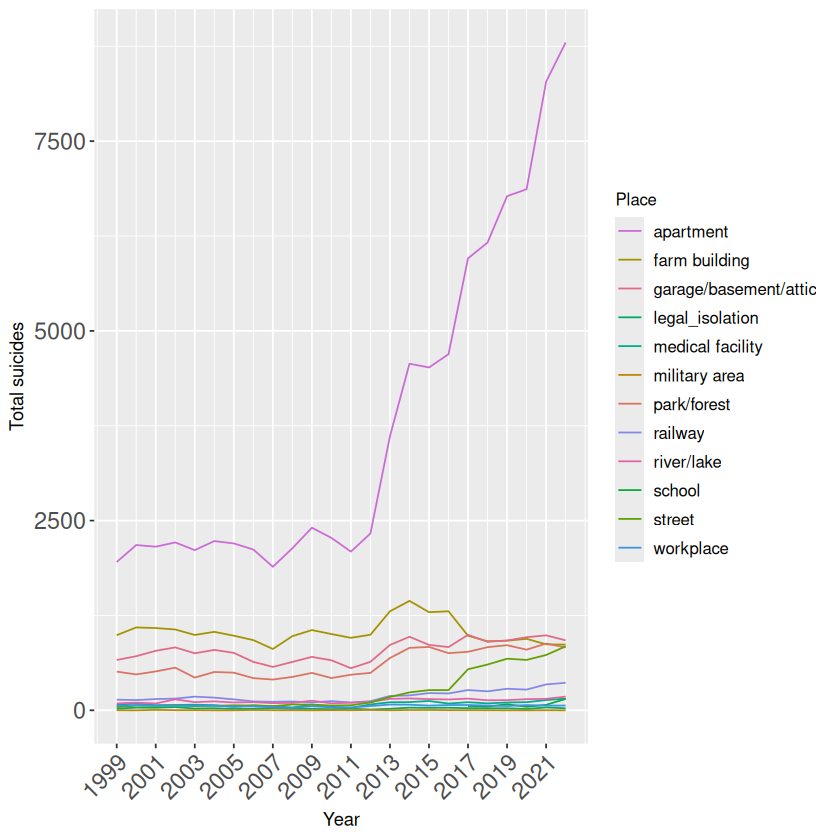

In [116]:
poland_place %>% filter(Outcome == "Attempted") %>%
    ggplot(aes(x=Year, y=`Total suicides`)) +
    scale_color_manual(values = randomized_colors) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(color=Place)) -> p
p <- p + scale_x_continuous(breaks = seq(min(poland_place$Year), max(poland_place$Year), by = STEP))
p

In [117]:
ggsave(filename = paste(save_to, "place_attempted.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

In [118]:
poland_place %>% filter(Year == 2022 & Outcome == "Fatal")

Year,Outcome,Place,Total suicides
<int>,<chr>,<chr>,<int>
2022,Fatal,apartment,2164
2022,Fatal,farm building,636
2022,Fatal,garage/basement/attic,664
2022,Fatal,legal_isolation,16
2022,Fatal,medical facility,NA
2022,Fatal,military area,0
2022,Fatal,park/forest,516
2022,Fatal,railway,191
2022,Fatal,river/lake,62


Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_line()`).”


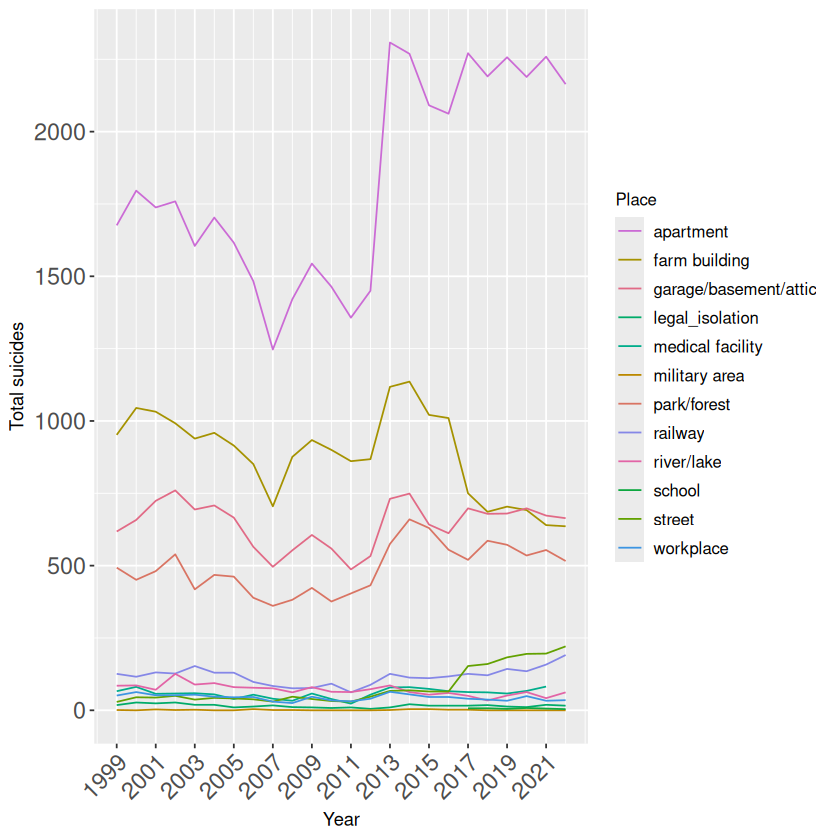

In [119]:
poland_place %>% filter(Outcome == "Fatal") %>%
    ggplot(aes(x=Year, y=`Total suicides`)) +
    geom_line(aes(color=Place)) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    scale_color_manual(values = randomized_colors) -> p
p <- p + scale_x_continuous(breaks = seq(min(poland_place$Year), max(poland_place$Year), by = STEP))
p

In [120]:
ggsave(filename = paste(save_to, "place_fatal.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_line()`).”


In [121]:
# poland_place %>% filter(Place == "military area")

In [122]:
place_foa <- poland_place %>%
    pivot_wider(names_from = Outcome, values_from = `Total suicides`) %>%
    mutate(`Fatal / Attempted` = Fatal/Attempted * 100) %>%
    select(Year, Place, `Fatal / Attempted`)
head(place_foa)

Year,Place,Fatal / Attempted
<int>,<chr>,<dbl>
1999,apartment,85.77277
1999,farm building,96.16162
1999,garage/basement/attic,93.21267
1999,legal_isolation,85.71429
1999,medical facility,89.18919
1999,military area,100.00000


In [123]:
place_foa %>% filter(Year == 2022)

Year,Place,Fatal / Attempted
<int>,<chr>,<dbl>
2022,apartment,24.590909
2022,farm building,73.441109
2022,garage/basement/attic,72.017354
2022,legal_isolation,59.259259
2022,medical facility,NA
2022,military area,NaN
2022,park/forest,62.318841
2022,railway,52.617080
2022,river/lake,34.254144


Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_line()`).”


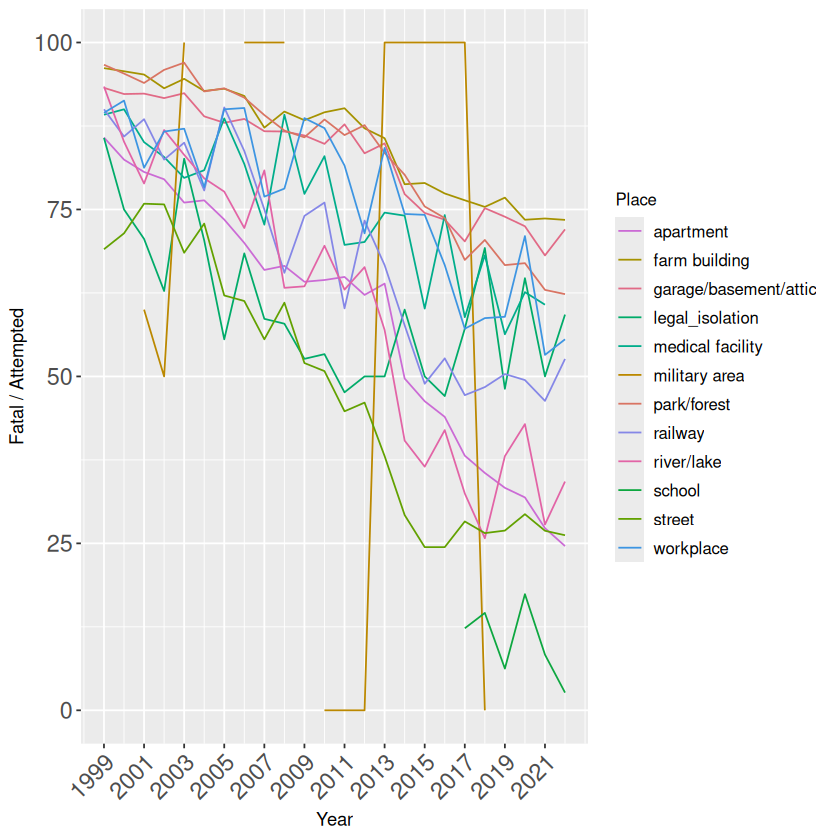

In [124]:
place_foa %>% 
    ggplot(aes(x=Year,y=`Fatal / Attempted`)) +
    scale_color_manual(values=randomized_colors)+
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(color=Place)) -> p
p <- p + scale_x_continuous(breaks = seq(min(place_foa$Year), max(place_foa$Year), by = STEP))
p

In [125]:
ggsave(filename = paste(save_to, "place_foa.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_line()`).”


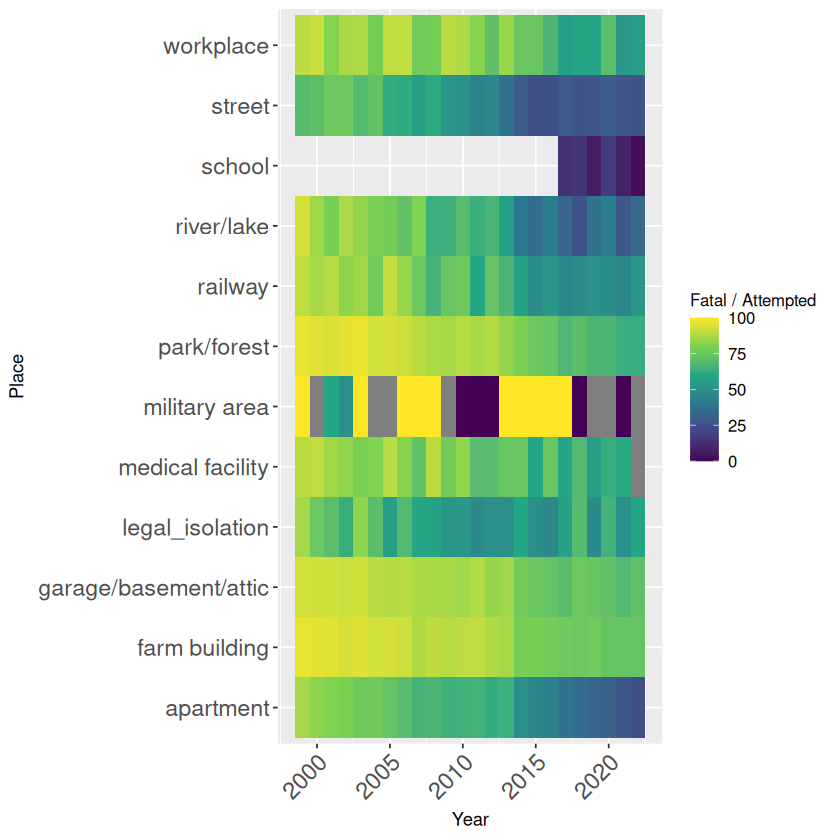

In [126]:
place_foa %>%
    ggplot(aes(x=Year, y=Place, fill=`Fatal / Attempted`)) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_tile() +
    scale_fill_viridis_c() -> p
p

In [127]:

ggsave(filename = paste(save_to, "place_foa_heat.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

In [128]:
place_city_op <- place %>%
    left_join(population, by=c('City')) %>%
    mutate(`Suicides / Population` = Suicides/Population*100) %>%
    select(City, Year, Outcome, Place, `Suicides / Population`)

head(place_city_op)

,City,Year,Outcome,Place,Suicides / Population
,<chr>,<int>,<chr>,<chr>,<dbl>
1,Wrocław,1999,Attempted,apartment,0.0252090709
2,Wrocław,1999,Attempted,garage/basement/attic,0.0079854821
3,Wrocław,1999,Attempted,farm building,0.0061065451
4,Wrocław,1999,Attempted,railway,0.0015657808
5,Wrocław,1999,Attempted,street,0.0009394685
6,Wrocław,1999,Attempted,park/forest,0.0072025917


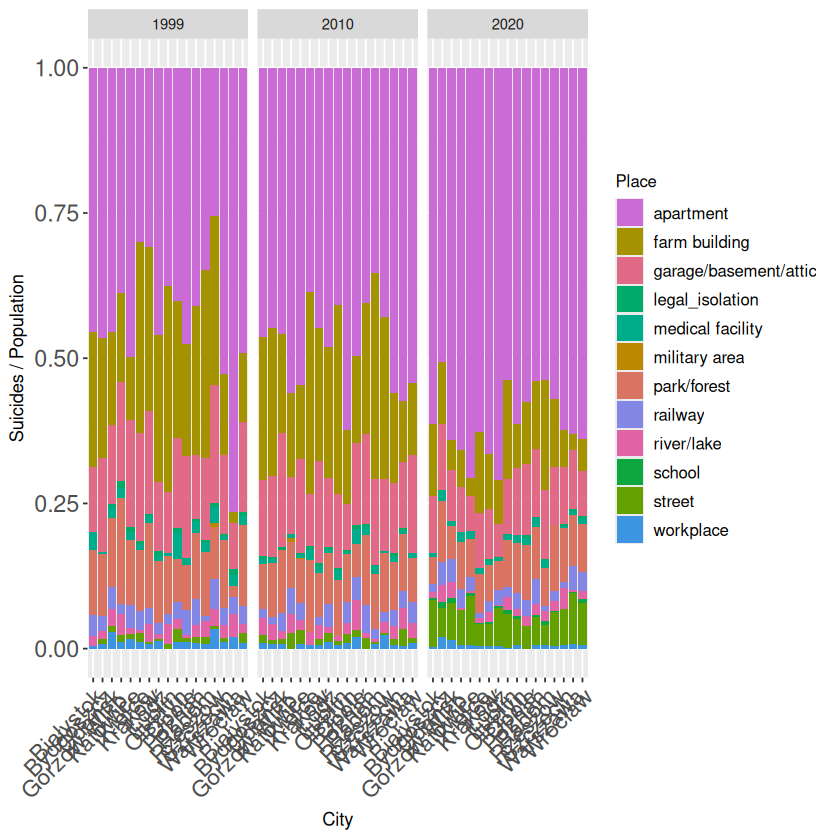

In [129]:
place_city_op %>% filter(Year %in% c(1999,2010,2020) & Outcome == "Attempted") %>%
    ggplot(aes(x=City,y=`Suicides / Population`)) + 
    geom_bar(stat="identity", aes(fill=Place), position="fill") +
    scale_fill_manual(values=randomized_colors) +
    facet_wrap(~Year) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE)) -> p
    #theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p


In [130]:
ggsave(filename = paste(save_to, "place_city_att_suicides-991020.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

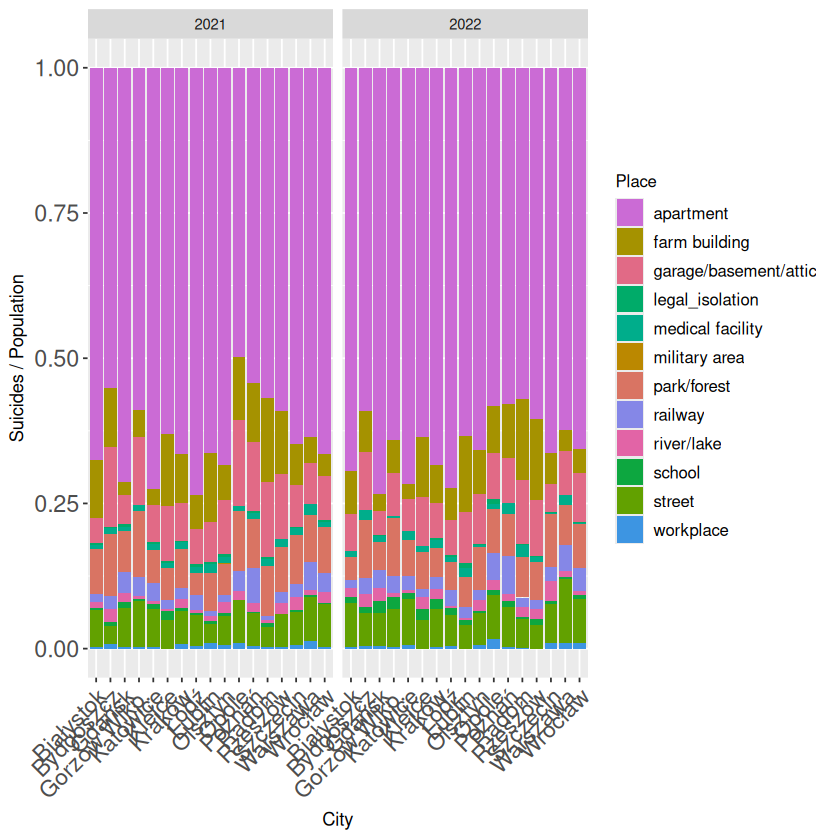

In [131]:

place_city_op %>% filter(Year %in% c(2021,2022) & Outcome == "Attempted") %>%
    ggplot(aes(x=City,y=`Suicides / Population`)) + 
    geom_bar(stat="identity", aes(fill=Place), position="fill") +
    scale_fill_manual(values=randomized_colors) +
    facet_wrap(~Year) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE)) -> p
    #theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p


In [132]:
ggsave(filename = paste(save_to, "place_city_att_suicides-2122.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

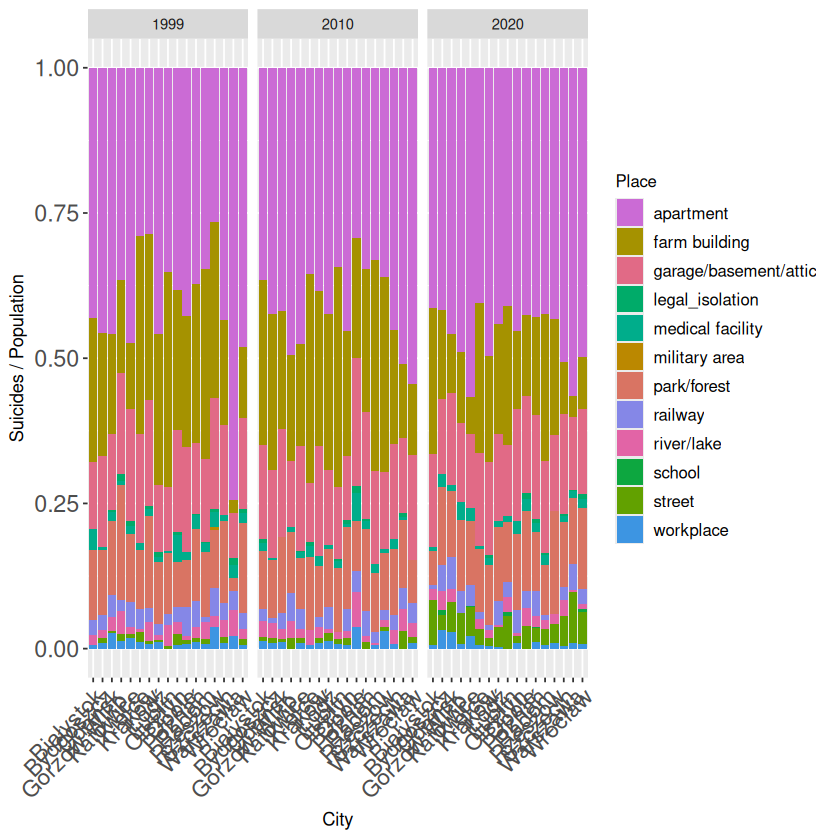

In [133]:
place_city_op %>% filter(Year %in% c(1999,2010,2020) & Outcome == "Fatal") %>%
    ggplot(aes(x=City,y=`Suicides / Population`)) + 
    geom_bar(stat="identity", aes(fill=Place), position="fill") +
    scale_fill_manual(values=randomized_colors) +
    facet_wrap(~Year) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE)) -> p
    #theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p


In [134]:
ggsave(filename = paste(save_to, "place_city_fat_suicides-991020.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_bar()`).”


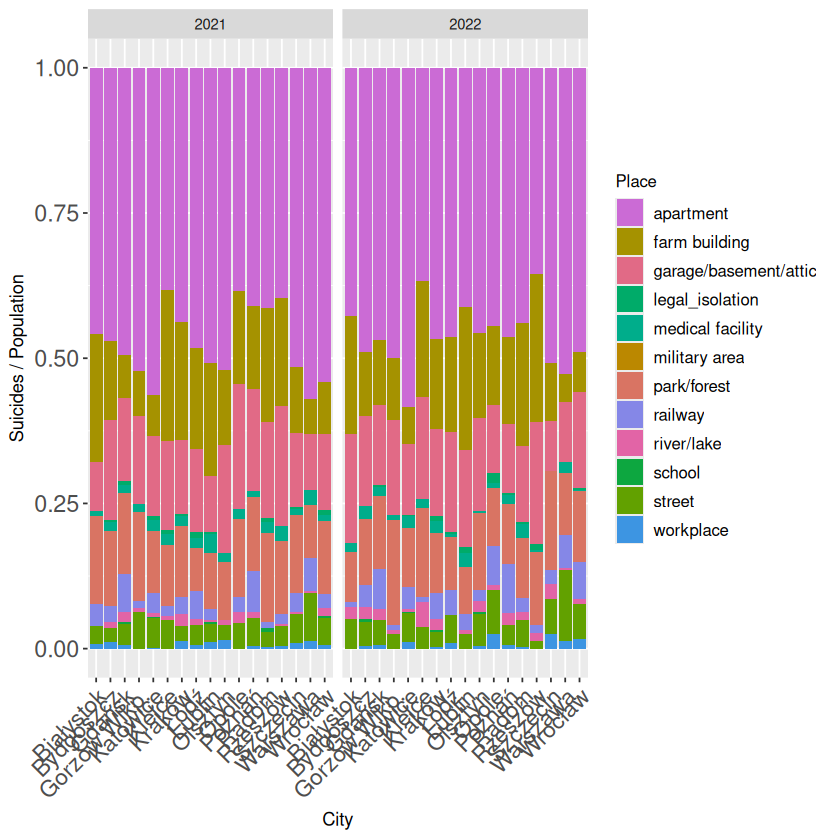

In [135]:

place_city_op %>% filter(Year %in% c(2021,2022) & Outcome == "Fatal") %>%
    ggplot(aes(x=City,y=`Suicides / Population`)) + 
    geom_bar(stat="identity", aes(fill=Place), position="fill") +
    scale_fill_manual(values=randomized_colors) +
    facet_wrap(~Year) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE)) -> p
    #theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p


In [136]:
ggsave(filename = paste(save_to, "place_city_fat_suicides-2122.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (

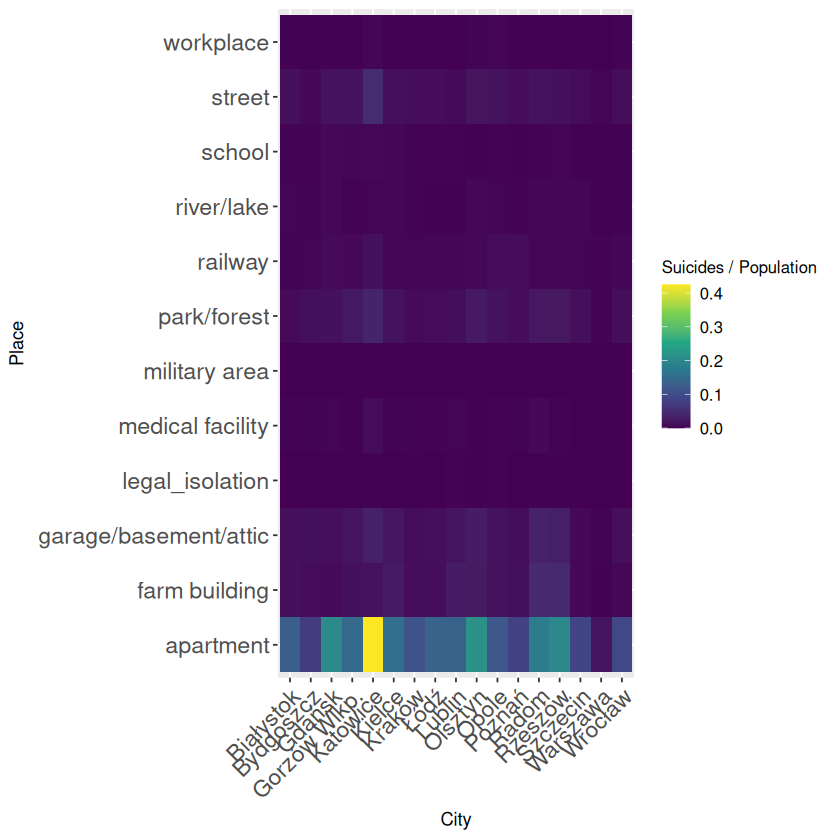

In [137]:
place_city_op %>% filter(Outcome == "Attempted" & Year == 2022) %>%
    ggplot(aes(x=City, y=Place, fill=`Suicides / Population`)) +
    geom_tile() +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    #theme(axis.text.x = element_text(angle=45, hjust=1))+ 
    scale_fill_viridis_c() -> p
p

In [138]:

ggsave(filename = paste(save_to, "place_city_op-att-2022.pdf", sep=''), plot = p, width = 15, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”


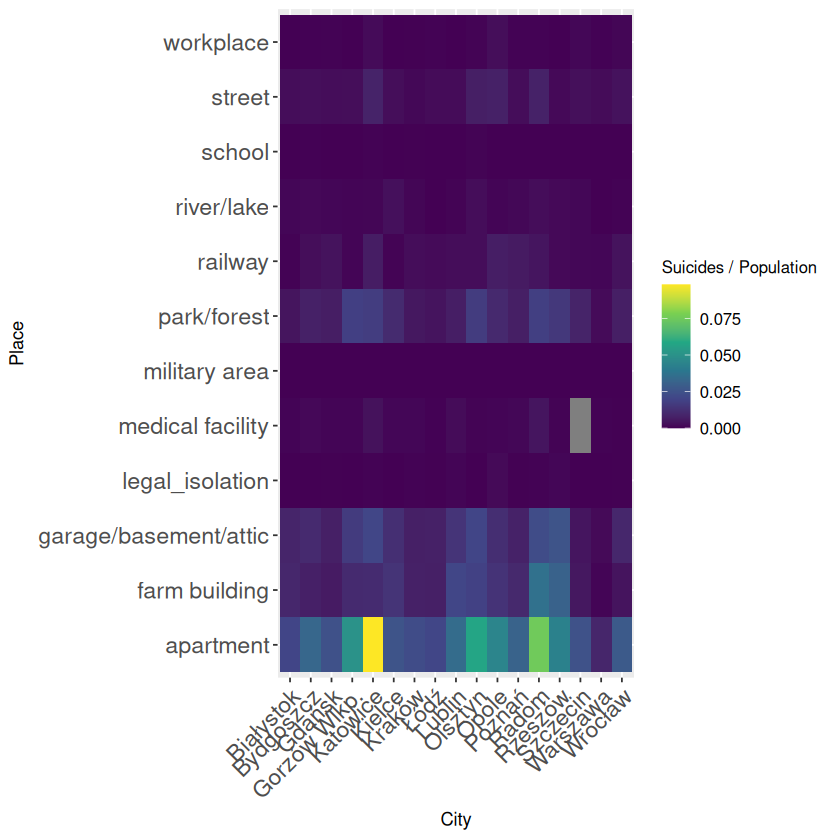

In [139]:
place_city_op %>% filter(Outcome == "Fatal" & Year == 2022) %>%
    ggplot(aes(x=City, y=Place, fill=`Suicides / Population`)) +
    geom_tile() +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    #theme(axis.text.x = element_text(angle=45, hjust=1))+ 
    scale_fill_viridis_c() -> p
p

In [140]:

ggsave(filename = paste(save_to, "place_city_op-fat-2022.pdf", sep=''), plot = p, width = 15, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”


In [141]:
head(way)

,Year,City,Method,Suicides,Outcome
,<int>,<chr>,<chr>,<int>,<chr>
1,2013,Bydgoszcz,gas,0,Attempted
2,2013,Bydgoszcz,poison,2,Attempted
3,2013,Bydgoszcz,damaging circulatory system,0,Attempted
4,2013,Bydgoszcz,self harm,2,Attempted
5,2013,Bydgoszcz,throwing from height,16,Attempted
6,2013,Bydgoszcz,drowning,3,Attempted


In [142]:
poland_way <- way %>% 
    group_by(Year, Outcome, Method) %>%
    summarize(`Total suicides` = sum(Suicides), .groups='drop')
head(poland_way)

Year,Outcome,Method,Total suicides
<int>,<chr>,<chr>,<int>
1999,Fatal,damaging circulatory system,38
1999,Fatal,drowning,84
1999,Fatal,gas,25
1999,Fatal,hanging,3906
1999,Fatal,pills,56
1999,Fatal,poison,19


In [143]:
poland_way %>% filter(Outcome == "Attempted" & Year == 2023)

Year,Outcome,Method,Total suicides
<int>,<chr>,<chr>,<int>
2023,Attempted,damaging circulatory system,712
2023,Attempted,drowning,125
2023,Attempted,gas,84
2023,Attempted,hanging,5563
2023,Attempted,pills,4339
2023,Attempted,poison,118
2023,Attempted,self harm,1918
2023,Attempted,shooting,119
2023,Attempted,throwing from height,1059


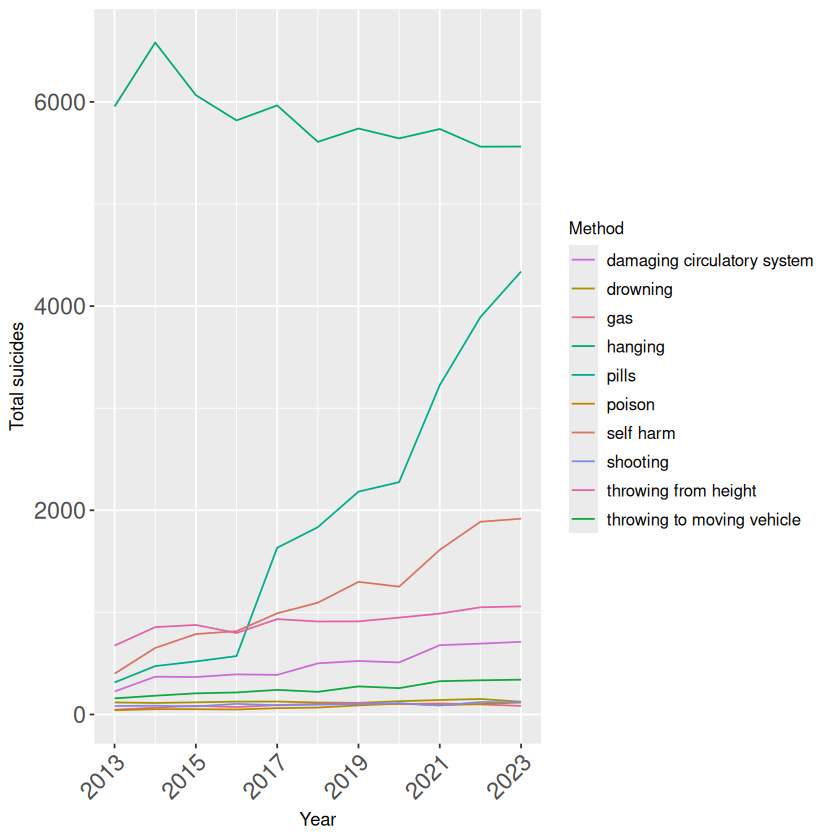

In [144]:
poland_way %>% filter(Outcome == "Attempted") %>%
    ggplot(aes(x=Year,y=`Total suicides`)) +
    scale_color_manual(values=randomized_colors)+
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(color=Method)) ->p
p <- p + scale_x_continuous(breaks = seq(min(poland_way$Year), max(poland_way$Year), by = STEP))
p

In [145]:
ggsave(filename = paste(save_to, "way_attempted.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

In [146]:
poland_way %>% filter(Outcome == "Fatal" & Year == 2023)

Year,Outcome,Method,Total suicides
<int>,<chr>,<chr>,<int>
2023,Fatal,damaging circulatory system,115
2023,Fatal,drowning,63
2023,Fatal,gas,30
2023,Fatal,hanging,3954
2023,Fatal,pills,177
2023,Fatal,poison,42
2023,Fatal,self harm,38
2023,Fatal,shooting,100
2023,Fatal,throwing from height,411


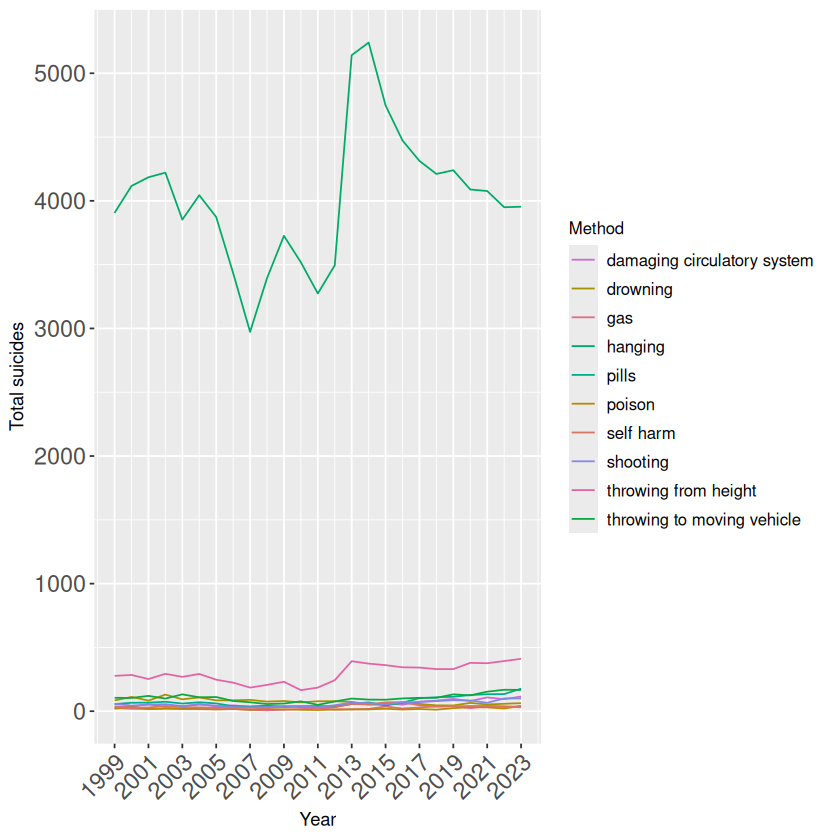

In [147]:
poland_way %>% filter(Outcome == "Fatal") %>%
    ggplot(aes(x=Year,y=`Total suicides`)) +
    scale_color_manual(values=randomized_colors) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(color=Method)) ->p
p <- p + scale_x_continuous(breaks = seq(min(poland_way$Year), max(poland_way$Year), by = STEP))
p

In [148]:
ggsave(filename = paste(save_to, "way_fatal.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

In [149]:
way_foa <- poland_way %>%
    pivot_wider(names_from = Outcome, values_from = `Total suicides`) %>%
    mutate(`Fatal / Attempted` = Fatal/Attempted * 100) %>% 
    select(Year, Method, `Fatal / Attempted`) %>% filter(Year >= 2013)

head(way_foa)

Year,Method,Fatal / Attempted
<int>,<chr>,<dbl>
2013,damaging circulatory system,24.77876
2013,drowning,61.86441
2013,gas,31.91489
2013,hanging,86.34761
2013,pills,18.78981
2013,poison,34.14634


In [150]:
way_foa %>% filter(Year == 2023)

Year,Method,Fatal / Attempted
<int>,<chr>,<dbl>
2023,damaging circulatory system,16.151685
2023,drowning,50.400000
2023,gas,35.714286
2023,hanging,71.076757
2023,pills,4.079281
2023,poison,35.593220
2023,self harm,1.981230
2023,shooting,84.033613
2023,throwing from height,38.810198


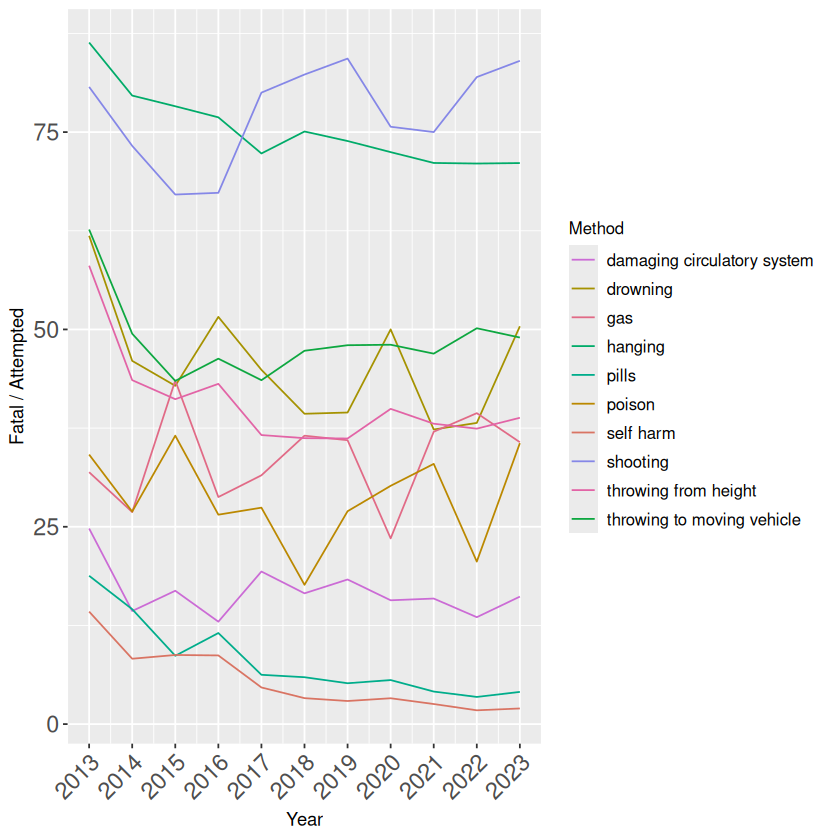

In [151]:
way_foa %>%
    ggplot(aes(x=Year,y=`Fatal / Attempted`)) +
    scale_color_manual(values=randomized_colors)+
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(colour=Method)) -> p
p <- p + scale_x_continuous(breaks = seq(min(way_foa$Year), max(way_foa$Year), by = 1))
p

In [152]:
ggsave(filename = paste(save_to, "way_foa.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

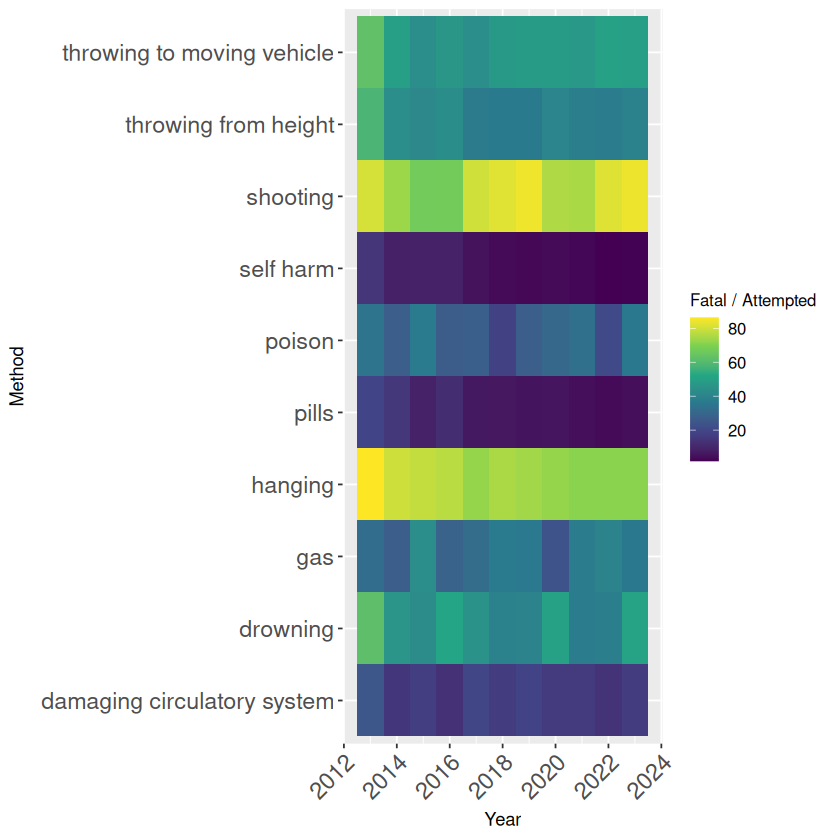

In [153]:
way_foa %>% 
    ggplot(aes(x=Year, y=Method, fill=`Fatal / Attempted`)) +
    geom_tile() +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    scale_fill_viridis_c() -> p
p

In [154]:
way %>% filter(Year < 2013 & Outcome == "Fatal")

Year,City,Method,Suicides,Outcome
<int>,<chr>,<chr>,<int>,<chr>
1999,Wrocław,gas,1,Fatal
1999,Wrocław,poison,1,Fatal
1999,Wrocław,damaging circulatory system,4,Fatal
1999,Wrocław,self harm,1,Fatal
1999,Wrocław,throwing from height,23,Fatal
1999,Wrocław,drowning,2,Fatal
1999,Wrocław,hanging,277,Fatal
1999,Wrocław,throwing to moving vehicle,7,Fatal
1999,Wrocław,shooting,6,Fatal


In [155]:

ggsave(filename = paste(save_to, "way_foa_heat.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

In [156]:
way_city_op <- way %>%
    left_join(population, by=c('City')) %>%
    mutate(`Suicides / Population` = Suicides/Population*100) %>%
    select(City, Year, Outcome, Method, `Suicides / Population`)

head(way_city_op)

,City,Year,Outcome,Method,Suicides / Population
,<chr>,<int>,<chr>,<chr>,<dbl>
1,Bydgoszcz,2013,Attempted,gas,0.0000000000
2,Bydgoszcz,2013,Attempted,poison,0.0005649622
3,Bydgoszcz,2013,Attempted,damaging circulatory system,0.0000000000
4,Bydgoszcz,2013,Attempted,self harm,0.0005649622
5,Bydgoszcz,2013,Attempted,throwing from height,0.0045196974
6,Bydgoszcz,2013,Attempted,drowning,0.0008474433


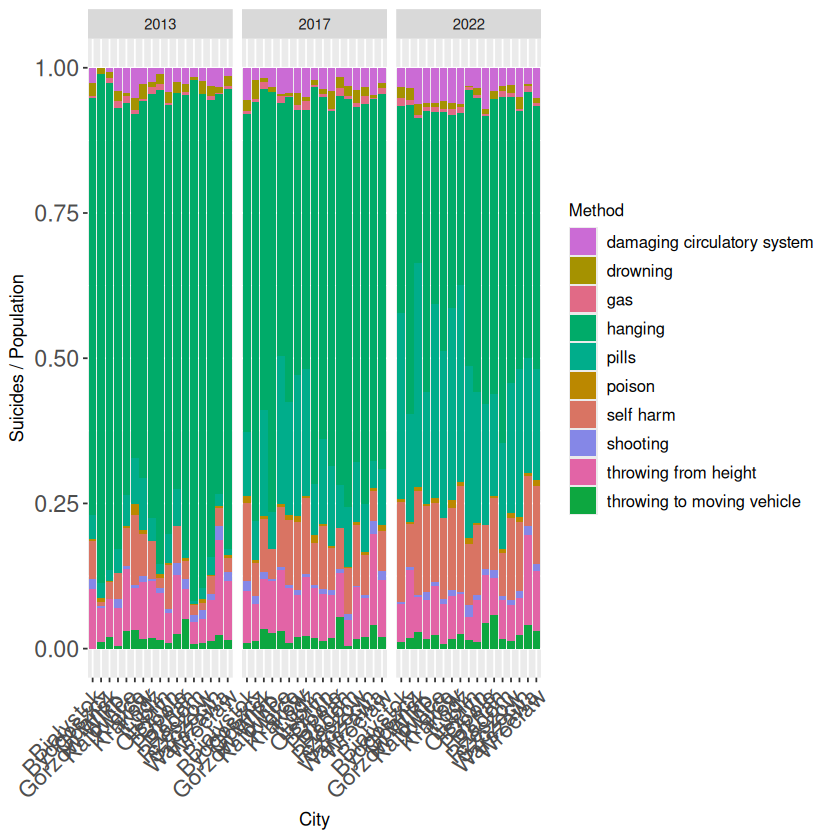

In [157]:
way_city_op %>% filter(Year %in% c(2013,2017,2022) & Outcome == "Attempted") %>%
    ggplot(aes(x=City,y=`Suicides / Population`)) +
    geom_bar(stat="identity", aes(fill=Method), position="fill") +
    scale_fill_manual(values=randomized_colors)+
    facet_wrap(~Year) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE)) -> p
    #theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p 

In [158]:
ggsave(filename = paste(save_to, "way_city_att_suicides-131722.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

In [159]:
way_city_op %>% filter(City == "Gdańsk" & Year == 2022 & Outcome == "Attempted")

City,Year,Outcome,Method,Suicides / Population
<chr>,<int>,<chr>,<chr>,<dbl>
Gdańsk,2022,Attempted,gas,0.001202326
Gdańsk,2022,Attempted,poison,0.002061130
Gdańsk,2022,Attempted,damaging circulatory system,0.018034885
Gdańsk,2022,Attempted,self harm,0.051528242
Gdańsk,2022,Attempted,throwing from height,0.016832559
Gdańsk,2022,Attempted,drowning,0.005496346
Gdańsk,2022,Attempted,hanging,0.071624256
Gdańsk,2022,Attempted,throwing to moving vehicle,0.008416279
Gdańsk,2022,Attempted,shooting,0.001030565


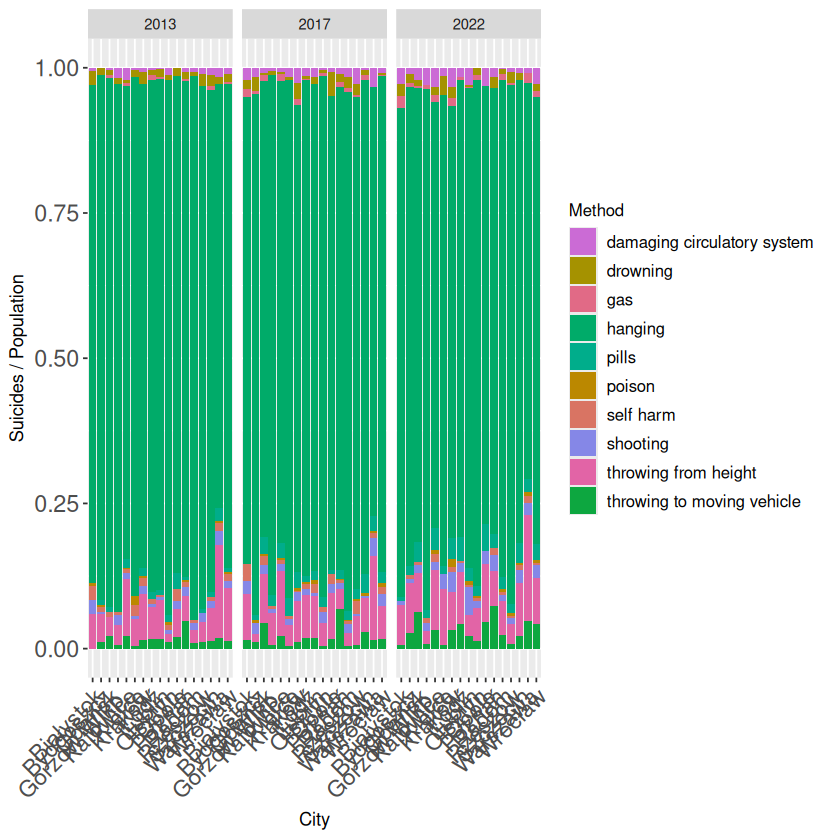

In [160]:

way_city_op %>% filter(Year %in% c(2013,2017,2022) & Outcome == "Fatal") %>%
    ggplot(aes(x=City,y=`Suicides / Population`)) +
    geom_bar(stat="identity", aes(fill=Method), position="fill") +
    scale_fill_manual(values=randomized_colors)+
    facet_wrap(~Year) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE)) -> p
    #theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p 

In [161]:
ggsave(filename = paste(save_to, "way_city_fat_suicides-131722.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

In [162]:
# avg_years_way <- way %>% filter(year >= 2019 & year <= 2022) %>% # filter(garnizon == "Katowice" | garnizon == "Opole") %>% filter(method == "hanging" | method == "drowning")  %>% 
#     group_by(garnizon, method, outcome) %>%
#     summarize(average_suicides = mean(suicides), .groups='drop') %>%
#     left_join(population, by=c('garnizon')) %>%
#     mutate(average_suicides_by_pop = average_suicides/population) %>%
#     select(garnizon, method, outcome, average_suicides_by_pop)
# # avg_years_way

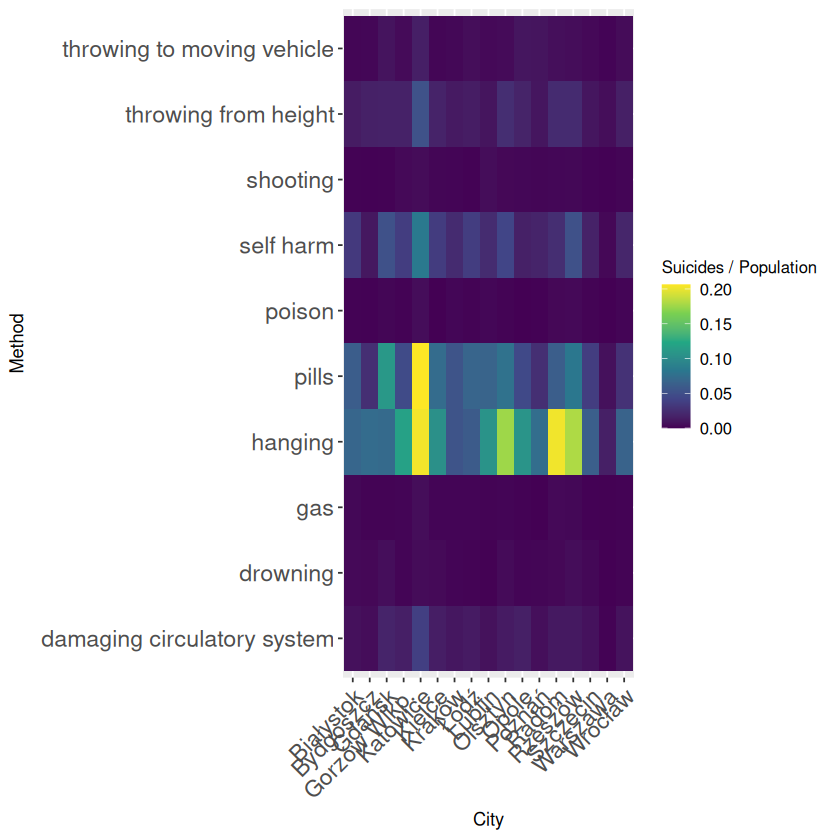

In [163]:
way_city_op %>% filter(Outcome == "Attempted" & Year == 2022) %>%
    ggplot(aes(x=City, y=Method, fill=`Suicides / Population`)) +
    geom_tile() +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    #theme(axis.text.x = element_text(angle=45, hjust=1))+ 
    scale_fill_viridis_c() -> p
p

In [164]:

ggsave(filename = paste(save_to, "way_city_op-att-2022.pdf", sep=''), plot = p, width = 15, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”


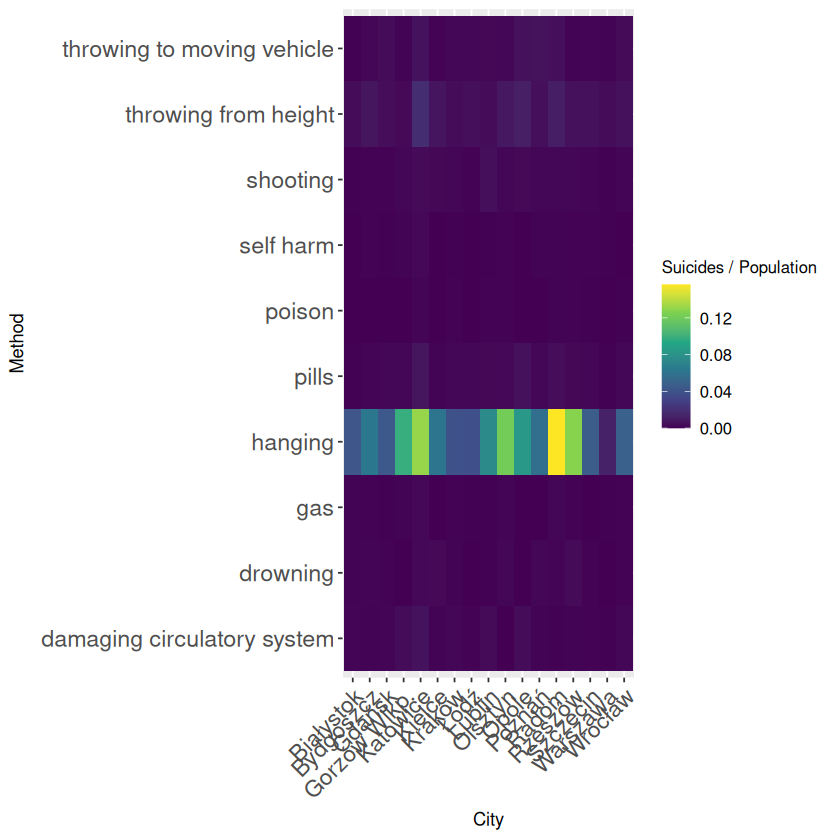

In [165]:
way_city_op %>% filter(Outcome == "Fatal" & Year == 2022) %>%
    ggplot(aes(x=City, y=Method, fill=`Suicides / Population`)) +
    geom_tile() +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    #theme(axis.text.x = element_text(angle=45, hjust=1))+ 
    scale_fill_viridis_c() -> p
p

In [166]:
ggsave(filename = paste(save_to, "way_city_op-fat-2022.pdf", sep=''), plot = p, width = 15, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”


In [167]:
way_city_op %>% filter(Year == 2022 & Outcome == "Fatal" & Method == "hanging")

City,Year,Outcome,Method,Suicides / Population
<chr>,<int>,<chr>,<chr>,<dbl>
Bydgoszcz,2022,Fatal,hanging,0.06214584
Białystok,2022,Fatal,hanging,0.04158047
Gdańsk,2022,Fatal,hanging,0.04311196
Gorzów Wlkp.,2022,Fatal,hanging,0.09824711
Katowice,2022,Fatal,hanging,0.13095368
Kielce,2022,Fatal,hanging,0.06073226
Kraków,2022,Fatal,hanging,0.03886874
Łódź,2022,Fatal,hanging,0.03746189
Lublin,2022,Fatal,hanging,0.07484527


In [168]:
head(reason)

,Year,City,Reason,Suicides,Outcome
,<int>,<chr>,<chr>,<int>,<chr>
1,2013,Bydgoszcz,mental illness,19,Attempted
2,2013,Bydgoszcz,physical illness,13,Attempted
3,2013,Bydgoszcz,virus carrier,0,Attempted
4,2013,Bydgoszcz,disability,0,Attempted
5,2013,Bydgoszcz,family problems,28,Attempted
6,2013,Bydgoszcz,heartbreak,16,Attempted


In [169]:
reason %>% filter(Year < 2013 & Outcome == "Attempted")

Year,City,Reason,Suicides,Outcome
<int>,<chr>,<chr>,<int>,<chr>


In [170]:
poland_reason <- reason %>%
    group_by(Year, Outcome, Reason) %>%
    summarize(`Total suicides` = sum(Suicides), .groups='drop')
head(poland_reason)

Year,Outcome,Reason,Total suicides
<int>,<chr>,<chr>,<int>
1999,Fatal,committing a crime,58
1999,Fatal,death of a loved one,95
1999,Fatal,disability,23
1999,Fatal,family problems,464
1999,Fatal,heartbreak,144
1999,Fatal,loss of source of income,126


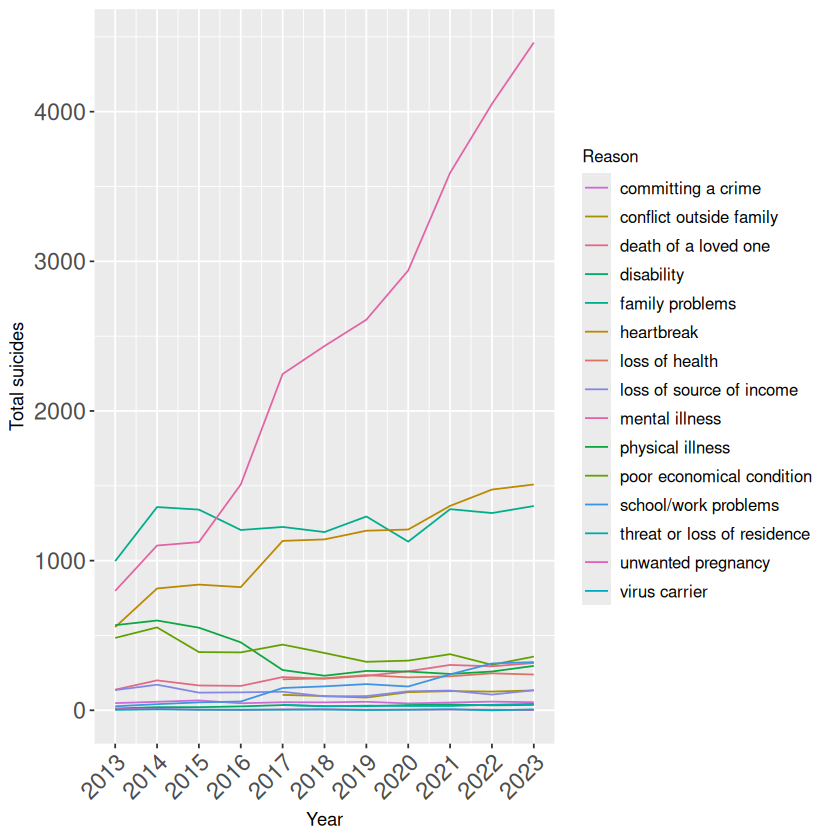

In [171]:
poland_reason %>% filter(Outcome == "Attempted") %>%
    ggplot(aes(x=Year,y=`Total suicides`)) +
    scale_color_manual(values=randomized_colors) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(color=Reason)) -> p
p <- p + scale_x_continuous(breaks = seq(min(poland_reason$Year), max(poland_reason$Year), by = 1))
p

In [172]:
ggsave(filename = paste(save_to, "reason_attempted.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

In [173]:
poland_reason %>% filter(Outcome == "Attempted" & Year == 2023)

Year,Outcome,Reason,Total suicides
<int>,<chr>,<chr>,<int>
2023,Attempted,committing a crime,54
2023,Attempted,conflict outside family,133
2023,Attempted,death of a loved one,316
2023,Attempted,disability,36
2023,Attempted,family problems,1365
2023,Attempted,heartbreak,1509
2023,Attempted,loss of health,239
2023,Attempted,loss of source of income,134
2023,Attempted,mental illness,4462


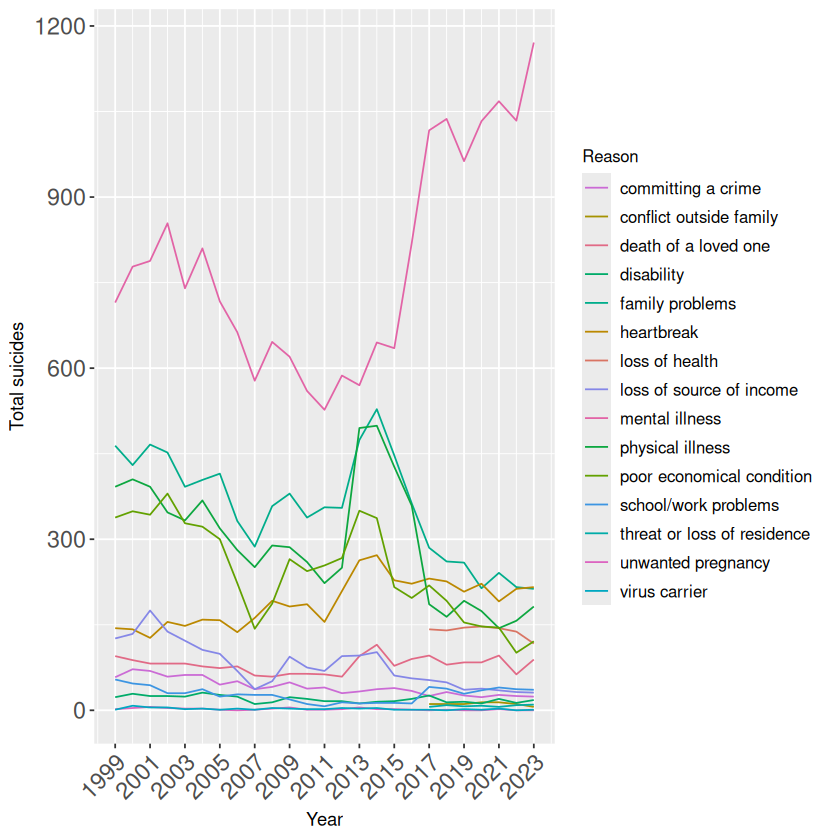

In [174]:
poland_reason %>% filter(Outcome == "Fatal") %>%
    ggplot(aes(x=Year,y=`Total suicides`)) +
    scale_color_manual(values=randomized_colors)+
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(color=Reason)) -> p
p <- p + scale_x_continuous(breaks = seq(min(poland_reason$Year), max(poland_reason$Year), by = STEP))
p

In [175]:
ggsave(filename = paste(save_to, "reason_fatal.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

In [176]:
poland_reason %>% filter(Year == 2022 & Outcome == "Fatal")

Year,Outcome,Reason,Total suicides
<int>,<chr>,<chr>,<int>
2022,Fatal,committing a crime,25
2022,Fatal,conflict outside family,11
2022,Fatal,death of a loved one,63
2022,Fatal,disability,13
2022,Fatal,family problems,216
2022,Fatal,heartbreak,213
2022,Fatal,loss of health,138
2022,Fatal,loss of source of income,32
2022,Fatal,mental illness,1034


In [177]:
poland_reason %>% filter(Reason == "school/work problems" & Outcome == "Attempted")

Year,Outcome,Reason,Total suicides
<int>,<chr>,<chr>,<int>
2013,Attempted,school/work problems,27
2014,Attempted,school/work problems,41
2015,Attempted,school/work problems,53
2016,Attempted,school/work problems,59
2017,Attempted,school/work problems,149
2018,Attempted,school/work problems,160
2019,Attempted,school/work problems,175
2020,Attempted,school/work problems,159
2021,Attempted,school/work problems,240


In [178]:
reason_foa <- poland_reason %>%
    pivot_wider(names_from = Outcome, values_from=`Total suicides`) %>%
    mutate(`Fatal / Attempted` = Fatal/Attempted * 100) %>%
    select(Year, Reason, `Fatal / Attempted`) %>% filter(Year >= 2013)

head(reason_foa)

Year,Reason,Fatal / Attempted
<int>,<chr>,<dbl>
2013,committing a crime,68.75000
2013,death of a loved one,68.84058
2013,disability,100.00000
2013,family problems,47.54263
2013,heartbreak,47.30216
2013,loss of source of income,71.11111


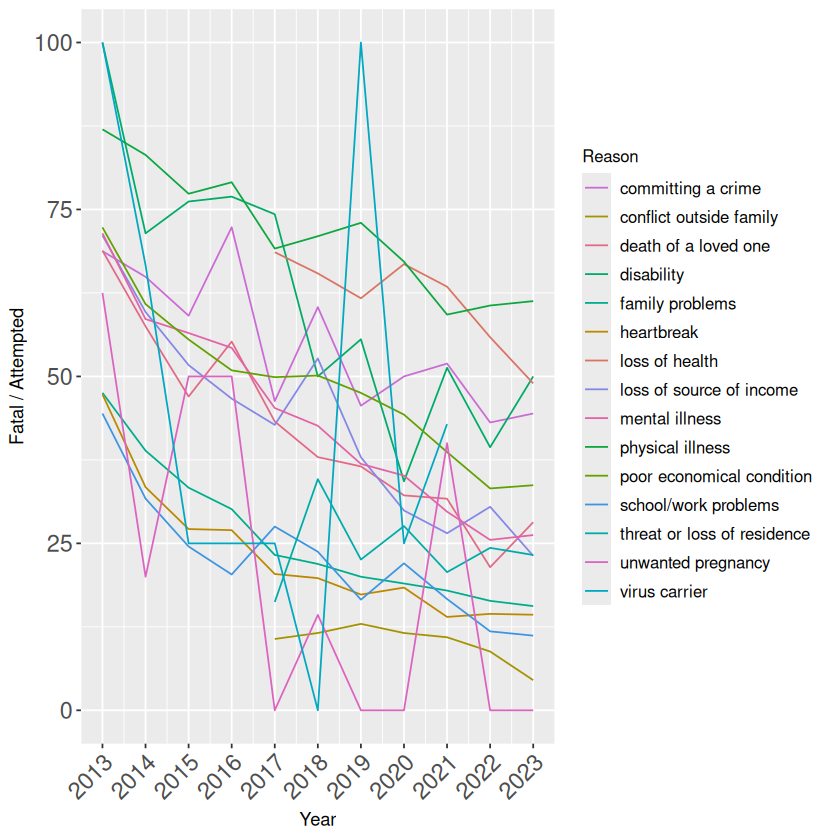

In [179]:
reason_foa %>%
    ggplot(aes(x=Year,y=`Fatal / Attempted`)) +
    scale_color_manual(values=randomized_colors)+
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(colour=Reason)) -> p
p <- p + scale_x_continuous(breaks = seq(min(reason_foa$Year), max(reason_foa$Year), by = 1))
p

In [180]:
reason_foa %>% filter(Year == 2023)

Year,Reason,Fatal / Attempted
<int>,<chr>,<dbl>
2023,committing a crime,44.444444
2023,conflict outside family,4.511278
2023,death of a loved one,28.164557
2023,disability,50.000000
2023,family problems,15.604396
2023,heartbreak,14.314115
2023,loss of health,48.953975
2023,loss of source of income,23.134328
2023,mental illness,26.243837


In [181]:
ggsave(filename = paste(save_to, "reason_foa.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

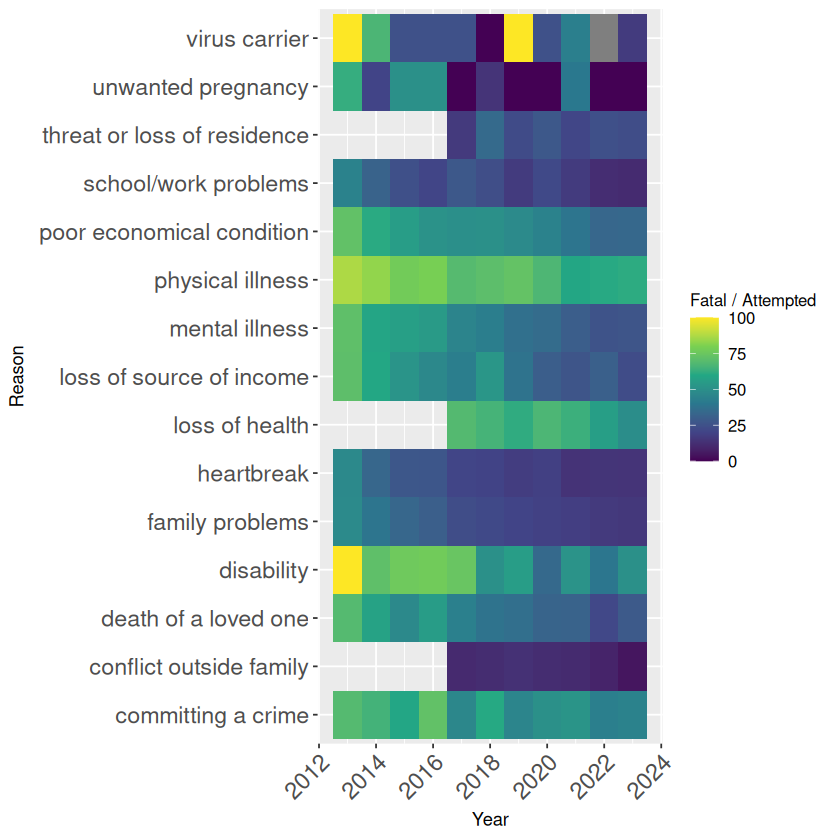

In [182]:
reason_foa %>% 
    ggplot(aes(x=Year, y=Reason, fill=`Fatal / Attempted`)) +
    geom_tile() +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    #theme(axis.text.x = element_text(angle = 45, hjust = 1))+ 
    scale_fill_viridis_c() -> p
p

In [183]:

ggsave(filename = paste(save_to, "reason_foa_heat.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

In [184]:
reason_city_op <- reason %>% 
    left_join(population, by=c('City')) %>%
    mutate(`Suicides / Population` = Suicides/Population*100) %>%
    select(City, Year, Outcome, Reason, `Suicides / Population`)

head(reason_city_op)

,City,Year,Outcome,Reason,Suicides / Population
,<chr>,<int>,<chr>,<chr>,<dbl>
1,Bydgoszcz,2013,Attempted,mental illness,0.005367141
2,Bydgoszcz,2013,Attempted,physical illness,0.003672254
3,Bydgoszcz,2013,Attempted,virus carrier,0.000000000
4,Bydgoszcz,2013,Attempted,disability,0.000000000
5,Bydgoszcz,2013,Attempted,family problems,0.007909470
6,Bydgoszcz,2013,Attempted,heartbreak,0.004519697


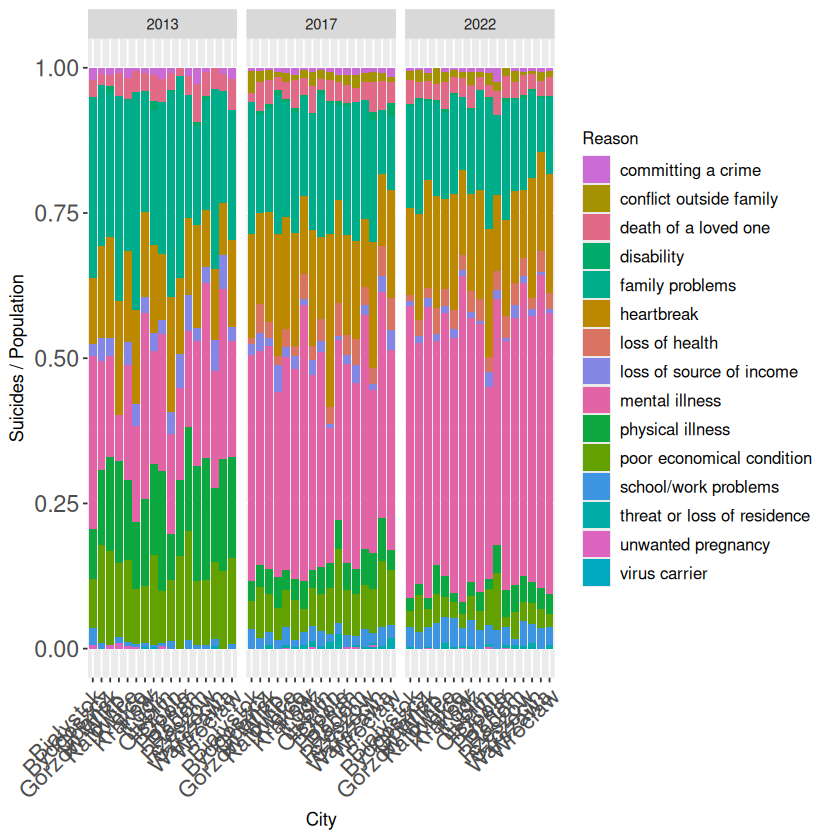

In [185]:
reason_city_op %>% filter(Year %in% c(2013,2017,2022) & Outcome == "Attempted") %>%
    ggplot(aes(x=City,y=`Suicides / Population`)) +
    geom_bar(stat="identity", aes(fill=Reason), position="fill") +
    scale_fill_manual(values=randomized_colors) +
    facet_wrap(~Year) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE)) -> p
    #theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p

In [186]:
ggsave(filename = paste(save_to, "reason_city_att_suicides-131722.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

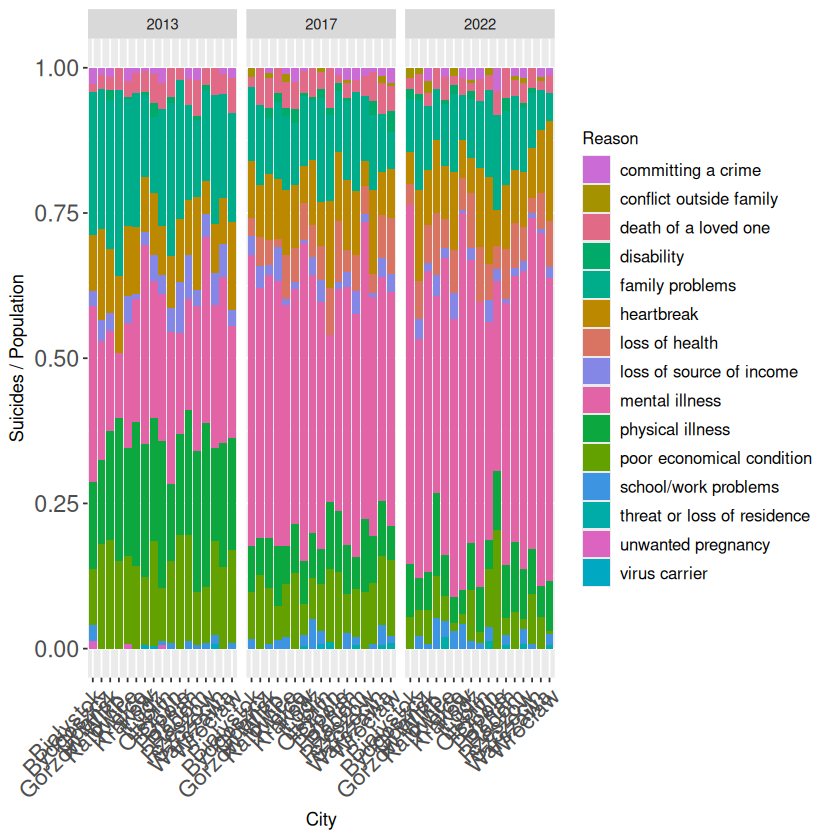

In [187]:

reason_city_op %>% filter(Year %in% c(2013,2017,2022) & Outcome == "Fatal") %>%
    ggplot(aes(x=City,y=`Suicides / Population`)) +
    geom_bar(stat="identity", aes(fill=Reason), position="fill") +
    scale_fill_manual(values=randomized_colors) +
    facet_wrap(~Year) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE)) -> p
    #theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p

In [188]:
ggsave(filename = paste(save_to, "reason_city_fat_suicides-131722.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

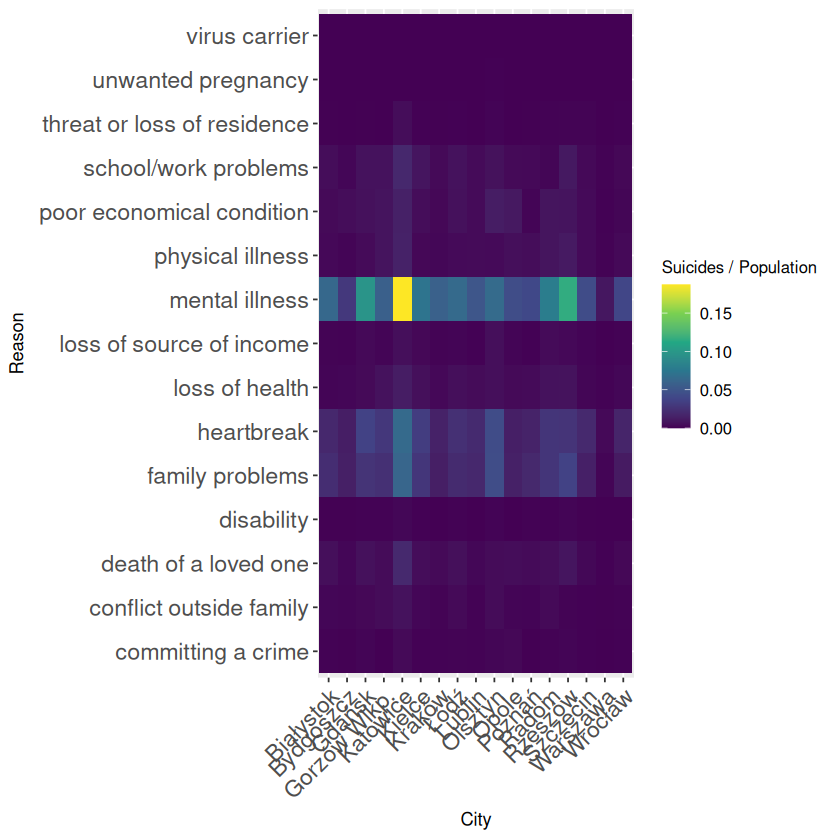

In [189]:
reason_city_op %>% filter(Outcome == "Attempted" & Year == 2022) %>%
    ggplot(aes(x=City, y=Reason, fill=`Suicides / Population`)) +
    geom_tile() +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    #theme(axis.text.x = element_text(angle = 45, hjust = 1))+ 
    scale_fill_viridis_c() -> p
p

In [190]:
ggsave(filename = paste(save_to, "reason_city_op-att-2022.pdf", sep=''), plot = p, width = 15, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”


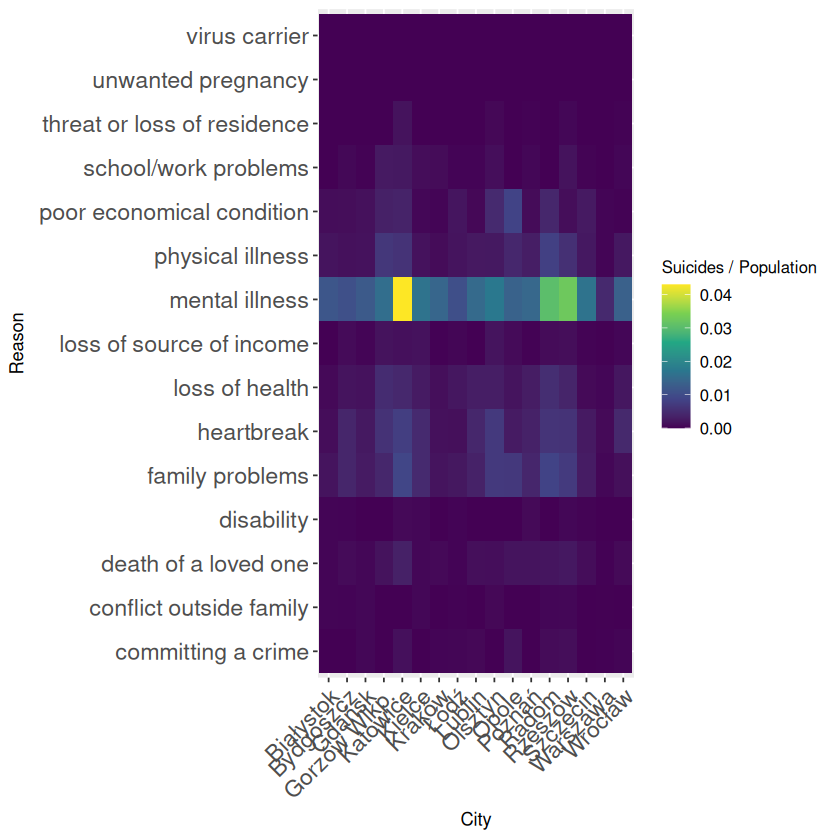

In [191]:
reason_city_op %>% filter(Outcome == "Fatal" & Year == 2022) %>%
    ggplot(aes(x=City, y=Reason, fill=`Suicides / Population`)) +
    geom_tile() +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    #theme(axis.text.x = element_text(angle = 45, hjust = 1))+ 
    scale_fill_viridis_c() -> p
p

In [192]:
ggsave(filename = paste(save_to, "reason_city_op-fat-2022.pdf", sep=''), plot = p, width = 15, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”


In [193]:
head(status)

,Year,City,Civil status,Suicides,Outcome
,<int>,<chr>,<chr>,<int>,<chr>
1,1999,Wrocław,single,119,Attempted
2,1999,Wrocław,married,155,Attempted
3,1999,Wrocław,concubine,20,Attempted
4,1999,Wrocław,widower,34,Attempted
5,1999,Wrocław,divorced,27,Attempted
6,1999,Wrocław,separated,4,Attempted


In [194]:
poland_status <- status %>%
    group_by(Year, Outcome, `Civil status`) %>%
    summarize(`Total suicides` = sum(Suicides), .groups='drop')
head(poland_status)

Year,Outcome,Civil status,Total suicides
<int>,<chr>,<chr>,<int>
1999,Attempted,concubine,128
1999,Attempted,divorced,289
1999,Attempted,married,2455
1999,Attempted,separated,68
1999,Attempted,single,1602
1999,Attempted,widower,392


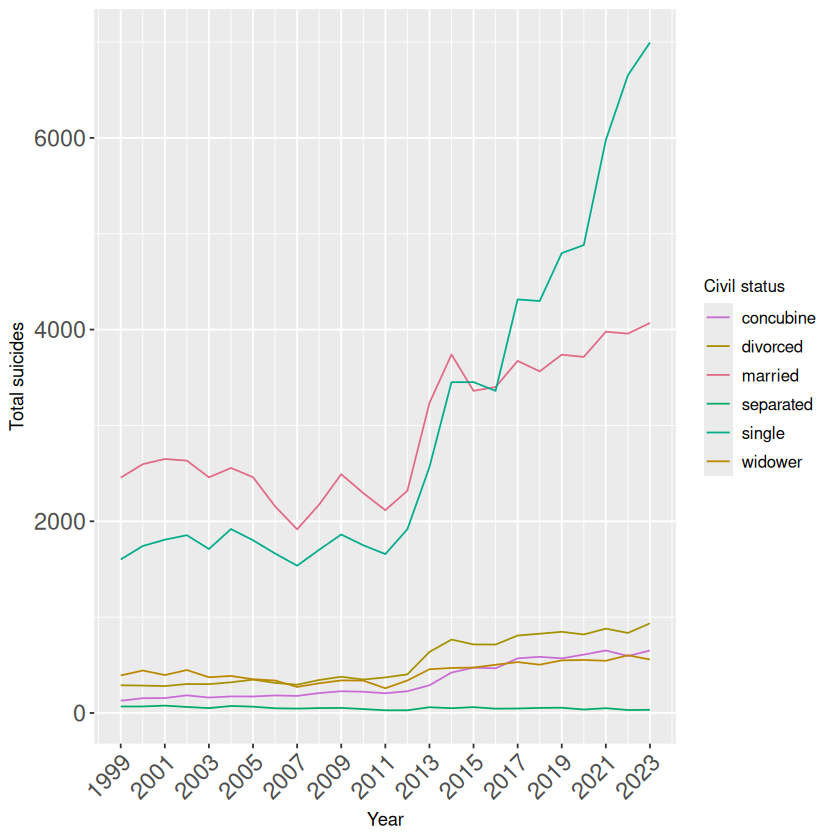

In [195]:
poland_status %>% filter(Outcome == "Attempted") %>%
    ggplot(aes(x=Year, y=`Total suicides`)) +
    scale_color_manual(values=randomized_colors)+
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(colour=`Civil status`)) -> p
p <- p + scale_x_continuous(breaks = seq(min(poland_status$Year), max(poland_status$Year), by = STEP))
p

In [196]:
ggsave(filename = paste(save_to, "status_attempted.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

In [197]:
poland_status %>% filter(Outcome == "Attempted" & Year == 2023)

Year,Outcome,Civil status,Total suicides
<int>,<chr>,<chr>,<int>
2023,Attempted,concubine,652
2023,Attempted,divorced,935
2023,Attempted,married,4069
2023,Attempted,separated,33
2023,Attempted,single,6995
2023,Attempted,widower,558


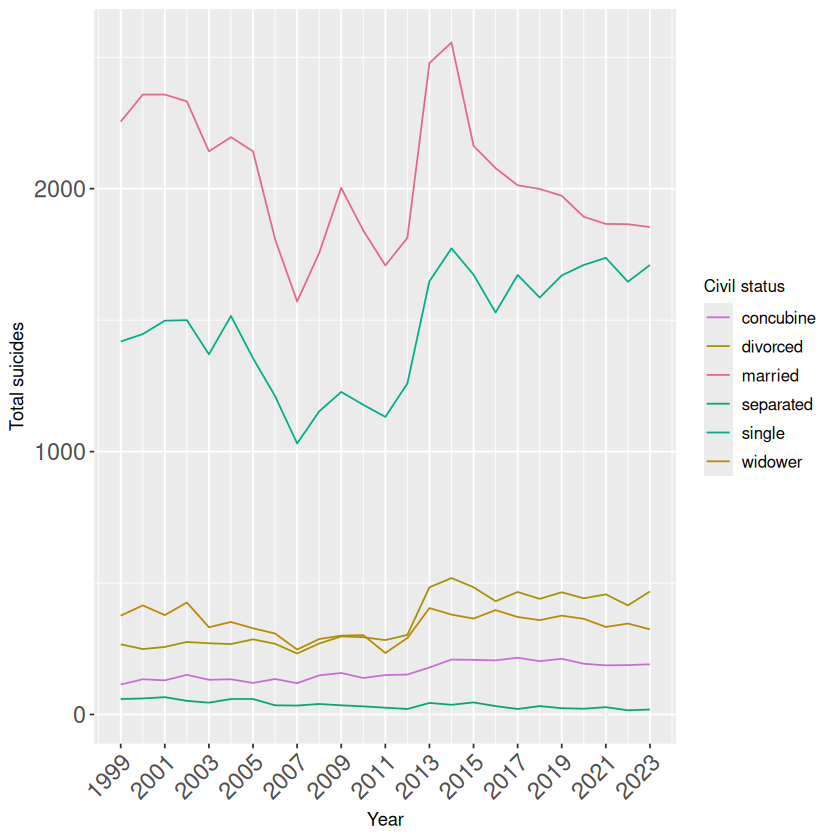

In [198]:
poland_status %>% filter(Outcome == "Fatal") %>%
    ggplot(aes(x=Year, y=`Total suicides`)) +
    scale_color_manual(values=randomized_colors)+
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(colour=`Civil status`)) -> p
p <- p + scale_x_continuous(breaks = seq(min(poland_status$Year), max(poland_status$Year), by = STEP))
p

In [199]:
ggsave(filename = paste(save_to, "status_fatal.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

In [200]:
poland_status %>% filter(Year == 2023 & Outcome == "Fatal")

Year,Outcome,Civil status,Total suicides
<int>,<chr>,<chr>,<int>
2023,Fatal,concubine,191
2023,Fatal,divorced,468
2023,Fatal,married,1854
2023,Fatal,separated,19
2023,Fatal,single,1710
2023,Fatal,widower,324


In [201]:
status_foa <- poland_status %>%
    pivot_wider(names_from = Outcome, values_from = `Total suicides`) %>%
    mutate(`Fatal / Attempted` = Fatal/Attempted * 100) %>%
    select(Year, `Civil status`, `Fatal / Attempted`)
head(status_foa)

Year,Civil status,Fatal / Attempted
<int>,<chr>,<dbl>
1999,concubine,89.06250
1999,divorced,92.38754
1999,married,91.85336
1999,separated,86.76471
1999,single,88.57678
1999,widower,95.91837


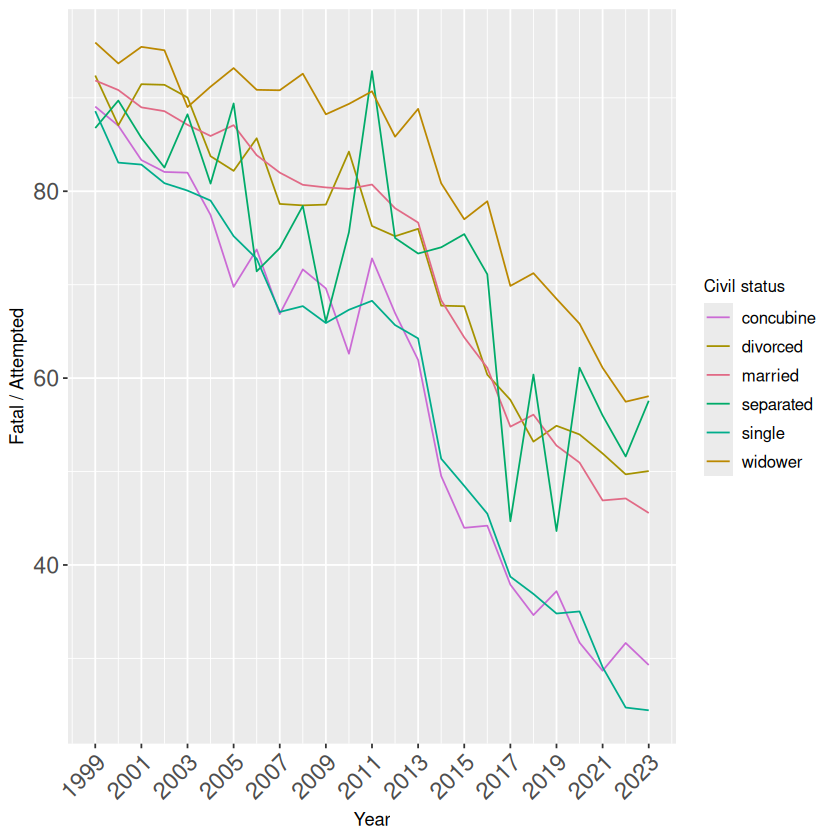

In [202]:
status_foa %>% 
    ggplot(aes(x=Year, y=`Fatal / Attempted`)) +
    scale_color_manual(values=randomized_colors)+
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(colour=`Civil status`)) -> p
p <- p + scale_x_continuous(breaks = seq(min(status_foa$Year), max(status_foa$Year), by = STEP))
p

In [203]:
ggsave(filename = paste(save_to, "status_foa.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

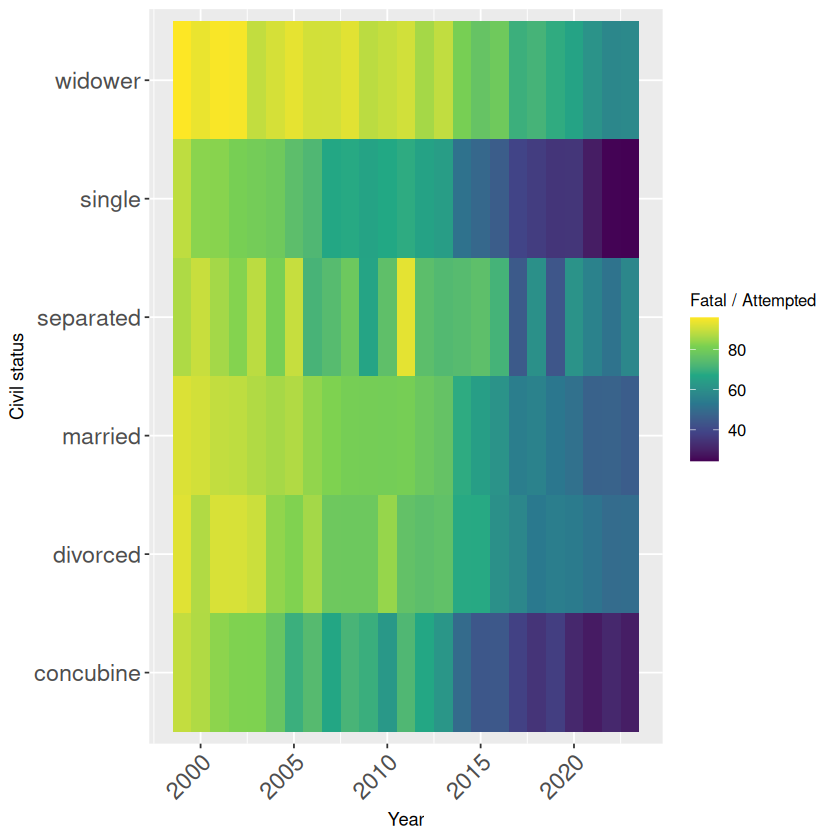

In [204]:
status_foa %>%
    ggplot(aes(x=Year, y=`Civil status`, fill=`Fatal / Attempted`)) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    #theme(axis.text.x = element_text(angle = 45, hjust = 1))+ 
    geom_tile() +
    scale_fill_viridis_c() -> p
p

In [205]:

ggsave(filename=paste(save_to, "status_foa_heat.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

In [206]:
# avg_years_status <- status %>% filter(year >= 2019 & year <= 2022) %>%
#     group_by(garnizon, civil_status, outcome) %>%
#     summarize(average_suicides = mean(suicides), .groups='drop') %>%
#     left_join(population, by=c('garnizon')) %>%
#     mutate(average_suicides_by_pop = average_suicides/population) %>%
#     select(garnizon, civil_status, outcome, average_suicides_by_pop)
# # avg_years_status

In [207]:
status_city_op <- status %>% 
    left_join(population, by=c('City')) %>%
    mutate(`Suicides / Population` = Suicides/Population*100) %>%
    select(City, Year, Outcome, `Civil status`, `Suicides / Population`)

head(status_city_op)

,City,Year,Outcome,Civil status,Suicides / Population
,<chr>,<int>,<chr>,<chr>,<dbl>
1,Wrocław,1999,Attempted,single,0.0186327915
2,Wrocław,1999,Attempted,married,0.0242696024
3,Wrocław,1999,Attempted,concubine,0.0031315616
4,Wrocław,1999,Attempted,widower,0.0053236547
5,Wrocław,1999,Attempted,divorced,0.0042276082
6,Wrocław,1999,Attempted,separated,0.0006263123


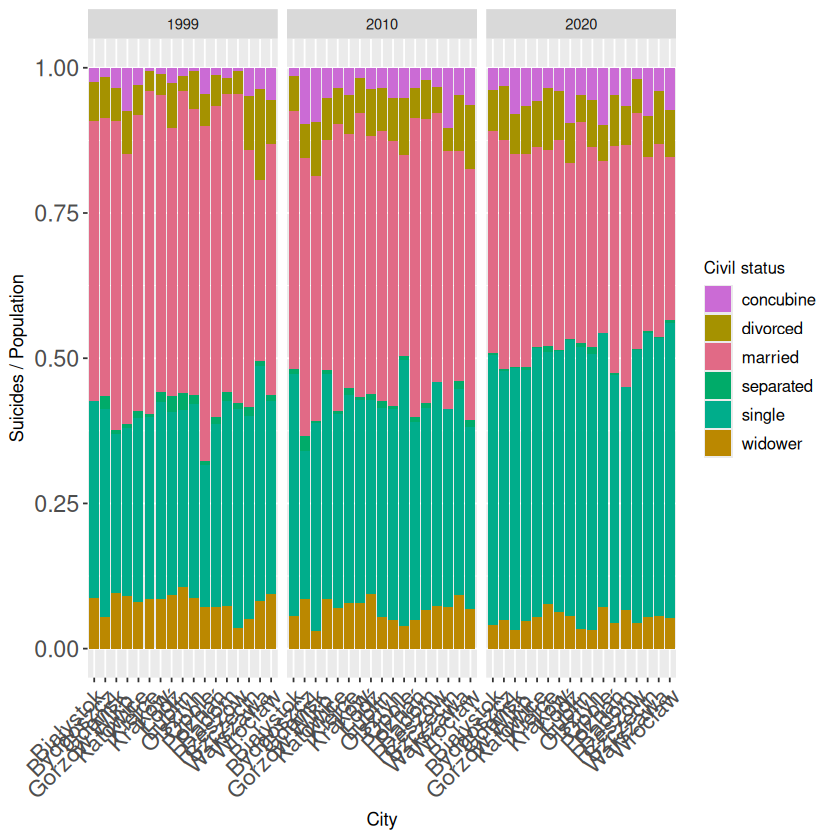

In [208]:
status_city_op %>% filter(Year %in% c(1999,2010,2020) & Outcome == "Attempted") %>%
    ggplot(aes(x=City,y=`Suicides / Population`)) +
    geom_bar(stat="identity", aes(fill=`Civil status`), position="fill") +
    scale_fill_manual(values=randomized_colors) +
    facet_wrap(~Year) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))->p
    #theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p

In [209]:
ggsave(filename = paste(save_to, "status_city_att_suicides-991020.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

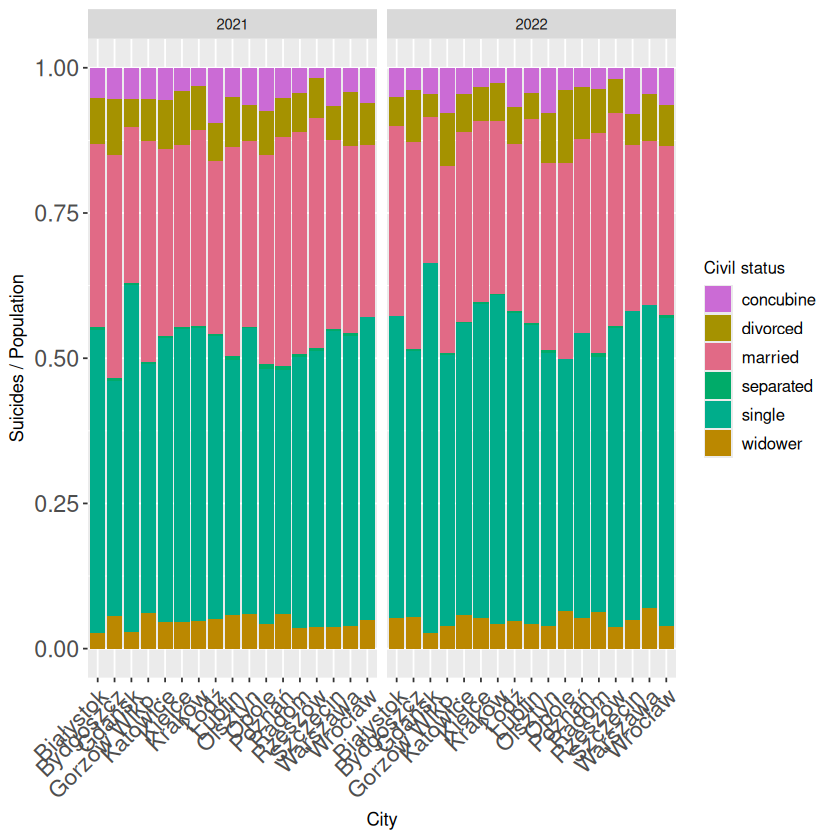

In [210]:
status_city_op %>% filter(Year %in% c(2021,2022) & Outcome == "Attempted") %>%
    ggplot(aes(x=City,y=`Suicides / Population`)) +
    geom_bar(stat="identity", aes(fill=`Civil status`), position="fill") +
    scale_fill_manual(values=randomized_colors) +
    facet_wrap(~Year) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))->p
    #theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p

In [211]:
ggsave(filename = paste(save_to, "status_city_att_suicides-2122.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

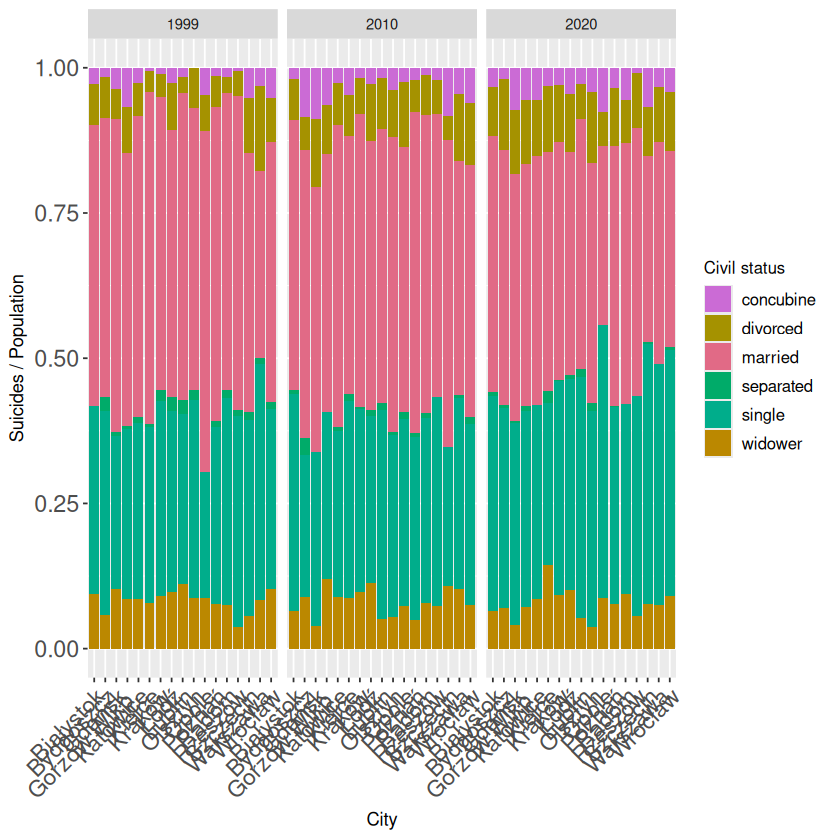

In [212]:
status_city_op %>% filter(Year %in% c(1999, 2010, 2020) & Outcome == "Fatal") %>%
    ggplot(aes(x=City,y=`Suicides / Population`)) +
    geom_bar(stat="identity", aes(fill=`Civil status`), position="fill") +
    scale_fill_manual(values=randomized_colors) +
    facet_wrap(~Year) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))->p
    #theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p

In [213]:
ggsave(filename = paste(save_to, "status_city_fat_suicides-991020.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

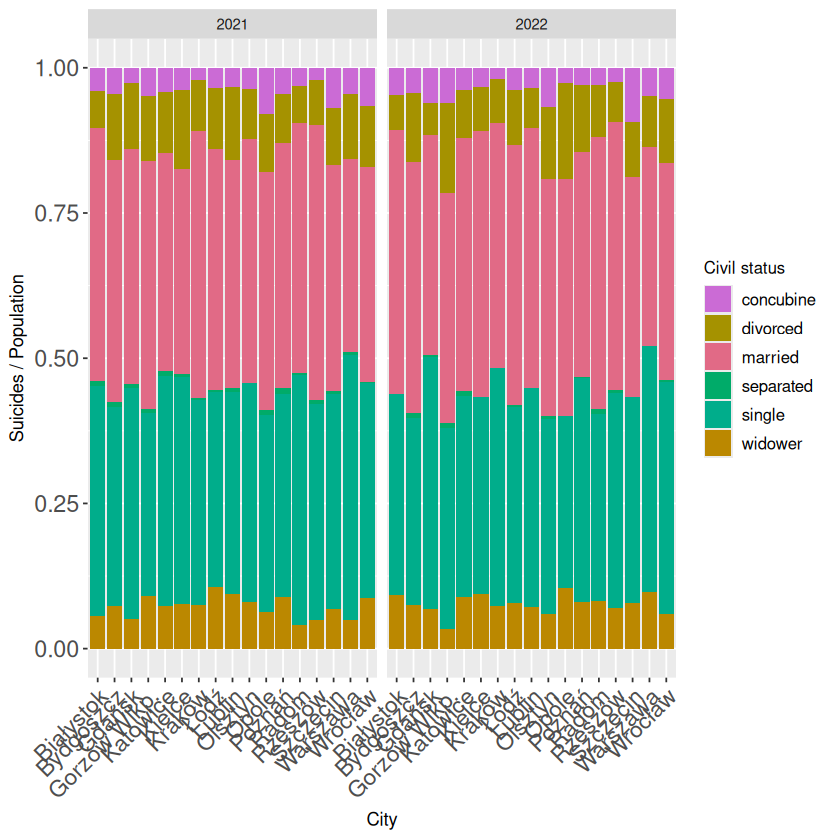

In [214]:
status_city_op %>% filter(Year %in% c(2021,2022) & Outcome == "Fatal") %>%
    ggplot(aes(x=City,y=`Suicides / Population`)) +
    geom_bar(stat="identity", aes(fill=`Civil status`), position="fill") +
    scale_fill_manual(values=randomized_colors) +
    facet_wrap(~Year) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))->p
    #theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p

In [215]:
ggsave(filename = paste(save_to, "status_city_fat_suicides-2122.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

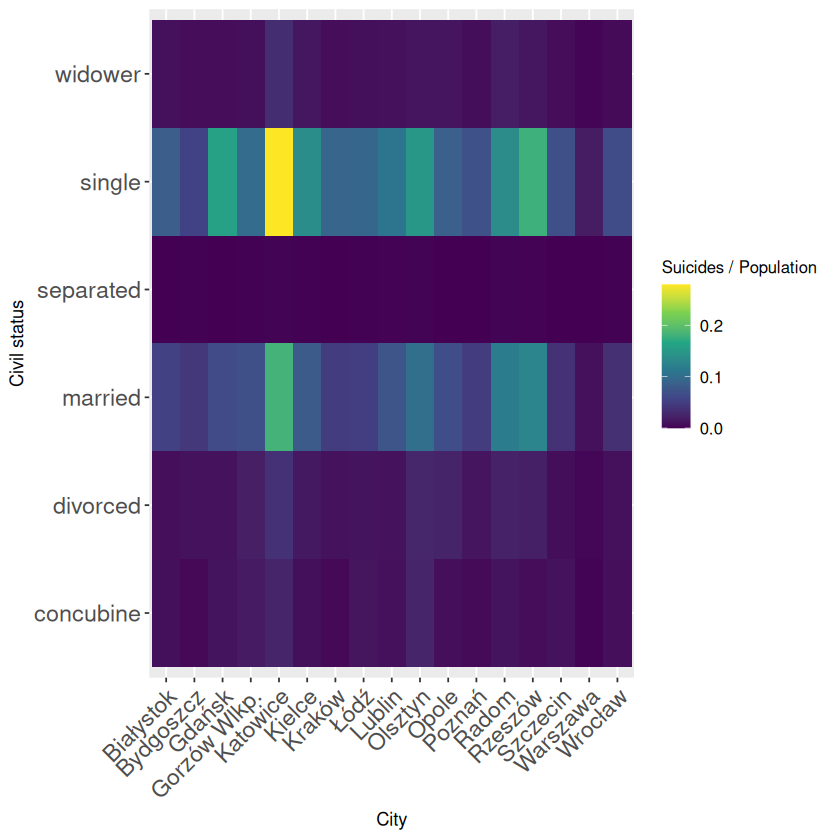

In [216]:
status_city_op %>% filter(Outcome == "Attempted" & Year == 2022) %>%
    ggplot(aes(x=City, y=`Civil status`, fill=`Suicides / Population`)) +
    geom_tile() +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    #theme(axis.text.x = element_text(angle = 45, hjust = 1))+ 
    scale_fill_viridis_c() -> p
p

In [217]:

ggsave(filename = paste(save_to, "status_city_op-att-2022.pdf", sep=''), plot = p, width = 15, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”


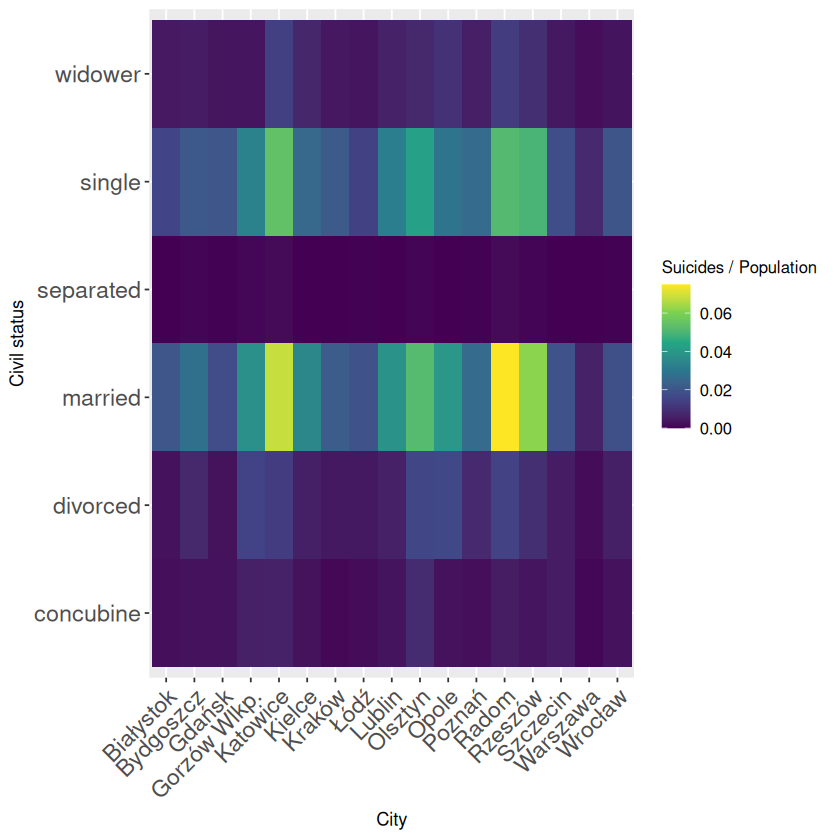

In [218]:
status_city_op %>% filter(Outcome == "Fatal" & Year == 2022) %>%
    ggplot(aes(x=City, y=`Civil status`, fill=`Suicides / Population`)) +
    geom_tile() +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    #theme(axis.text.x = element_text(angle = 45, hjust = 1))+ 
    scale_fill_viridis_c() -> p
p

In [219]:

ggsave(filename = paste(save_to, "status_city_op-fat-2022.pdf", sep=''), plot = p, width = 15, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”


In [220]:
head(education)

,Year,City,Education,Suicides,Outcome
,<int>,<chr>,<chr>,<int>,<chr>
1,1999,Wrocław,basic incomplete,13,Attempted
2,1999,Wrocław,basic,90,Attempted
3,1999,Wrocław,technical/professional,98,Attempted
4,1999,Wrocław,medium,35,Attempted
5,1999,Wrocław,higher,4,Attempted
6,1999,Bydgoszcz,basic incomplete,13,Attempted


In [221]:
poland_education <- education %>%
    group_by(Year, Outcome, Education) %>%
    summarize(`Total suicides` = sum(Suicides), .groups='drop')
head(poland_education)

Year,Outcome,Education,Total suicides
<int>,<chr>,<chr>,<int>
1999,Attempted,basic,1411
1999,Attempted,basic incomplete,291
1999,Attempted,higher,94
1999,Attempted,medium,437
1999,Attempted,technical/professional,1303
1999,Fatal,basic,1281


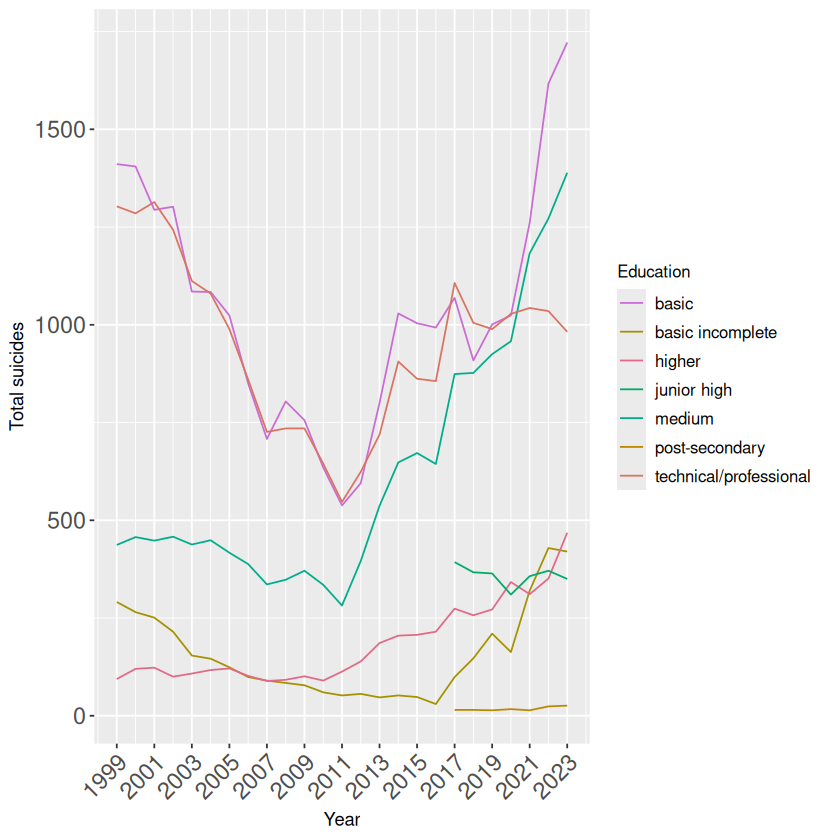

In [222]:
poland_education %>% filter(Outcome == "Attempted") %>%
    ggplot(aes(x=Year,y=`Total suicides`)) + 
    scale_color_manual(values=randomized_colors)+
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(colour=Education)) -> p
p <- p + scale_x_continuous(breaks = seq(min(poland_education$Year), max(poland_education$Year), by = STEP))
p

In [223]:
ggsave(filename = paste(save_to, "education_attempted.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

In [224]:
poland_education %>% filter(Year == 2023 & Outcome == "Attempted")

Year,Outcome,Education,Total suicides
<int>,<chr>,<chr>,<int>
2023,Attempted,basic,1722
2023,Attempted,basic incomplete,420
2023,Attempted,higher,468
2023,Attempted,junior high,350
2023,Attempted,medium,1389
2023,Attempted,post-secondary,26
2023,Attempted,technical/professional,982


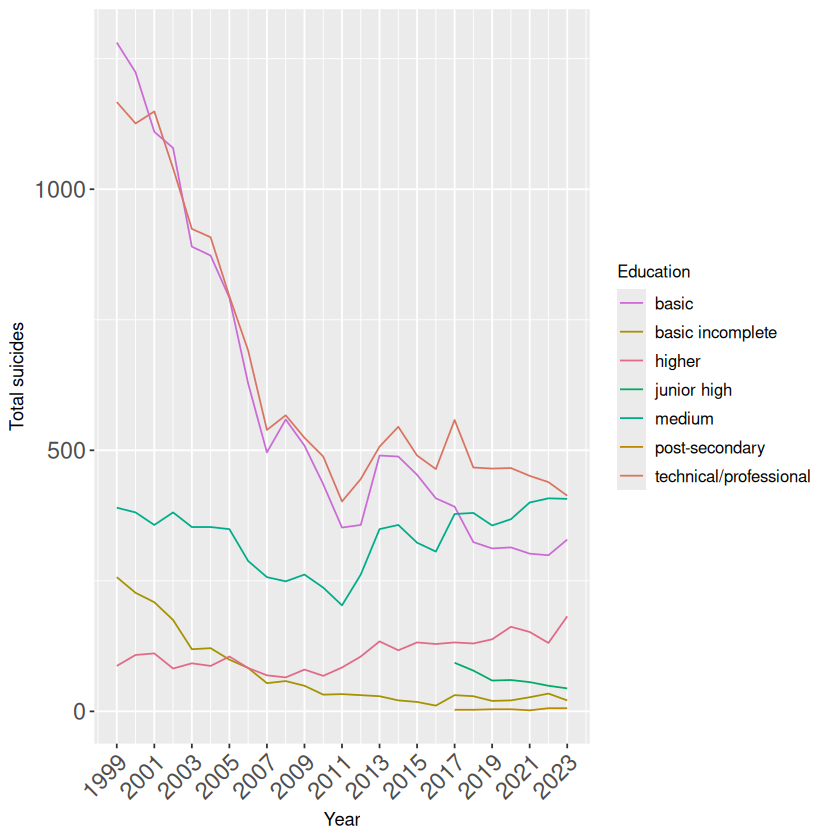

In [225]:
poland_education %>% filter(Outcome == "Fatal") %>%
    ggplot(aes(x=Year,y=`Total suicides`)) + 
    scale_color_manual(values=randomized_colors) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(colour=Education)) -> p
p <- p + scale_x_continuous(breaks = seq(min(poland_education$Year), max(poland_education$Year), by = STEP))
p

In [226]:
ggsave(filename = paste(save_to, "education_fatal.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

In [227]:
education_foa <- poland_education %>%
    pivot_wider(names_from=Outcome, values_from=`Total suicides`) %>%
    mutate(`Fatal / Attempted` = Fatal/Attempted*100) %>%
    select(Year, Education, `Fatal / Attempted`)
head(education_foa)

Year,Education,Fatal / Attempted
<int>,<chr>,<dbl>
1999,basic,90.78668
1999,basic incomplete,88.31615
1999,higher,92.55319
1999,medium,89.24485
1999,technical/professional,89.56255
2000,basic,87.11744


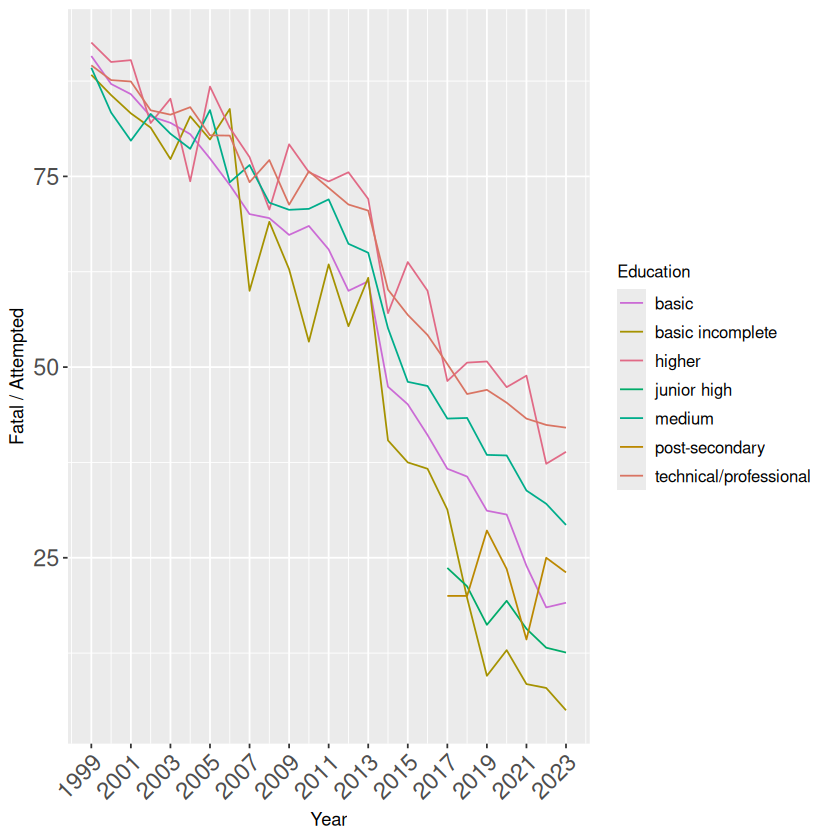

In [228]:
education_foa %>%
    ggplot(aes(x=Year, y=`Fatal / Attempted`)) +
    scale_color_manual(values=randomized_colors)+
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(colour=Education)) -> p
p <- p + scale_x_continuous(breaks = seq(min(education_foa$Year), max(education_foa$Year), by = STEP))
p

In [229]:
ggsave(filename = paste(save_to, "education_foa.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

In [230]:
education_foa %>% filter(Year == 2023)

Year,Education,Fatal / Attempted
<int>,<chr>,<dbl>
2023,basic,19.10569
2023,basic incomplete,5.00000
2023,higher,38.88889
2023,junior high,12.57143
2023,medium,29.30166
2023,post-secondary,23.07692
2023,technical/professional,42.05703


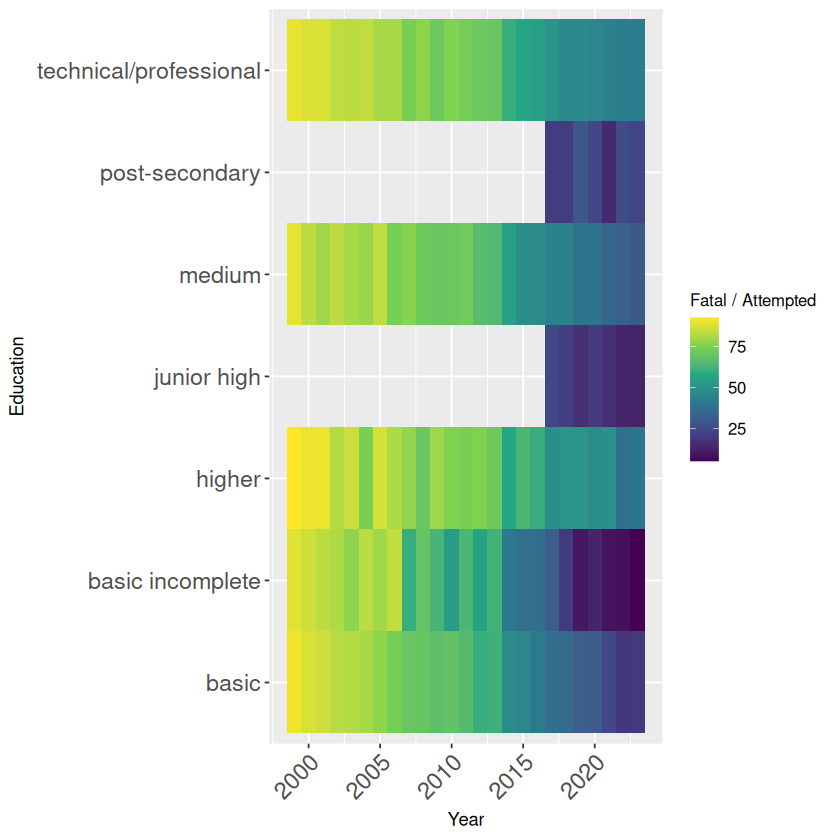

In [231]:
education_foa %>%
    ggplot(aes(x=Year, y=Education, fill=`Fatal / Attempted`)) +
    geom_tile() +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    scale_fill_viridis_c() -> p
p

In [232]:

ggsave(filename=paste(save_to, "education_foa_heat.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

In [233]:
education_city_op <- education %>% 
    left_join(population, by=c('City')) %>%
    mutate(`Suicides / Population` = Suicides/Population*100) %>%
    select(City, Year, Outcome, Education, `Suicides / Population`)

head(education_city_op)

,City,Year,Outcome,Education,Suicides / Population
,<chr>,<int>,<chr>,<chr>,<dbl>
1,Wrocław,1999,Attempted,basic incomplete,0.0020355150
2,Wrocław,1999,Attempted,basic,0.0140920272
3,Wrocław,1999,Attempted,technical/professional,0.0153446518
4,Wrocław,1999,Attempted,medium,0.0054802328
5,Wrocław,1999,Attempted,higher,0.0006263123
6,Bydgoszcz,1999,Attempted,basic incomplete,0.0036722541


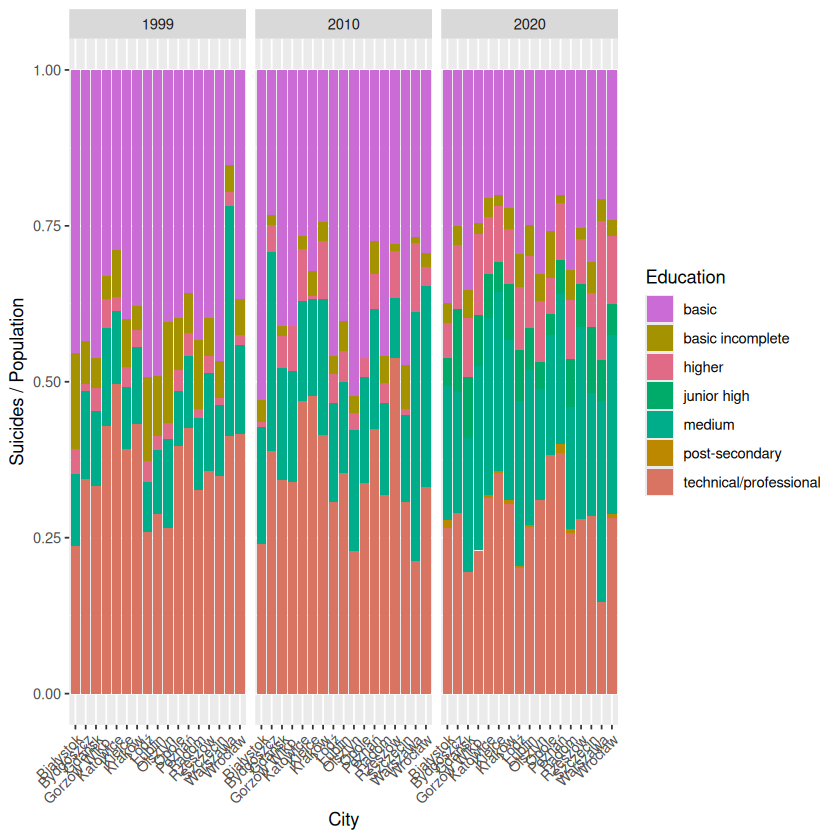

In [234]:
education_city_op %>% filter(Year %in% c(1999, 2010, 2020)) %>% 
    ggplot(aes(x=City,y=`Suicides / Population`)) +
    geom_bar(stat="identity", aes(fill=Education), position="fill") +
    scale_fill_manual(values=randomized_colors) +
    facet_wrap(~Year) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p    

In [235]:
ggsave(filename = paste(save_to, "education_city_att_suicides-991020.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

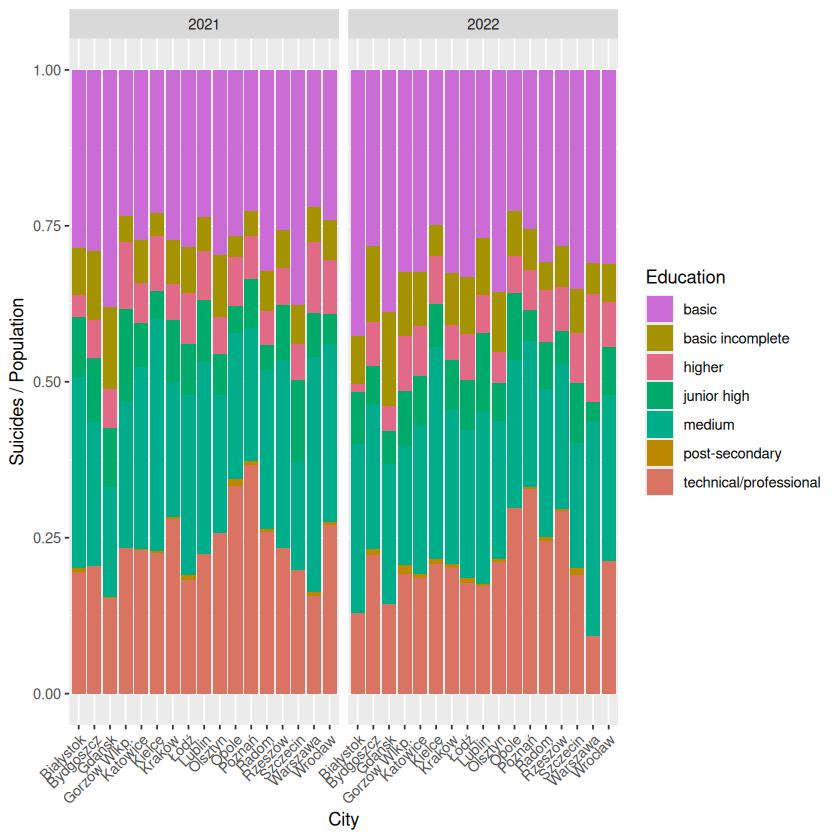

In [236]:
education_city_op %>% filter(Year %in% c(2021,2022) & Outcome == "Attempted") %>% 
    ggplot(aes(x=City,y=`Suicides / Population`)) +
    geom_bar(stat="identity", aes(fill=Education), position="fill") +
    scale_fill_manual(values=randomized_colors) +
    facet_wrap(~Year) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p    

In [237]:
ggsave(filename = paste(save_to, "education_city_att_suicides-2122.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

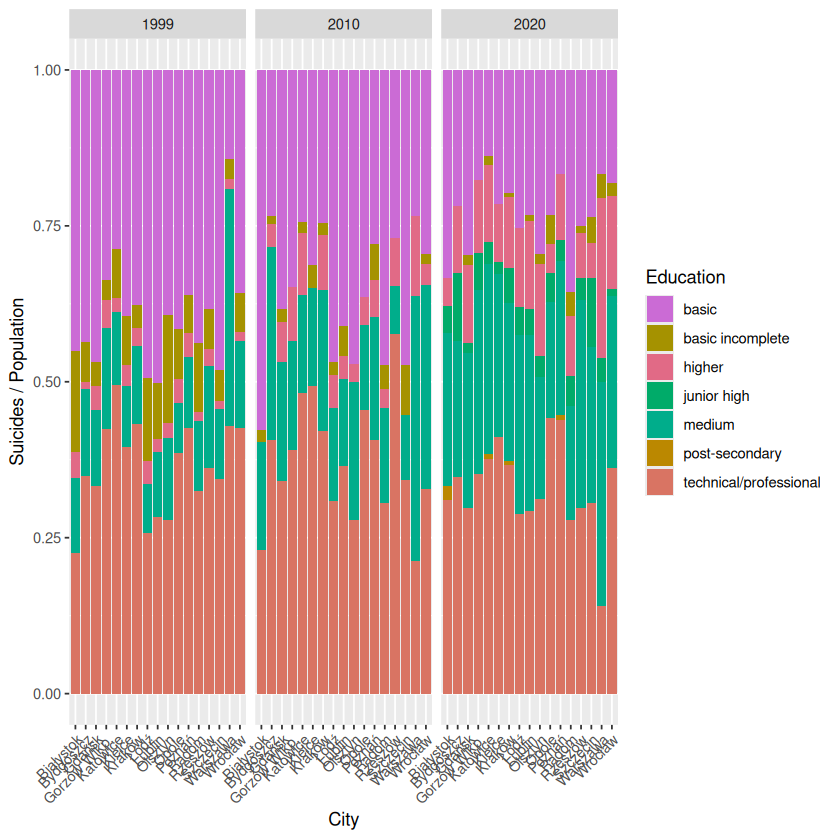

In [238]:
education_city_op %>% filter(Year %in% c(1999, 2010, 2020) & Outcome == "Fatal") %>% 
    ggplot(aes(x=City,y=`Suicides / Population`)) +
    geom_bar(stat="identity", aes(fill=Education), position="fill") +
    scale_fill_manual(values=randomized_colors) +
    facet_wrap(~Year) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p    

In [239]:
ggsave(filename = paste(save_to, "education_city_fat_suicides-991020.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

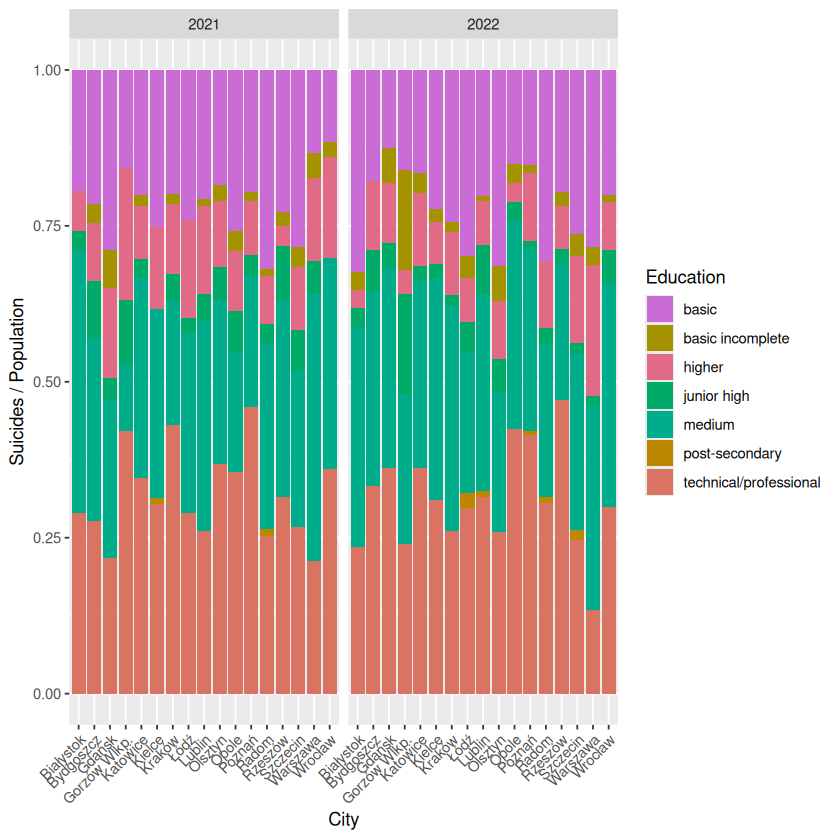

In [240]:
education_city_op %>% filter(Year %in% c(2021,2022) & Outcome == "Fatal") %>% 
    ggplot(aes(x=City,y=`Suicides / Population`)) +
    geom_bar(stat="identity", aes(fill=Education), position="fill") +
    scale_fill_manual(values=randomized_colors) +
    facet_wrap(~Year) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p    

In [241]:
ggsave(filename = paste(save_to, "education_city_fat_suicides-2122.pdf", sep=''), plot = p, width = 10, height = 6, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

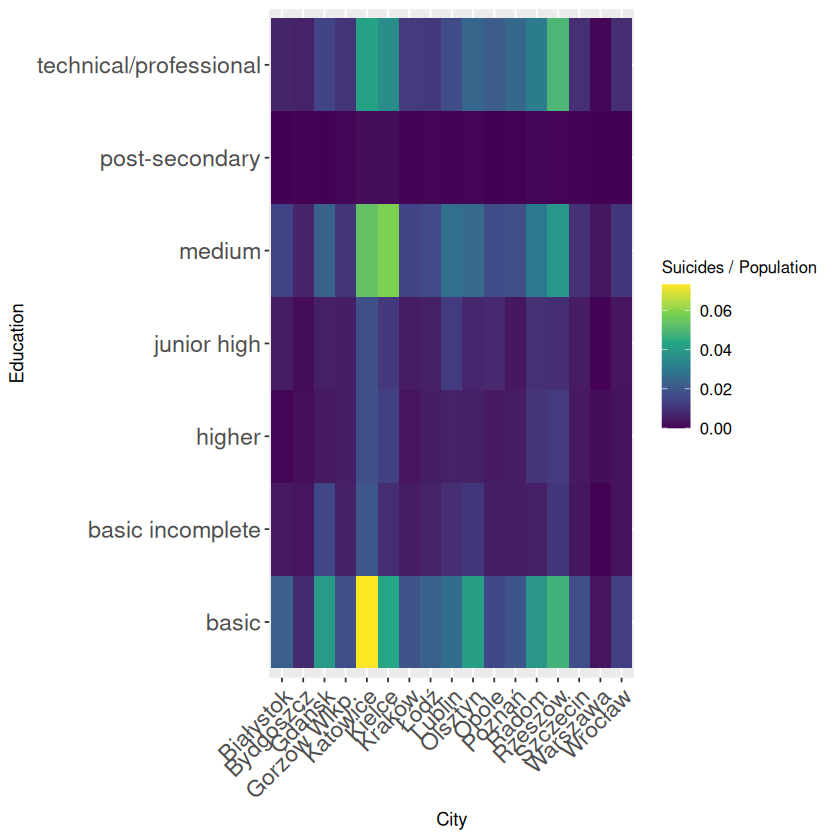

In [242]:
education_city_op %>% filter(Outcome == "Attempted" & Year == 2022) %>%
    ggplot(aes(x=City, y=Education, fill=`Suicides / Population`)) +
    geom_tile() +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    #theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+ 
    #theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    scale_fill_viridis_c() -> p
p

In [243]:

ggsave(filename = paste(save_to, "education_city_op-att-2022.pdf", sep=''), plot = p, width = 15, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”


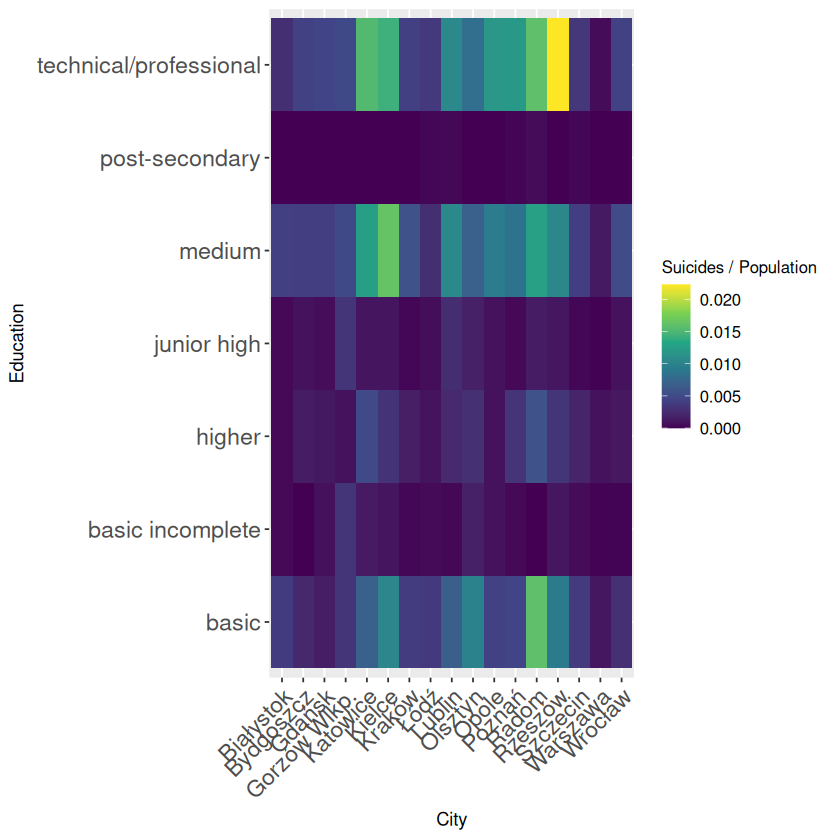

In [244]:
education_city_op %>% filter(Outcome == "Fatal" & Year == 2022) %>%
    ggplot(aes(x=City, y=Education, fill=`Suicides / Population`)) +
    geom_tile() +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    # theme(axis.text.x = element_text(angle = 45, hjust = 1))+ 
    scale_fill_viridis_c() -> p
p 

In [245]:
ggsave(filename = paste(save_to, "education_city_op-fat-2022.pdf", sep=''), plot = p, width = 15, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”


In [246]:
head(job)

,Year,City,Occupation,Suicides,Outcome
,<int>,<chr>,<chr>,<int>,<chr>
1,1999,Wrocław,manual,55,Attempted
2,1999,Wrocław,white collar,12,Attempted
3,1999,Wrocław,self-employed,12,Attempted
4,1999,Wrocław,farmer,12,Attempted
5,1999,Wrocław,student (elementary),16,Attempted
6,1999,Wrocław,student (college/university),3,Attempted


In [247]:
poland_job <- job %>%
    group_by(Year, Outcome, Occupation) %>%
    summarize(`Total suicides` = sum(Suicides), .groups='drop')
head(poland_job)

Year,Outcome,Occupation,Total suicides
<int>,<chr>,<chr>,<int>
1999,Attempted,farmer,509
1999,Attempted,manual,858
1999,Attempted,self-employed,172
1999,Attempted,student (college/university),52
1999,Attempted,student (elementary),298
1999,Attempted,unemployed,1143


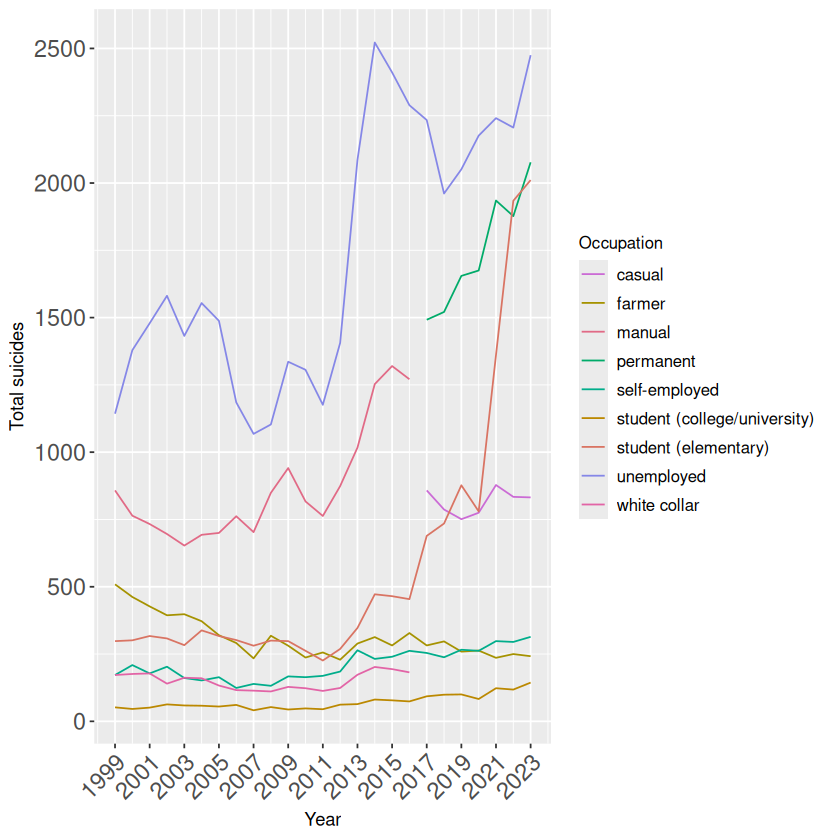

In [248]:
poland_job %>% filter(Outcome == "Attempted") %>%
    ggplot(aes(x=Year,y=`Total suicides`)) +
    scale_color_manual(values=randomized_colors)+
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(colour=Occupation)) -> p
p <- p + scale_x_continuous(breaks = seq(min(poland_job$Year), max(poland_job$Year), by = STEP))
p

In [249]:
ggsave(filename = paste(save_to, "job_attempted.pdf", sep=''), plot = p, width = 15, height = 15, units = "in", dpi = 300)

In [250]:
poland_job %>% filter(Year == 2015 & Outcome == "Attempted")

Year,Outcome,Occupation,Total suicides
<int>,<chr>,<chr>,<int>
2015,Attempted,farmer,282
2015,Attempted,manual,1320
2015,Attempted,self-employed,240
2015,Attempted,student (college/university),78
2015,Attempted,student (elementary),465
2015,Attempted,unemployed,2411
2015,Attempted,white collar,194


In [251]:
poland_job %>% filter(Year == 2023 & Outcome == "Attempted")

Year,Outcome,Occupation,Total suicides
<int>,<chr>,<chr>,<int>
2023,Attempted,casual,832
2023,Attempted,farmer,242
2023,Attempted,permanent,2077
2023,Attempted,self-employed,314
2023,Attempted,student (college/university),144
2023,Attempted,student (elementary),2011
2023,Attempted,unemployed,2475


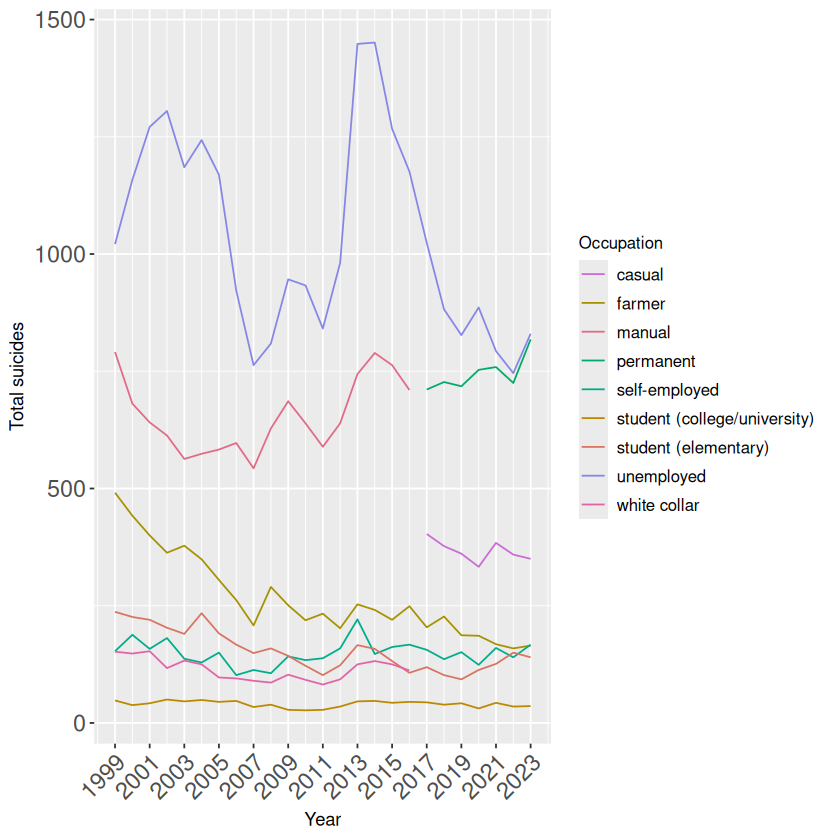

In [252]:
poland_job %>% filter(Outcome == "Fatal") %>%
    ggplot(aes(x=Year,y=`Total suicides`)) +
    scale_color_manual(values=randomized_colors)+
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(colour=Occupation)) -> p
p <- p + scale_x_continuous(breaks = seq(min(poland_job$Year), max(poland_job$Year), by = STEP))
p

In [253]:
ggsave(filename = paste(save_to, "job_fatal.pdf", sep=''), plot = p, width = 15, height = 15, units = "in", dpi = 300)

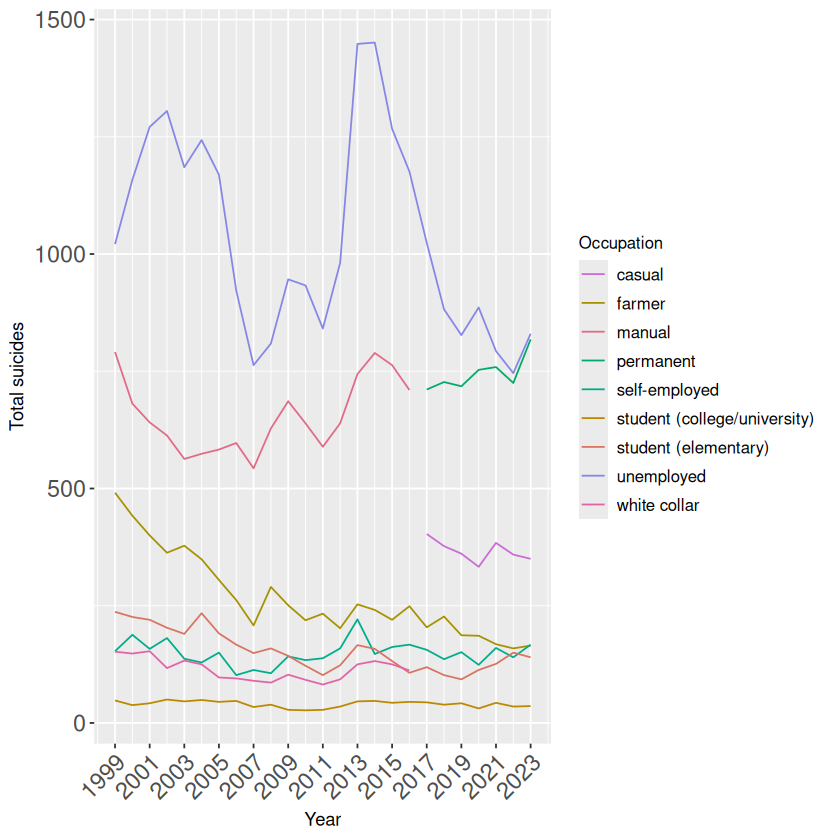

In [254]:

# Larger but same as above
poland_job %>% filter(Outcome == "Fatal") %>%
    ggplot(aes(x=Year,y=`Total suicides`)) +
    scale_color_manual(values=randomized_colors)+
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(colour=Occupation)) -> p
p <- p + scale_x_continuous(breaks = seq(min(poland_job$Year), max(poland_job$Year), by = STEP))
p

In [255]:
ggsave(filename = paste(save_to, "pl-fat-job-1999.pdf", sep=''), plot = p, width = 15, height = 15, units = "in", dpi = 300)

In [256]:
# poland_job %>% filter(Year >= 1999 & Outcome == "Fatal") %>%
#     ggplot(aes(x=Year, y=`Total suicides`)) +
#     geom_line(aes(color=Occupation)) -> p
# p <- p + scale_x_continuous(breaks = seq(min(poland_job$Year), max(poland_job$Year), by = 1))
# p   

In [257]:
# ggsave(filename = paste(save_to, "pl-fat-job-1999.pdf", sep=''), plot = p, width = 12, height = 6, units = "in", dpi = 300)

In [258]:
job_foa <- poland_job %>%
    pivot_wider(names_from=Outcome,values_from=`Total suicides`) %>%
    mutate(`Fatal / Attempted`=Fatal/Attempted*100) %>% 
    select(Year,Occupation,`Fatal / Attempted`)
head(job_foa)

Year,Occupation,Fatal / Attempted
<int>,<chr>,<dbl>
1999,farmer,96.46365
1999,manual,92.19114
1999,self-employed,88.95349
1999,student (college/university),92.30769
1999,student (elementary),79.53020
1999,unemployed,89.32633


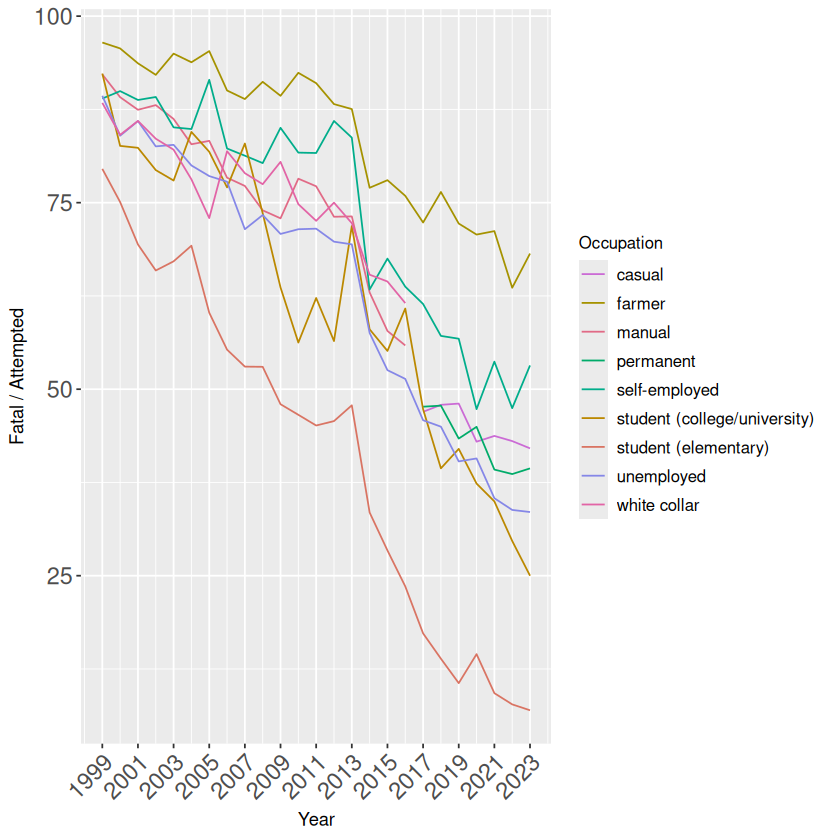

In [259]:
job_foa %>%
    ggplot(aes(x=Year,y=`Fatal / Attempted`)) +
    scale_color_manual(values=randomized_colors)+
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    geom_line(aes(colour=Occupation)) -> p
p <- p + scale_x_continuous(breaks = seq(min(job_foa$Year), max(job_foa$Year), by = STEP))
p

In [260]:
ggsave(filename = paste(save_to, "job_foa.pdf", sep=''), plot = p, width = 15, height = 15, units = "in", dpi = 300)

In [261]:
job_foa %>% filter(Year == 2023)

Year,Occupation,Fatal / Attempted
<int>,<chr>,<dbl>
2023,casual,42.067308
2023,farmer,68.181818
2023,permanent,39.383727
2023,self-employed,53.184713
2023,student (college/university),25.000000
2023,student (elementary),6.961711
2023,unemployed,33.535354


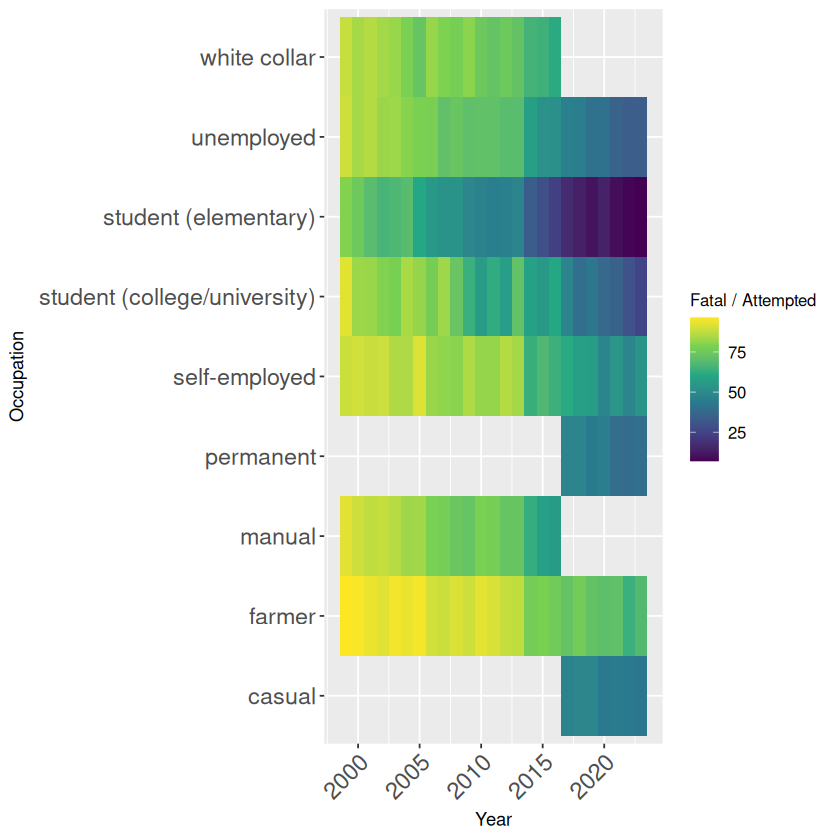

In [262]:
job_foa %>%
    ggplot(aes(x=Year, y=Occupation, fill=`Fatal / Attempted`)) +
    geom_tile() +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    scale_fill_viridis_c() -> p
p

In [263]:

ggsave(filename=paste(save_to, "job_foa_heat.pdf", sep=''), plot = p, width = 15, height = 15, units = "in", dpi = 300)

In [264]:
job_city_op <- job %>% 
    left_join(population, by=c('City')) %>%
    mutate(`Suicides / Population` = Suicides/Population*100) %>%
    select(City, Year, Outcome, Occupation, `Suicides / Population`)

head(job_city_op)

,City,Year,Outcome,Occupation,Suicides / Population
,<chr>,<int>,<chr>,<chr>,<dbl>
1,Wrocław,1999,Attempted,manual,0.0086117944
2,Wrocław,1999,Attempted,white collar,0.0018789370
3,Wrocław,1999,Attempted,self-employed,0.0018789370
4,Wrocław,1999,Attempted,farmer,0.0018789370
5,Wrocław,1999,Attempted,student (elementary),0.0025052493
6,Wrocław,1999,Attempted,student (college/university),0.0004697342


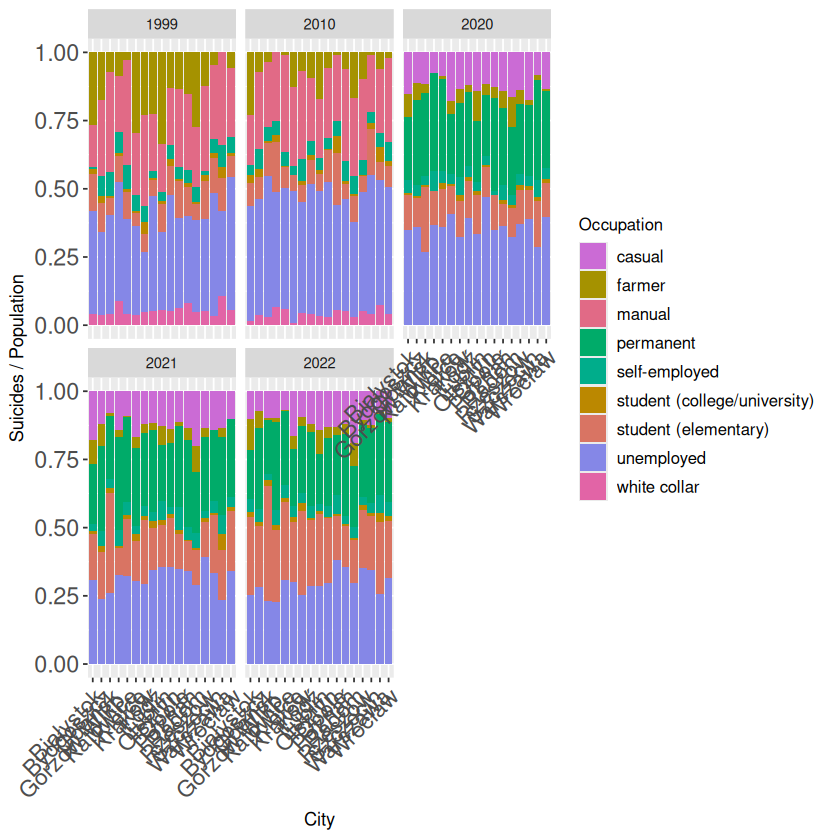

In [265]:
job_city_op %>% filter(Year %in% c(1999,2010,2020,2021,2022) & Outcome == "Attempted") %>%
    ggplot(aes(x=City,y=`Suicides / Population`)) +
    geom_bar(stat="identity", aes(fill=Occupation), position="fill") +
    scale_fill_manual(values=randomized_colors)+
    facet_wrap(~Year) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))->p
    #theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p

In [266]:
ggsave(filename = paste(save_to, "job_city_att_suicides-991020.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

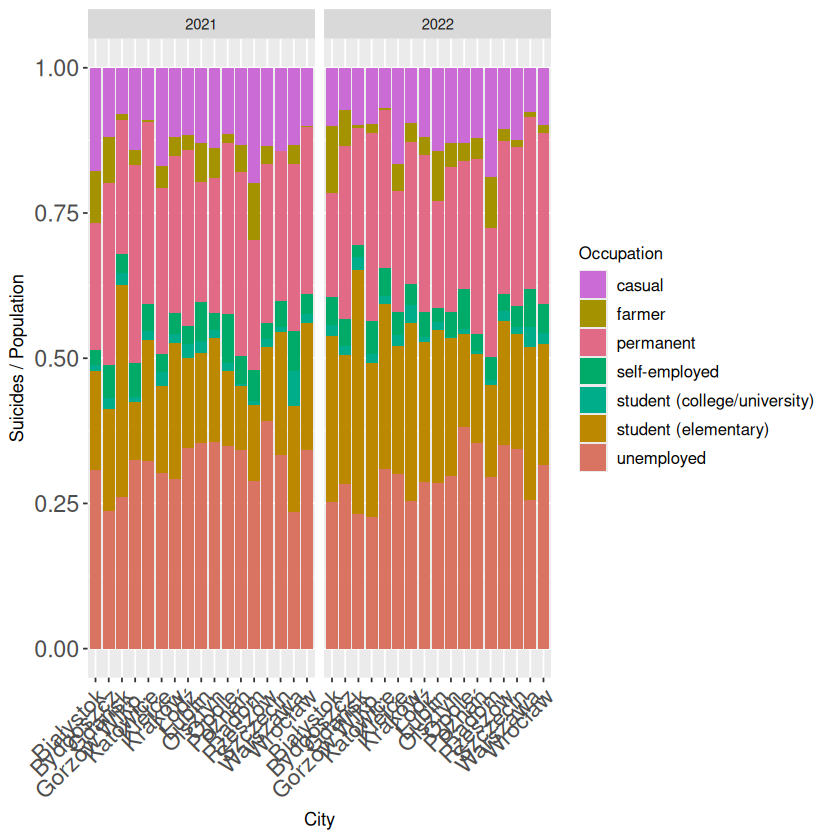

In [267]:
job_city_op %>% filter(Year %in% c(2021,2022) & Outcome == "Attempted") %>%
    ggplot(aes(x=City,y=`Suicides / Population`)) +
    geom_bar(stat="identity", aes(fill=Occupation), position="fill") +
    scale_fill_manual(values=randomized_colors)+
    facet_wrap(~Year) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))->p
    #theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p


In [268]:
ggsave(filename = paste(save_to, "job_city_att_suicides-2122.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

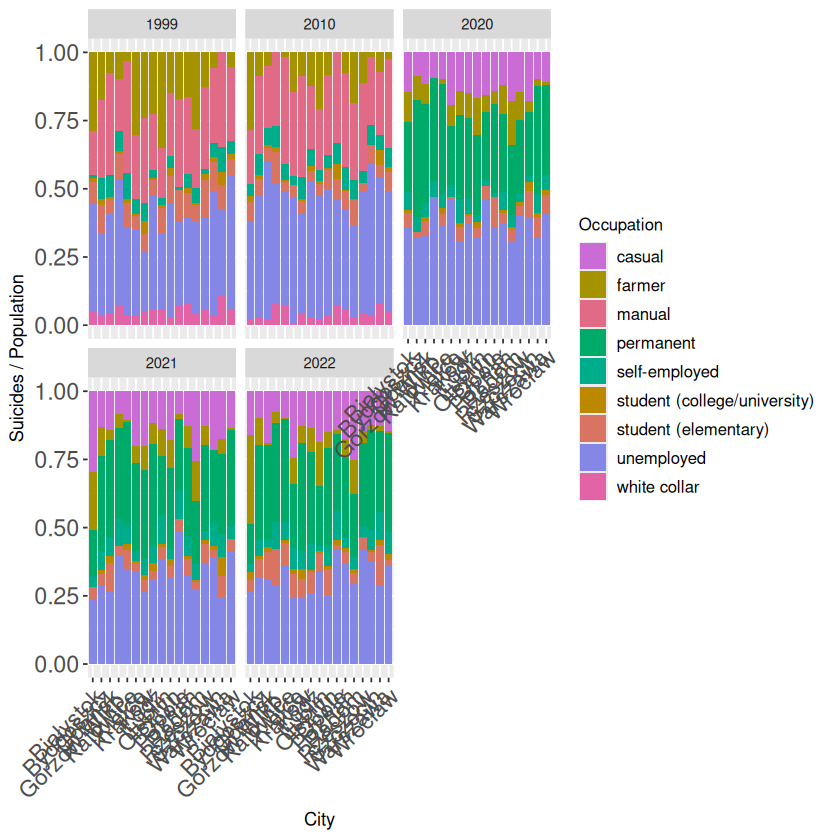

In [269]:

job_city_op %>% filter(Year %in% c(1999,2010,2020,2021,2022) & Outcome == "Fatal") %>%
    ggplot(aes(x=City,y=`Suicides / Population`)) +
    geom_bar(stat="identity", aes(fill=Occupation), position="fill") +
    scale_fill_manual(values=randomized_colors)+
    facet_wrap(~Year) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))->p
    #theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p

In [270]:
ggsave(filename = paste(save_to, "job_city_fat_suicides-991020.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

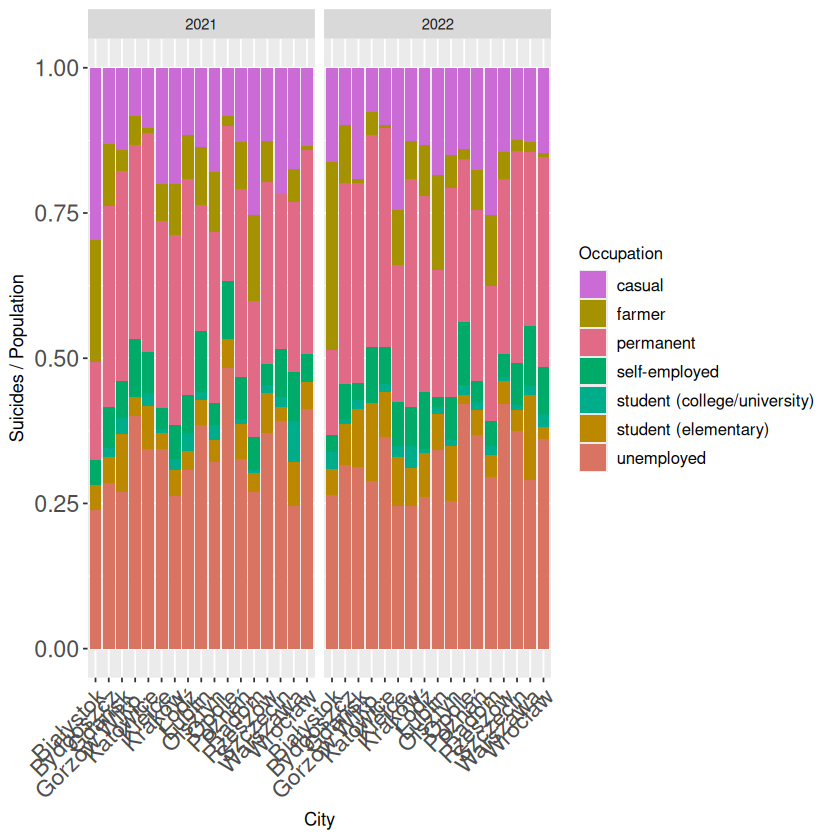

In [271]:
job_city_op %>% filter(Year %in% c(2021,2022) & Outcome == "Fatal") %>%
    ggplot(aes(x=City,y=`Suicides / Population`)) +
    geom_bar(stat="identity", aes(fill=Occupation), position="fill") +
    scale_fill_manual(values=randomized_colors)+
    facet_wrap(~Year) +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))->p
    #theme(axis.text.x = element_text(angle = 45, hjust = 1)) -> p
p

In [272]:
ggsave(filename = paste(save_to, "job_city_fat_suicides-2122.pdf", sep=''), plot = p, width = 25, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion fai

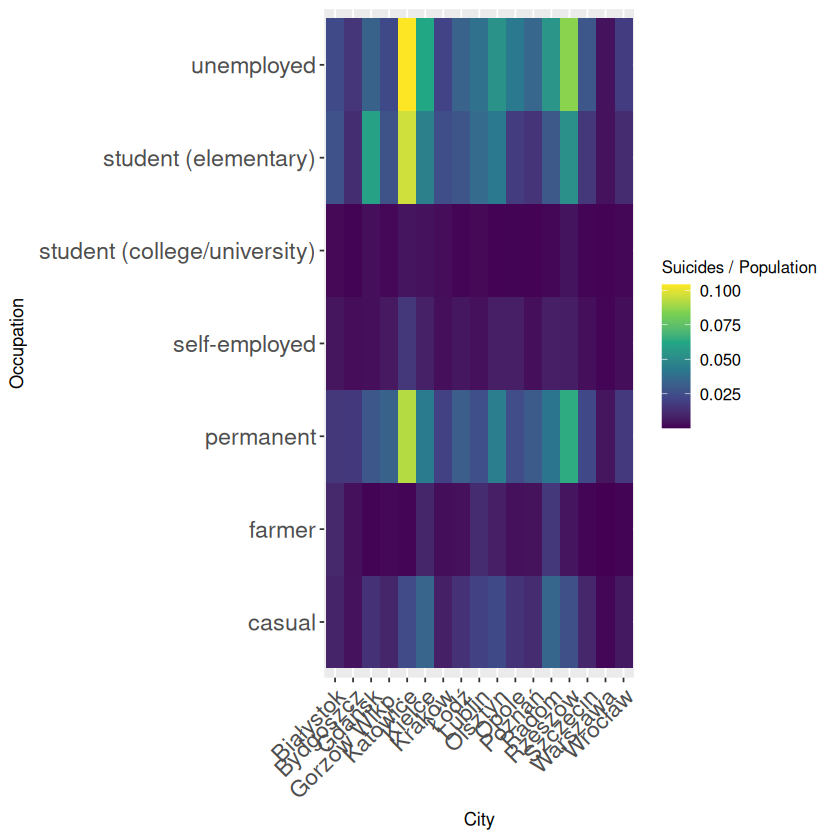

In [273]:
job_city_op %>% filter(Outcome == "Attempted" & Year == 2022) %>%
    ggplot(aes(x=City, y=Occupation, fill=`Suicides / Population`)) +
    geom_tile() +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    #theme(axis.text.x = element_text(angle = 45, hjust = 1))+ 
    scale_fill_viridis_c() -> p
p

In [274]:
ggsave(filename = paste(save_to, "job_city_op-att-2022.pdf", sep=''), plot = p, width = 15, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”


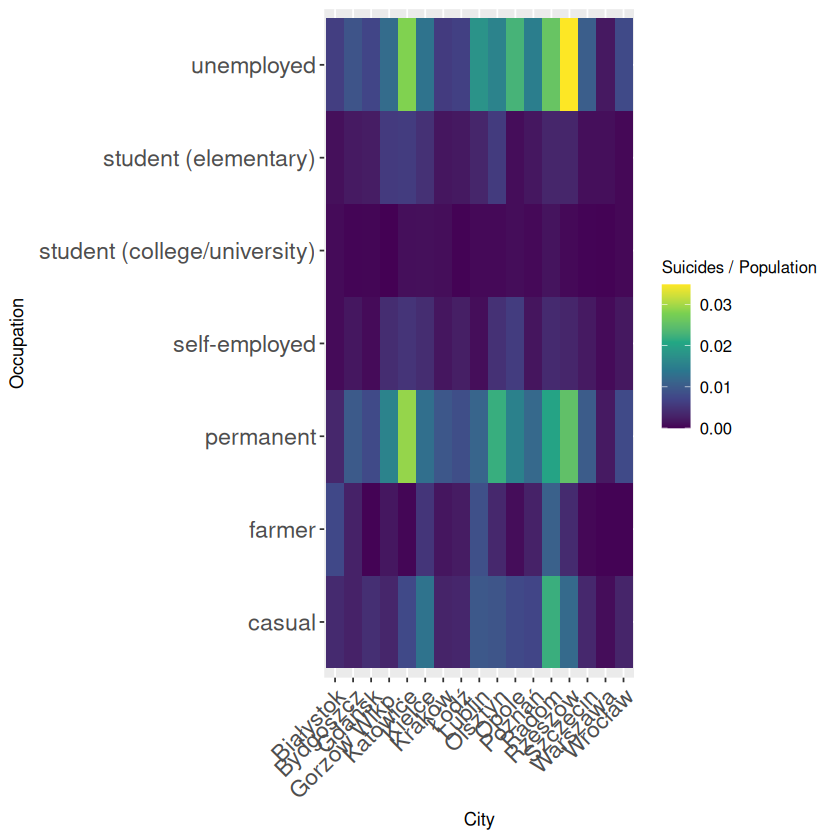

In [275]:
job_city_op %>% filter(Outcome == "Fatal" & Year == 2022) %>%
    ggplot(aes(x=City, y=Occupation, fill=`Suicides / Population`)) +
    geom_tile() +
    theme(legend.title = element_text(size=CLSIZE))+ 
    theme(legend.text = element_text(size=CLXSIZE)) +
    theme(axis.text.y = element_text(hjust = 1, size=CSIZE))+
    theme(axis.text.x = element_text(angle = 45, hjust = 1, size=CSIZE))+ 
    #theme(axis.text.x = element_text(angle = 45, hjust = 1))+ 
    scale_fill_viridis_c() -> p
p

In [276]:
ggsave(filename = paste(save_to, "job_city_op-fat-2022.pdf", sep=''), plot = p, width = 15, height = 15, units = "in", dpi = 300)

Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Białystok' in 'mbcsToSbcs': for ł (U+0142)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Gdańsk' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for Ł (U+0141)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Łódź' in 'mbcsToSbcs': for ź (U+017A)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Poznań' in 'mbcsToSbcs': for ń (U+0144)”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Wrocław' in 'mbcsToSbcs': for ł (U+0142)”
